<img src="header.png" />

# Execution du notebook

Le présent notebook suppose l'arborescence suivante, pour le chargement des données et l'écriture des résultats : 

```bash
├───data
│   ├───processed
│   └───raw
│       └───fr.openfoodfacts.org.products.csv
├───notebooks
│   ├───1_Exploration.ipynb
│   ├───2_Analysis.ipynb
│   └───header.png
└───src
    ├───functions.py
    └───__init__.py
```

# Source des données

https://s3-eu-west-1.amazonaws.com/static.oc-static.com/prod/courses/files/parcours-data-scientist/P2/fr.openfoodfacts.org.products.csv.zip

ou :

https://world.openfoodfacts.org/

# Initialisation du projet

In [1]:
# General
import os
import pickle

# Math & data
import numpy as np
import pandas as pd
from datetime import date
import math

# Graphics
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# ML
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier, KNeighborsRegressor
from sklearn.pipeline import Pipeline

from sklearn.impute import SimpleImputer
from sklearn.impute import KNNImputer

from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

from sklearn.base import BaseEstimator, TransformerMixin

In [3]:
from sklearn import set_config
set_config(display="diagram")

In [ ]:
%load_ext autoreload
# %reload_ext autoreload
%autoreload 2

In [4]:
import DisplotData, DisplotML, PwePwocess, Funktiuns
from DisplotData import bcolors
import MLstuff

In [5]:
# Constants
EPSILON = 1.e-12
TOL = 1.05 # 5% of tolerance for comparisons 
CAL_TO_J = 4.1868

Pour rejouer ou non les longs traitements :

In [6]:
HAVE_TIME = False

Pour sauvegarder les figures :

In [7]:
SAVE_FIGS = False

# Objectif du projet

_1. Traiter le jeu de données, en :_
 - _Réfléchissant à une idée d’application._
 - _Repérant des variables pertinentes pour les traitements à venir, et nécessaires pour votre idée d’application._
 - _Nettoyant les données en :_
     - _mettant en évidence les éventuelles valeurs manquantes, avec au moins 3 méthodes de traitement adaptées aux variables concernées,_
     - _identifiant et en quantifiant les éventuelles valeurs aberrantes de chaque variable._
 - _Automatisant ces traitements pour éviter de répéter ces opérations._
 
_2. Tout au long de l’analyse, produire des visualisations afin de mieux comprendre les données. Effectuer une analyse univariée pour chaque variable intéressante, afin de synthétiser son comportement._

_3. Confirmer ou infirmer les hypothèses à l’aide d’une analyse multivariée. Effectuer les tests statistiques appropriés pour vérifier la significativité des résultats._

_4. Justifier votre idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts._

_5. Rédiger un rapport d’exploration et pitcher votre idée durant la soutenance du projet._

# Description des variables

https://world.openfoodfacts.org/data/data-fields.txt

# Chargement des données

In [8]:
data_raw_dir = '../data/raw/'
data_processed_dir = '../data/processed/'

Le fichier CSV a pour séparateur le caractère tabulation.

In [10]:
df_init = pd.read_csv(data_raw_dir+'fr.openfoodfacts.org.products.csv', delimiter='\t')

C:\Users\a072108\AppData\Local\Temp\ipykernel_23424\3817663454.py:1: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  df_init = pd.read_csv(data_raw_dir+'fr.openfoodfacts.org.products.csv', delimiter='\t')


Le warning :
```
C:\Users\a072108\AppData\Roaming\Python\Python37\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)
```  
nous apprend des choses ! <span class="mark">On va devoir homogénéiser le type de ces colonnes lors de la phase de nettoyage.</span> Il s'agit des colonnes : 

In [11]:
problematic_colnums = (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48)
problematic_cols = [df_init.columns[n] for n in problematic_colnums]
problematic_cols

['code',
 'created_t',
 'last_modified_t',
 'manufacturing_places',
 'manufacturing_places_tags',
 'emb_codes',
 'emb_codes_tags',
 'first_packaging_code_geo',
 'cities',
 'cities_tags',
 'allergens',
 'allergens_fr',
 'traces',
 'traces_tags',
 'traces_fr',
 'ingredients_from_palm_oil_tags']

In [12]:
df_init.shape

(320772, 162)

# Exploration des données

## Valeurs manquantes

In [13]:
nan_rate = df_init.isna().sum(axis=0).sort_values()/df_init.shape[0]*100.

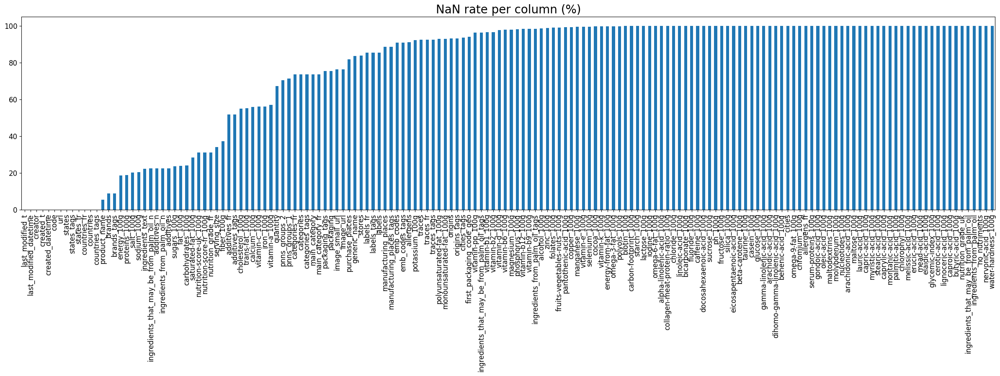

In [17]:
plt.rcParams['figure.figsize'] = [30, 6]
plt.rcParams['axes.titlesize'] = 20
plt.rcParams['axes.labelsize'] = 14
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

nan_rate.plot(kind='bar')
plt.title('NaN rate per column (%)');

Moche, mais on peut voir un dernier coude se former à environ 95%, examinons les colonnes à plus de 95% de NaN :

In [18]:
nan_rate

last_modified_t                            0.000000
last_modified_datetime                     0.000000
creator                                    0.000623
created_t                                  0.000935
created_datetime                           0.002806
                                            ...    
ingredients_that_may_be_from_palm_oil    100.000000
ingredients_from_palm_oil                100.000000
no_nutriments                            100.000000
nervonic-acid_100g                       100.000000
water-hardness_100g                      100.000000
Length: 162, dtype: float64

In [19]:
for row in nan_rate[nan_rate>95.0].index:
    print(row)

vitamin-pp_100g
ingredients_that_may_be_from_palm_oil_tags
vitamin-b1_100g
vitamin-b2_100g
vitamin-d_100g
vitamin-b6_100g
magnesium_100g
phosphorus_100g
vitamin-b12_100g
vitamin-b9_100g
ingredients_from_palm_oil_tags
alcohol_100g
zinc_100g
folates_100g
fruits-vegetables-nuts_100g
pantothenic-acid_100g
copper_100g
manganese_100g
vitamin-e_100g
selenium_100g
cocoa_100g
vitamin-k_100g
energy-from-fat_100g
omega-3-fat_100g
polyols_100g
biotin_100g
carbon-footprint_100g
starch_100g
lactose_100g
iodine_100g
omega-6-fat_100g
alpha-linolenic-acid_100g
collagen-meat-protein-ratio_100g
chloride_100g
linoleic-acid_100g
bicarbonate_100g
fluoride_100g
caffeine_100g
docosahexaenoic-acid_100g
sucrose_100g
ph_100g
fructose_100g
silica_100g
eicosapentaenoic-acid_100g
beta-carotene_100g
taurine_100g
casein_100g
glucose_100g
gamma-linolenic-acid_100g
arachidic-acid_100g
dihomo-gamma-linolenic-acid_100g
behenic-acid_100g
cities
omega-9-fat_100g
chromium_100g
allergens_fr
serum-proteins_100g
gondoic-acid_1

On va sacrifier la variable `glycemic-index_100g` dommage, elle était dans mes idées d'appli.
Autres pertes lourdes : `caffeine_100g`, `glucose_100g`, `omega-9-fat_100g`, pas mal de vitamines ... 

Regardons ce qui est rempli à plus de 50% :

In [20]:
for row in nan_rate[nan_rate<50.0].index:
    print(row)

last_modified_t
last_modified_datetime
creator
created_t
created_datetime
code
url
states
states_tags
states_fr
countries_fr
countries
countries_tags
product_name
brands
brands_tags
energy_100g
proteins_100g
salt_100g
sodium_100g
ingredients_text
ingredients_that_may_be_from_palm_oil_n
additives_n
ingredients_from_palm_oil_n
additives
sugars_100g
fat_100g
carbohydrates_100g
saturated-fat_100g
nutrition-score-uk_100g
nutrition-score-fr_100g
nutrition_grade_fr
serving_size
fiber_100g


Le Nutri-Score est-il toujours renseigné ?

In [21]:
nan_rate['nutrition-score-fr_100g']

31.038245233374482

Ouh bah le **Nutri-Score a 31% de NaN**, càd n'est renseigné qu'à **69%** !

In [22]:
nan_rate['categories']

73.68535907124063

La **catégorie** des produits a 74% de NaN, soit **26%** de valeurs !

In [23]:
nan_rate['packaging']

75.3843851707755

Pas mieux pour le **packaging**, vide à **75%**.

Revenons à un traitement plus graphique du remplissage des indicateurs :

In [24]:
plt.rcParams['figure.figsize'] = [12, 40]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['xtick.labelsize'] = 11
plt.rcParams['ytick.labelsize'] = 11

In [25]:
limit = 75.5 # to get 'packaging'

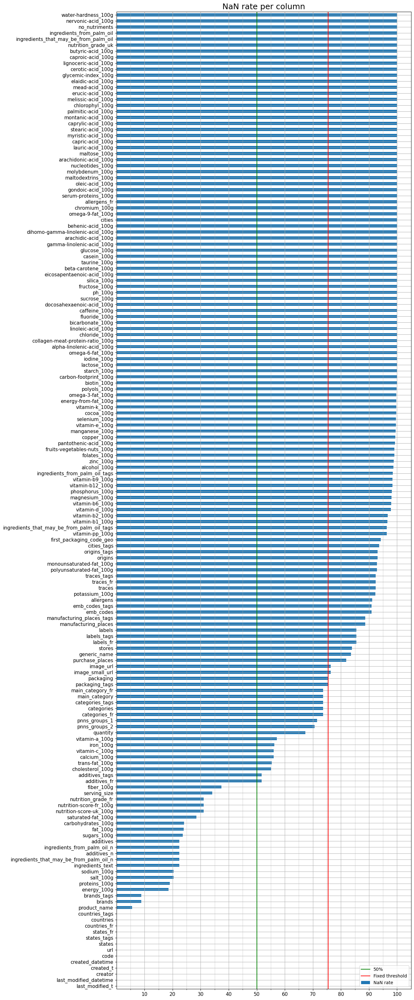

In [26]:
fig, ax = plt.subplots(1, 1)

major_tick = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
minor_tick = [ 5, 15, 25, 35, 45, 55, 65, 75, 85, 95]
ax.set_xticks(major_tick) # Grid
ax.set_xticks(minor_tick, minor=True)
ax.grid(which='both')
ax.grid(which='minor', alpha=0.5)
ax.grid(which='major', alpha=1)

nan_rate.plot(kind='barh',rot=0,grid=True,label='NaN rate') #
plt.axvline(x=50.,color='g',label='50%')
plt.axvline(x=limit,color='r',label='Fixed threshold')
plt.legend(loc='lower right')
plt.title(f'NaN rate per column');

**Constats :** le nombre d'additifs est aussi bien renseigné que l'énergie, les protéines, les matières grasses, sucres (rapides et lents).

On peut se demander si certaines colonnes sont à conserver **pour aider aux imputations**, même si elles ne servent pas au(x) Use Case(s).

Faisons-nous une idée des valeurs les plus fréquentes, dans les données catégorielles.

In [27]:
DisplotData.print_value_counts(df, print_value_counts(df_init)

SyntaxError: incomplete input (2747953957.py, line 1)

La colonne `additives` est bizarrement formée (avec des `[ ]` et des `->` )

Les colonnes `pnns_groups_*` ne sont pas documentées sur le site https://world.openfoodfacts.org/data/data-fields.txt. Après recherches (https://fr.wikipedia.org/wiki/Programme_national_nutrition_sant%C3%A9), elles semblent correspondre à des **groupes d'aliments**, utiles à la création de recommandations.

## Exploration des variables catégorielles

### Marques

#### Colonne `'brands'`

In [32]:
df_init.shape

(320772, 162)

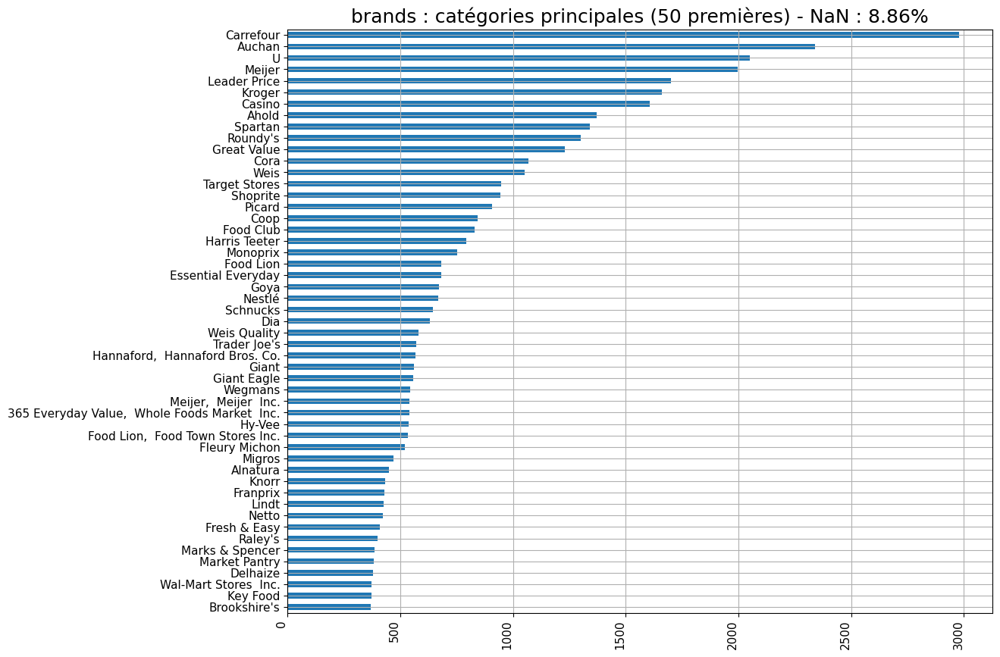

In [33]:
colonne = 'brands'
plt.rcParams['figure.figsize'] = [12, 10]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['xtick.labelsize'] = 11
plt.rcParams['ytick.labelsize'] = 11
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=0.20, show_nan=True)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi=600)

In [34]:
listoune = df_init[colonne].unique()
for elem in listoune:
    print(elem)

Ferme t'y R'nao
nan
Torn & Glasser
Grizzlies
Bob's Red Mill
Unfi
Lundberg
Daddy's Muesli
Equal Exchange
Napa Valley Naturals
Gardentime
Sunridge
Eden
Pcc
Redmond
New England Naturals
Wholesome,  Wholesome Sweeteners
Bluebird Grain
Crown Pacific Fine Foods
Coombs Family
Golden Temple
Napoleon
Vitaspelt
Fairhaven
Viva La Salud
Northgate Market
Not A Branded Item
Kettle,  Kettle Foods
Kid Picks
Bragg
Spectrum
San J
Taste Adventure
Marin
Woodstock
Guistos
Pcc Farmland Trust
Twix, Lundberg
Northgate
Torn & Glasses
Aunt Patty
Alter Eco
Cb's Nuts
Bunny-Luv
Kirkland Signature
Waitrose
Bertrand Lejeune
A&W
St Michel
Alice Délice
Thai import
Bannholz
Fresh & Easy
Giant,  Fresh & Easy
Vita fit
J. D. Gross
Asda,Asda Extra Special
M&m's 
Pepsi
Easter Unlimited Inc.
Bo Frost
Sainsbury's,by sainsbury's
Prima,//Propiedad de://,Bolton Cile España S.A.,//Perteneciente a://,Bolton Group B.V.
7Up,Pepsico
Bijou
Lagg's
Canola Harvest
Today's Temptations
Milkyway
Mcvitie's
Trader Joe's
Sharwood's
allfitnessf

In [35]:
df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains('ellog'))][colonne].unique()

array(["Kellogg's", "kellogg's", 'Kellogs', "Kellogg's,Rice krispies",
       'Kellogg´s', "Kellogs'", 'Kelloggs ', "Kellogg's,Eggo",
       "Kellogg's,Nutri-grain", 'Kellogg', "Kellogg's,Pop Tarts",
       "Kellogg's,Coco Pops", "Kellogg's,All Bran", "Kellogg's,Miel Pops",
       "Kellogg's,Miel pops", "Kellogg's,Frosties", 'Kellog',
       "Kellogg's,Special K", "Kellogg's, Kellogs", 'Kelloggs',
       "kelloggg's", "Kellogg's,Trésor", "kellogg's,Rice krispies",
       "Kellog's", 'Kellogs,Rice krispies',
       "Kelloggs,Choco Krispies, Kellogg's", 'Kelloggs,Rice Krispies',
       "Kellogg's,All-bran", "Kellogg's,Spécial K", "Trésor,Kellogg's",
       "Kellogg's,Smacks", "Kellogg's,Rice Krispies", 'kellogs',
       "Kellogg's,Extra", "Kellogg's,Kellogg's Special K", 'kelloggs',
       'kellogg', "Biscuit Moments,Special K,Kellogg's",
       "Kellogg's,Kellogg's Spécial K", "Kellogg's,Nutri-Grain",
       "Smacks,Kellogg's", "Kellogg's,Special K Cracker Crisps",
       "Kellog's,Nutr

#### Colonne `'brands_tags'`

In [36]:
colonne = 'brands_tags'
df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains('ellog'))][colonne].unique()

array(['kellogg-s', 'kellogs', 'kellogg-s,rice-krispies', 'kelloggs',
       'kellogg-s,eggo', 'kellogg-s,nutri-grain', 'kellogg',
       'kellogg-s,pop-tarts', 'kellogg-s,coco-pops', 'kellogg-s,all-bran',
       'kellogg-s,miel-pops', 'kellogg-s,frosties', 'kellog',
       'kellogg-s,special-k', 'kellogg-s,kellogs', 'kelloggg-s',
       'kellogg-s,tresor', 'kellog-s', 'kellogs,rice-krispies',
       'kelloggs,choco-krispies,kellogg-s', 'kelloggs,rice-krispies',
       'tresor,kellogg-s', 'kellogg-s,smacks', 'kellogg-s,extra',
       'kellogg-s,kellogg-s-special-k',
       'biscuit-moments,special-k,kellogg-s', 'smacks,kellogg-s',
       'kellogg-s,special-k-cracker-crisps', 'kellog-s,nutri-k,special-k',
       'kellogg-s-special-k-crunchy-muesli', 'kellogg-s,toppas',
       'kellogg-s,kellog-s', 'special-k,kellogg-s',
       'ancient-legends,kellogg-s', 'ancient-legends,kellog-s',
       'kellogg-s,kellogg-s-ancient-legends', 'kellogg-s,kellogg-s-extra',
       'special-k,nourish,kell

Il peut y avoir moins de diversité dans les tags que dans les marques... 

In [37]:
listoune = df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains(','))][colonne].unique()
for elem in listoune:
    print(elem)

wholesome,wholesome-sweeteners
kettle,kettle-foods
twix,lundberg
giant,fresh-easy
asda,asda-extra-special
sainsbury-s,by-sainsbury-s
prima,propiedad-de,bolton-cile-espana-s-a,perteneciente-a,bolton-group-b-v
7up,pepsico
tetley,american-power-products-inc
cook-with-m-s,marks-spencer
ritter-sport,alfred-ritter-gmbh-co
ritter-sport,alfred-ritter-gmbh-co-kg
lindt,polo-leathergoods
sobe,healthy-food-brands-llc
simply,simply-natural-foods-llc
welch-s,healthy-food-brands-llc
vintage,vintage-bee
vintage,vintage-bee-inc
vintage,all-american-products-co-inc
kroger,the-kroger-co
kikkoman,kikkoman-corporation
trader-giotto-s,ciel-de-bleu-inc
trader-giotto-s,sk-wear
haribo,haribo-gmbh-co-kg
jfc,jfc-international-inc
lawry-s,mccormick-company-inc
trader-joe-s,supreme-foods-inc
marks-spencer,m-s
simply-m-s,marks-spencer
mark-and-spencer,trader-joe-s
trader-joe-s,learning-horizons
maranatha,the-hain-celestial-group-inc
trader-joe-s,lookingglass-winery
trader-joe-s,sparkling-lighting-mfg-co-ltd
mezzett

Cette variable semble réunir des synonymes (ex : `'meiji'`, `'meiji-seika-s-pte-ltd'`) ou des sous-marques d'une marque donnée (`'lindt'`,`'lindt-sprungli-gmbh'`,`'lindt,lindt-sprungli-usa-inc'`).
Ces tags sont différents d'un produit à l'autre, sauf à réunir tous les tags, <span class="girk">on va se contenter de la variable `'brands'`</span>, déjà avec plusieurs écritures différentes (`'Kellogg's'`, `'Kellogg-s'`).

### Catégories

#### Colonnes `'main_category'`, `'categories_fr'`

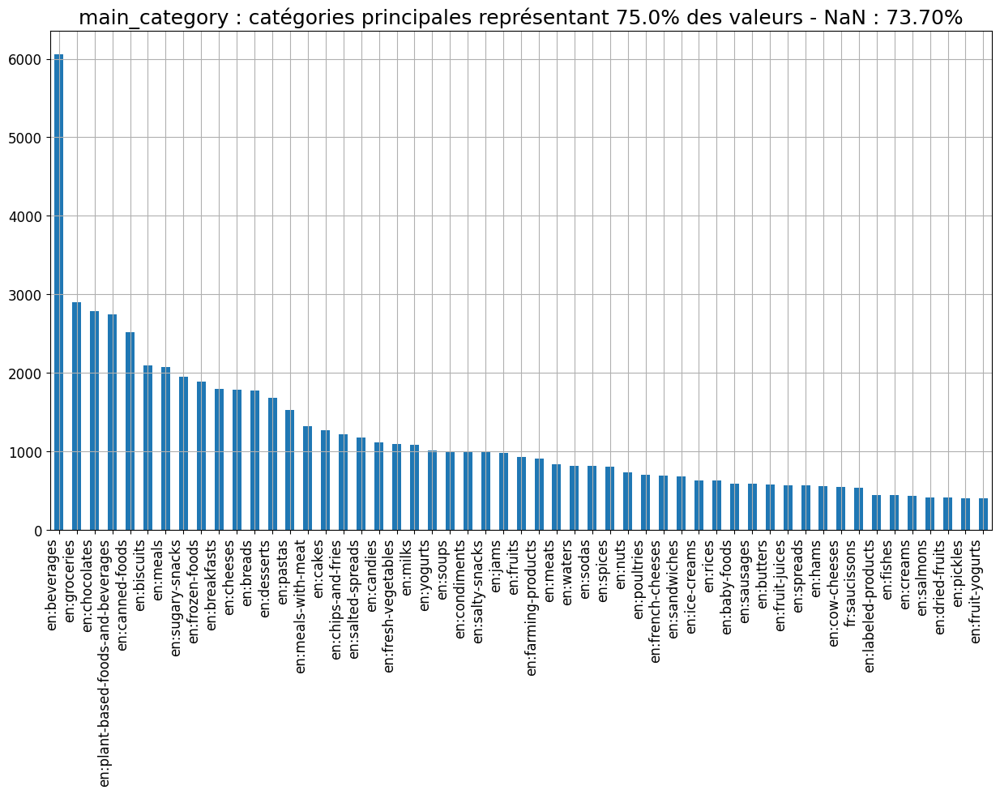

In [38]:
colonne = 'main_category'
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=0.75,max_bar=75,kind='bar',rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)

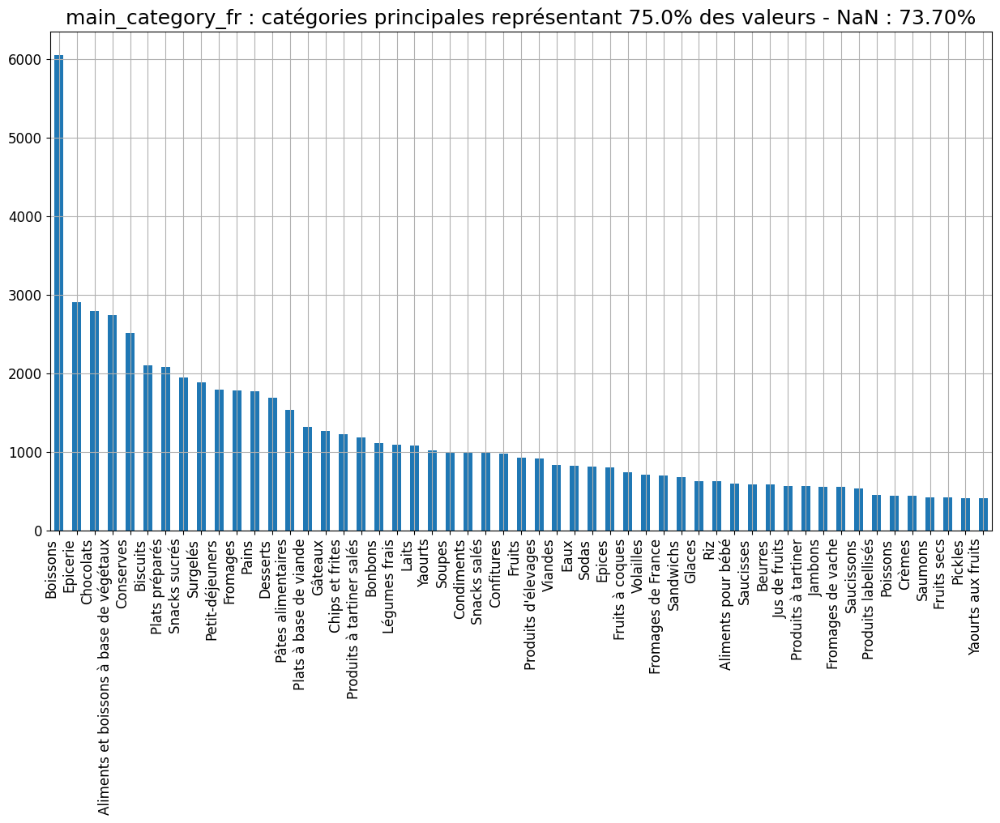

In [39]:
colonne = 'main_category_fr'
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=0.75, max_bar=75, kind='bar', rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi=600)

In [40]:
colonne = 'main_category_fr'
listoune = df_init.loc[(df_init[colonne].notna())][colonne].unique()
print(len(listoune),'\n')
for elem in listoune:
    print(elem)

3543 

Filet-de-boeuf
Légumes frais
Pâtisseries
Pains
Boulange
Aliments et boissons à base de végétaux
Root-bier
Sablés
Plats préparés
Volailles
Bonbons
Thés
Sirops
en:Chicken-feet
Desserts
Gâteaux
Sodas
Condiments
Sodas aux fruits
Compléments alimentaires
Viandes
Chips et frites
Epices
Produits à tartiner
Poissons et viandes et oeufs
Pate-au-foie-de-canard
Cookies
Plats à base de viande
Epicerie
Soupes
en:Carrot-coriander-soup
Champignons
en:Scottish-shortbread
en:Charcuteries
Chocolats
en:Tuna-steaks
Boissons
Fruits
Sandwichs
en:Pear-and-blackcurrant-juice
Farines
Conserves
Yaourts
Huiles
en:Harengs
Confitures
Fromages de vache
Pâtes alimentaires
it:Vinaigre-balsamique
en:Parve
Pickles
en:Lindt-sea-salt-chocolate
en:Pates-a-tartiner-aux-noisettes-et-au-cacao
Pâtes à tartiner
en:Petit-dejeuners
en:Salad
Produits panés
Fruits à coques
Eaux
en:Hoisin-sauce
en:Pumpkin-seed-pecan
en:Rice-candy
Surgelés
Tartes
Sauce-aux-piments
Crustacés
Biscuits
en:Vanilla-soymilk
Petit-déjeuners
en:Diet-

<span class="mark">Des `'en:...'` et `'it:...'` trainent dans la version fr des catégories</span> (ex : `'en:Pates-a-tartiner-aux-noisettes-et-au-cacao'`, `'it:Vinaigre-balsamique'` et même `'xx:Attiksgurka'`)

In [41]:
colonne = 'main_category_fr'
listoune = df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains('en:'))][colonne].unique()
print(len(listoune),'\n')
for elem in listoune:
    print(elem)

1172 

en:Chicken-feet
en:Carrot-coriander-soup
en:Scottish-shortbread
en:Charcuteries
en:Tuna-steaks
en:Pear-and-blackcurrant-juice
en:Harengs
en:Parve
en:Lindt-sea-salt-chocolate
en:Pates-a-tartiner-aux-noisettes-et-au-cacao
en:Petit-dejeuners
en:Salad
en:Hoisin-sauce
en:Pumpkin-seed-pecan
en:Rice-candy
en:Vanilla-soymilk
en:Diet-colas
en:Tea-drinks
en:Tomato-ketchup
en:Jamaican-jerk
en:Caramel-popcorn
en:Semolina
en:Eau-de-vie
en:Baked-beans
en:Barbeque-sauce
en:Cinnamon-raisin-bagels
en:Snacks
en:Honey-roasted-sliced-almonds
en:Steak-pie
en:Unsalted-butter
en:Lemongrass-paste
en:Ribbon-noodles
en:Cake-mix
en:Mashed-potatoes
en:Granola-mix
en:Mix
en:Coconut-creams
en:Coconut-waters
en:Coconut-water
en:Bison
en:Multivitamin-supplement
en:Preparation-for-dessert
en:Cucumbers-in-brine
en:Beef-jerky
en:Peels
en:Carbonated-soda-water
en:Instant-dry-yeast
en:Chocolate-chip-cookies
en:Cereales
en:Venison-burger
en:Grated-parmesan-cheese
en:Pitta-bread
en:Balsamic-vinaigrette-dressing
en:Ma

In [42]:
colonne = 'main_category_fr'
listoune = df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains('it:'))][colonne].unique()
print(len(listoune),'\n')
for elem in listoune:
    print(elem)

155 

it:Vinaigre-balsamique
it:Pancetta
it:Terre-siciliane
it:Formaggio-fuso
it:Cioccolata-calda
it:Petit-dejeuners
it:Biscotti
it:Mezzi-rigatoni
it:Fusilli-bucati
it:Ctg-a
it:Aliments-d-origine-vegetale
it:Antipasto
it:Pate
it:Prosciutto-cotto
it:Dolci
it:Yogurt-alla-greca
it:Cioccolatini
it:Lavande-fleur
it:Haricots-verts-en-conserve
it:Coquillettes
it:Charcuteries
it:Aceto
it:Aperifitf
it:Alcool
it:Penne-rigate
it:Bibita-gassata
it:Lattiero-caseario
it:Proscuitto-di-parma
it:Pappardelle-all-uovo
it:Latte-uht-omogeneizzato
it:Caffe
it:Dadi-per-brodo
it:Zucchero
it:Boissons
it:Snack
it:Cioccolato
it:Burro
it:Cacao-amaro
it:Croccantini
it:Nettari
it:Wafers-al-cioccolato
it:Pecorino
it:Grappa
it:Merendina
it:Liquori
it:Conserve
it:Orzo-solubile
it:Succhi-concentrati
it:Acqua-minerale
it:Panna
it:Mais
it:Sughi
it:Tonno-con-verdure-e-legumi
it:Condiriso
it:Colomba
it:Riso
it:Birre
it:Fette-biscottate
it:Ricotta
it:Pate-de-ble-dur
it:Piselli
it:Succhi
it:Crema
it:Confiture-biologique
it:C

Malgré tout la colonne `'main_category_fr'` semble assez propre. Est-on sûr d'avoir une seule valeur dans cette colonne ?

In [43]:
listoune = df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains(','))][colonne].unique()
print(len(listoune),'\n')
for elem in listoune:
    print(elem)

0 



Yes ! La colonne `'main_category_fr'` va nous aider crucialement à trouver des produits de substitution.

#### Colonne `'categories'`

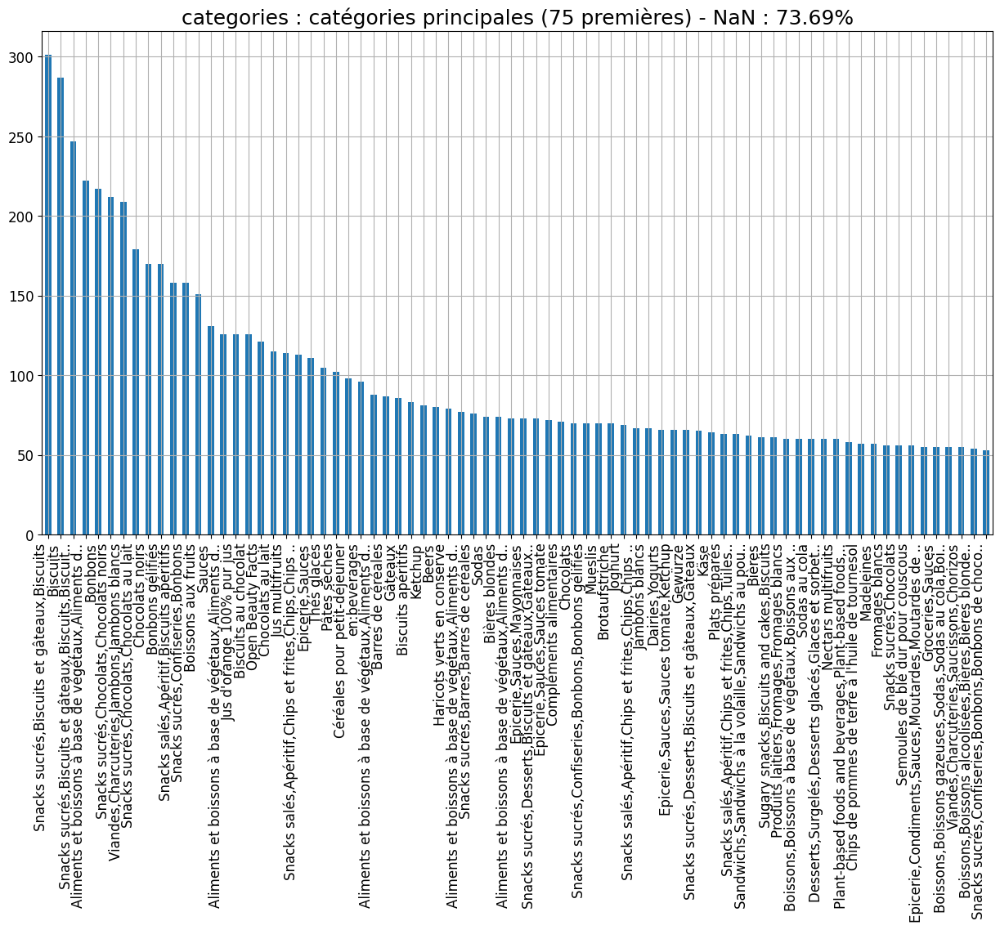

In [44]:
colonne = 'categories'
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=0.10, max_bar=75, kind='bar', rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi=600)

On peut vérifier que la variable `'categories'` est très souvent une **liste de valeurs**. Il ne sera pas facile de déterminer les produits équivalents à un produit donné, si les tags sont "variables" selon la motivation des contributeurs.

```
Snacks sucrés,Biscuits et gâteaux,Biscuits 301
Biscuits 287
Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat 247
```

On devra possiblement gérer des **ensembles (`set`) de tags** pour connecter deux produits.

In [45]:
df_init.loc[df_init['categories']=='Snacks sucrés,Biscuits et gâteaux,Biscuits']

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
27502,31784989021,http://world-fr.openfoodfacts.org/produit/0031...,teolemon,1387283630,2013-12-17T12:33:50Z,1447321898,2015-11-12T09:51:38Z,Biscuits danois,NaN,454 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67407,64042006390,http://world-fr.openfoodfacts.org/produit/0064...,dilia,1391105516,2014-01-30T18:11:56Z,1454318109,2016-02-01T09:15:09Z,Leclerc Célébration,Batonnets de biscuits enrobés de chocolat noir,270 g,...,NaN,NaN,NaN,NaN,NaN,NaN,20.0,20.0,NaN,NaN
85801,741538,http://world-fr.openfoodfacts.org/produit/0074...,agamitsudo,1425804495,2015-03-08T08:48:15Z,1491142373,2017-04-02T14:12:53Z,Ginger snaps,biscuits au gingembre,250 g,...,NaN,NaN,NaN,NaN,NaN,NaN,18.0,18.0,NaN,NaN
115686,428041425208,http://world-fr.openfoodfacts.org/produit/0428...,openfoodfacts-contributors,1401083721,2014-05-26T05:55:21Z,1459199113,2016-03-28T21:05:13Z,Prince,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
174839,1201509270003,http://world-fr.openfoodfacts.org/produit/1201...,aleene,1484499914,2017-01-15T17:05:14Z,1484503830,2017-01-15T18:10:30Z,Sockerfria Kakor Havre,NaN,"160 g, 9 pièces",...,NaN,NaN,NaN,NaN,NaN,NaN,20.0,20.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312034,8480017487094,http://world-fr.openfoodfacts.org/produit/8480...,aleene,1439903470,2015-08-18T13:11:10Z,1449421561,2015-12-06T17:06:01Z,Cigarettes fines,Biscuits roulés croustillant,2x 100g (14 portions),...,NaN,NaN,NaN,NaN,NaN,NaN,24.0,24.0,NaN,NaN
312345,85119871,http://world-fr.openfoodfacts.org/produit/8511...,bassit,1446852215,2015-11-06T23:23:35Z,1448127529,2015-11-21T17:38:49Z,Petit clown noir,Biscuit,150 g,...,NaN,NaN,NaN,NaN,NaN,NaN,24.0,24.0,NaN,NaN
313288,8710412545045,http://world-fr.openfoodfacts.org/produit/8710...,gauthier-de-geest,1481095775,2016-12-07T07:29:35Z,1481101715,2016-12-07T09:08:35Z,Sultana fruitbiscuit pomme,Biscuit fourré aux fruits,218g,...,NaN,NaN,NaN,NaN,NaN,NaN,11.0,11.0,NaN,NaN
315854,8719153005498,http://world-fr.openfoodfacts.org/produit/8719...,saturnine,1465420755,2016-06-08T21:19:15Z,1465421449,2016-06-08T21:30:49Z,Biscuits coco et canneberges - BioWise - 175 g,Biscuits croquants à la noix de coco et aux ca...,175 g,...,NaN,NaN,NaN,NaN,NaN,NaN,16.0,16.0,NaN,NaN


In [46]:
df_init.loc[df_init['categories']=='Snacks sucrés,Biscuits et gâteaux,Biscuits,Biscuits au chocolat']

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
35826,39047011496,http://world-fr.openfoodfacts.org/produit/0039...,tacinte,1445784973,2015-10-25T14:56:13Z,1446034301,2015-10-28T12:11:41Z,Pure Butter Chocolate Chip Shortbread,Sablés pur beurre,125 g,...,NaN,NaN,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN
66829,59800491075,http://world-fr.openfoodfacts.org/produit/0059...,tacite,1428694369,2015-04-10T19:32:49Z,1439141754,2015-08-09T17:35:54Z,Bouchées Coffee Crisp Bites,NaN,210 g,...,NaN,NaN,NaN,NaN,NaN,NaN,26.0,26.0,NaN,NaN
80636,72417153181,http://world-fr.openfoodfacts.org/produit/0072...,tacite,1432303872,2015-05-22T14:11:12Z,1432381741,2015-05-23T11:49:01Z,Finger blanc,Biscuits craquants enrobés de chocolat blanc,114 g,...,NaN,NaN,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN
146941,793573781055,http://world-fr.openfoodfacts.org/produit/0793...,tacite,1428772294,2015-04-11T17:11:34Z,1450209108,2015-12-15T19:51:48Z,Choco Stix,NaN,135 g,...,NaN,NaN,NaN,NaN,NaN,NaN,22.0,22.0,NaN,NaN
176505,2000000038139,http://world-fr.openfoodfacts.org/produit/2000...,foodcare,1478618192,2016-11-08T15:16:32Z,1478619184,2016-11-08T15:33:04Z,NaN,NaN,230 g.,...,NaN,NaN,NaN,NaN,NaN,NaN,11.0,11.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312000,8480017393029,http://world-fr.openfoodfacts.org/produit/8480...,openfoodfacts-contributors,1429374784,2015-04-18T16:33:04Z,1458509806,2016-03-20T21:36:46Z,Petit beurre au chocolat au lait et aux noisettes,Biscuits au beurre avec une tablette de chocol...,150 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
312115,8480017634481,http://world-fr.openfoodfacts.org/produit/8480...,tacite,1433773417,2015-06-08T14:23:37Z,1434709014,2015-06-19T10:16:54Z,Petit beurre au chocolat blanc,NaN,150 g,...,NaN,NaN,NaN,NaN,NaN,NaN,26.0,26.0,NaN,NaN
313403,8710445585209,http://world-fr.openfoodfacts.org/produit/8710...,openfoodfacts-contributors,1397479210,2014-04-14T12:40:10Z,1445091949,2015-10-17T14:25:49Z,sandwich biscuit,NaN,300 g,...,NaN,NaN,NaN,NaN,NaN,NaN,17.0,17.0,NaN,NaN
318638,9271090307008,http://world-fr.openfoodfacts.org/produit/9271...,openfoodfacts-contributors,1429636887,2015-04-21T17:21:27Z,1492701394,2017-04-20T15:16:34Z,Pépites de chocolat,"Biscuits au chocolat, riche en magnésium, calc...",250 g (6 sachets de 2 biscuits),...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Regardons un peu moins de colonne dans les affichages :

In [47]:
col_kept = ['product_name',
            'generic_name',
            'brands',
            'brands_tags',
            'main_category',
            'main_category_fr',
            'categories',
            'categories_fr',
            'categories_tags',
            'pnns_groups_1',
            'pnns_groups_2',
            'quantity',
            'serving_size',
            'nutrition_grade_fr',
            'additives_n',
            'ingredients_text',
            'ingredients_from_palm_oil_tags',
            'ingredients_from_palm_oil_n',
            'ingredients_that_may_be_from_palm_oil_n',
            'labels_fr',
#             'additives',
#             'energy_100g',
#             'proteins_100g',
#             'fat_100g',
#             'saturated-fat_100g',
#             'sugars_100g',
#             'carbohydrates_100g',
#             'salt_100g',
#             'fiber_100g',
#             'cholesterol_100g',
#             'trans-fat_100g',
#             'calcium_100g',
#             'vitamin-c_100g',
#             'iron_100g',
#             'vitamin-a_100g',
#             'packaging',
#             'packaging_tags',
#             'labels',
#             'ingredients_that_may_be_from_palm_oil_tags',
#             'ingredients_from_palm_oil_tags'
           ]

In [48]:
colonne = 'categories_fr'
categ = 'Snacks salés,Apéritif,Chips et frites,Chips,Chips de maïs'
df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains(categ))][col_kept]

,product_name,generic_name,brands,brands_tags,main_category,main_category_fr,categories,categories_fr,categories_tags,pnns_groups_1,pnns_groups_2,quantity,serving_size,nutrition_grade_fr,additives_n,ingredients_text,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,labels_fr
23711,Fritos,Fritos`,Fristo,fristo,en:chips-and-fries,Chips et frites,Corn chips,"Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,28.3 g,NaN,c,0.0,"Sodium 7%, Total carbohydrate 5%, Dietary Fibe...",NaN,0.0,0.0,NaN
23728,Simply Natural Blue Corn Tortilla Chips,NaN,"Tostitos,Fritolay","tostitos,fritolay",en:chips-and-fries,Chips et frites,"Tortilla chips,Corn chips","Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,9 oz,1 oz (28 g),b,0.0,"Organic Blue Corn, Expeller-Pressed Sun flower...",NaN,0.0,0.0,"Bio,Kascher,Sans conservateurs,Sans colorants ..."
23745,Doritos Nacho Cheese,Tortilla chips,Doritos,doritos,en:chips-and-fries,Chips et frites,": Salty snacks,Appetizers,Chips and fries,Cris...","Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,1 oz,1 package,b,7.0,"Corn, vegetable oil (sunflower, canola, and/or...",NaN,0.0,0.0,NaN
23747,Doritos Cool Ranch,Tortilla Chips,Doritos,doritos,en:chips-and-fries,Chips et frites,"Salty snacks,Appetizers,Chips and fries,Crisps...","Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,1 oz (28.3 g),1 package (28.3 g),d,9.0,"Corn vegetable oil (corn, canola, and/or sunfl...",NaN,0.0,0.0,NaN
96212,Certified Organic Tortilla Chips,NaN,Casa Sanchez,casa-sanchez,en:chips-and-fries,Chips et frites,"Salty snacks,Appetizers,Chips and fries,Crisps...","Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,14 oz (396 g),1 oz (28 g),a,0.0,"Organic Corn, Organic Canola Oil",NaN,0.0,0.0,"Peu ou pas de sel,Bio,Sans gluten,USDA Organic..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
316204,Tortilla chips,Nachos o tortilla chips. Producto de aperitivo...,"Nachips,Old El Paso,//Propiedad de://,Pet Inc....","nachips,old-el-paso,propiedad-de,pet-inc,perte...",en:chips-and-fries,Chips et frites,Corn chips,"Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,200 g,50 g,b,0.0,"Harina de maíz, aceite de girasol alto oleico ...",NaN,0.0,0.0,"Végétarien,Végétalien"
317374,Tortilla Corn Chips - Cheese Supreme,NaN,Pringles,pringles,en:chips-and-fries,Chips et frites,Corn Chips,"Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,130g,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
319330,Doritos Roulette,NaN,"Doritos,The Smiths Snackfood Company LTD,Pepsi...","doritos,the-smiths-snackfood-company-ltd,pepsi...",en:chips-and-fries,Chips et frites,"Salty snacks,Appetizers,Chips and fries,Crisps...","Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,150g,27g (about 11 chips),d,0.0,"CORN, VEGETABLE OIL, CHEESE POWDER (MILK), SAL...",NaN,0.0,0.0,NaN
319332,Nacho Cheese,NaN,"Doritos,PepsiCo","doritos,pepsico",en:chips-and-fries,Chips et frites,Corn Chips,"Snacks salés,Apéritif,Chips et frites,Chips,Ch...","en:salty-snacks,en:appetizers,en:chips-and-fri...",Salty snacks,Appetizers,170g,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
df_init.loc[df_init['product_name']=='Pépites de chocolat'][['product_name','generic_name','brands','categories','countries','states_fr']]

,product_name,generic_name,brands,categories,countries,states_fr
187838,Pépites de chocolat,NaN,Biscuiterie Albisser,"Snacks sucrés,Chocolats",France,"A vérifier,Complet,Informations nutritionnelle..."
239954,Pépites de chocolat,NaN,Carrefour,NaN,France,"A compléter,Informations nutritionnelles compl..."
242948,Pépites de chocolat,NaN,"Tablier Blanc,Marque Repère",NaN,France,"A compléter,Informations nutritionnelles à com..."
246184,Pépites de chocolat,Pépites de chocolat,Auchan,Pépites de chocolat,France,"A vérifier,Complet,Informations nutritionnelle..."
251654,Pépites de chocolat,NaN,Jean-Louis Bassinet,"Pépites de chocolat,Chocolats",France,"A vérifier,Complet,Informations nutritionnelle..."
318638,Pépites de chocolat,"Biscuits au chocolat, riche en magnésium, calc...",Gerblé,"Snacks sucrés,Biscuits et gâteaux,Biscuits,Bis...",France,"A compléter,Informations nutritionnelles à com..."


On va bien rigoler.

D'autre part, on ne voit pas trop quelle différence il y a entre la variable `'categories'`, `'categories_tags'` et `'categories_fr'`. Regardons quelques lignes de produits pour ces 3 colonnes :

In [50]:
df_init[['product_name','brands','categories','categories_tags','categories_fr']].tail(20)

,product_name,brands,categories,categories_tags,categories_fr
320752,NaN,NaN,Colas,"en:beverages,en:carbonated-drinks,en:sodas,en:...","Boissons,Boissons gazeuses,Sodas,Sodas au cola..."
320753,Lager,Carib,Bières blondes,"en:beverages,en:alcoholic-beverages,en:beers,e...","Boissons,Boissons alcoolisées,Bières,Bières bl..."
320754,nf test,NaN,NaN,NaN,NaN
320755,NaN,NaN,fr:Pâtes à tartiner aux noisettes et au cacao,"en:spreads,en:breakfasts,en:sweet-spreads,fr:p...","Produits à tartiner,Petit-déjeuners,Produits à..."
320756,Test NF App,NaN,NaN,NaN,NaN
320757,Amandes,Biosic,NaN,NaN,NaN
320758,Miel de Camargue,L. Boulaire,Miels français,"en:spreads,en:breakfasts,en:sweet-spreads,en:b...","Produits à tartiner,Petit-déjeuners,Produits à..."
320759,Лимон — лайм,Пеликан,"Лайм,Limes","en:plant-based-foods-and-beverages,en:plant-ba...","Aliments et boissons à base de végétaux,Alimen..."
320760,Poireaux,NaN,NaN,NaN,NaN
320761,Roussette du Bugey (2011),Roussette du Bugey,"Boissons,Boissons alcoolisées,Vins,Vins blancs...","en:beverages,en:alcoholic-beverages,en:wines,e...","Boissons,Boissons alcoolisées,Vins,Vins frança..."


D'après la documentation, `'categories_fr'` est la version (plus ou moins bien) traduite de `'categories_tags'`. Donc on abandonnera 
`'categories_tags'`.

Ensuite, pour certains produits, `'categories'` est un peu plus précis que `'categories_fr'`. Exemple :

`Miels français|en:spreads,en:breakfasts,en:sweet-spreads,en:b...|Produits à tartiner,Petit-déjeuners,Produits à...`

**Conclusion :**
<span class="mark">Si l'on doit</span> pousser l'information de catégorie d'un ou plusieurs produits au-delà de sa `'main_category_fr'`, <span class="mark">on utilisera la variable `'categories'` **et** `'categories_fr'` pour associer deux produits</span>.

#### Colonne `'pnns_groups_1'`

In [51]:
df_init['pnns_groups_1'].unique()

array([nan, 'unknown', 'Fruits and vegetables', 'Sugary snacks',
       'Cereals and potatoes', 'Composite foods', 'Fish Meat Eggs',
       'Beverages', 'Fat and sauces', 'fruits-and-vegetables',
       'Milk and dairy products', 'Salty snacks', 'sugary-snacks',
       'cereals-and-potatoes', 'salty-snacks'], dtype=object)

`'Sugary snacks'` et `'sugary-snacks'` se marchent sur les pieds. Idem pour `'Cereals and potatoes'` et `'cereals-and-potatoes'`, `'Fruits and vegetables'` et `'fruits-and-vegetables'` mais c'est rattrapable.

Par contre, sur cette seule catégorisation, on risque de remplacer une banane pas bio par une courgette bio (si c'est le sens de l'appli). Ou un hachis parmentier (`'Salty snacks'`) avec additifs par des raviolis à la crevette sans additifs.

<span class="girk">La seule info `'pnns_groups_1'` ne sera clairement pas suffisante, mais elle peut venir compléter le filtrage par `'main_category_fr'`.</span>

- [X] **⇨ Nettoyage à faire :** fusion des valeurs manifestement identiques de `'pnns_groups_1'`

#### Colonne `'pnns_groups_2'`

In [52]:
df_init['pnns_groups_2'].unique()

array([nan, 'unknown', 'Vegetables', 'Biscuits and cakes', 'Bread',
       'Legumes', 'Pizza pies and quiche', 'Meat', 'Sweets',
       'Non-sugared beverages', 'Sweetened beverages',
       'Dressings and sauces', 'One-dish meals', 'vegetables', 'Soups',
       'Chocolate products', 'Alcoholic beverages', 'Fruits', 'Sandwich',
       'Cereals', 'Milk and yogurt', 'Fats', 'Cheese', 'Appetizers',
       'Nuts', 'Breakfast cereals', 'Artificially sweetened beverages',
       'Fruit juices', 'Eggs', 'Fish and seafood', 'Dried fruits',
       'Ice cream', 'Processed meat', 'Potatoes', 'Dairy desserts',
       'Fruit nectars', 'pastries', 'Tripe dishes', 'fruits',
       'Salty and fatty products', 'cereals', 'legumes', 'nuts'],
      dtype=object)

Même remarque pour les catégories synonymes : `'Vegetables'` et `'vegetables'`, `'Fruits'` et `'fruits'`, etc. Et même remarque sur le fait de caractériser un produit : les Frosties `'Breakfast cereals'` (pétales de maïs sucrés), se verront-ils suggérer du blé soufflé au chocolat ?

<span class="girk">De même que `'pnns_groups_1'` et  `'main_category_fr'`, cette seule info `'pnns_groups_2'` ne sera pas suffisante, mais elle peut venir compléter le filtrage par ces deux informations.</span>

- [X] **Nettoyage à faire :** fusion des valeurs manifestement identiques de pnns_groups_2

- [X] **Nettoyage à faire :** Transformer les 'unknown' en NaN avant tout KNN etC.

#### Bilan des colonnes de catégorie

In [54]:
col_categ = ['main_category_fr', 'categories_fr',
             'pnns_groups_1', 'pnns_groups_2', 'ingredients_text']
for col in col_categ:
    print(f'{col}: {len(df_init[col].unique())}, {nan_rate[col]:.2f}%')

main_category_fr: 3544, 73.70%
categories_fr: 21153, 73.69%
pnns_groups_1: 15, 71.47%
pnns_groups_2: 43, 70.54%
ingredients_text: 205521, 22.39%


Plus de 21000 catégories distinctes, ça éclate les produits. Repérer la proximité de 2 produits par le nombre de valeurs de catégories en commun paraît plus sain.

**⇨ Ou, dans l'idée de points communs, par ingrédients, beaucoup mieux documentés (22% de `NaN`).**

#### Caractérisation d'un produit que c'est le même mais en différent 

On a vu que les variables `pnns_groups_1` et `pnns_groups_2` étaient trop larges pour être utilisées seules.

👉 Ne faudra-t-il pas identifer les produits de substitution par **plusieurs variables**, ayant le maximum de matching ? 
👉 Et comment être sûr de ne choisir **ni trop ni trop peu** de variables pour classifier un produit ? Une ACP ? 

### Additifs et nombre d'additifs

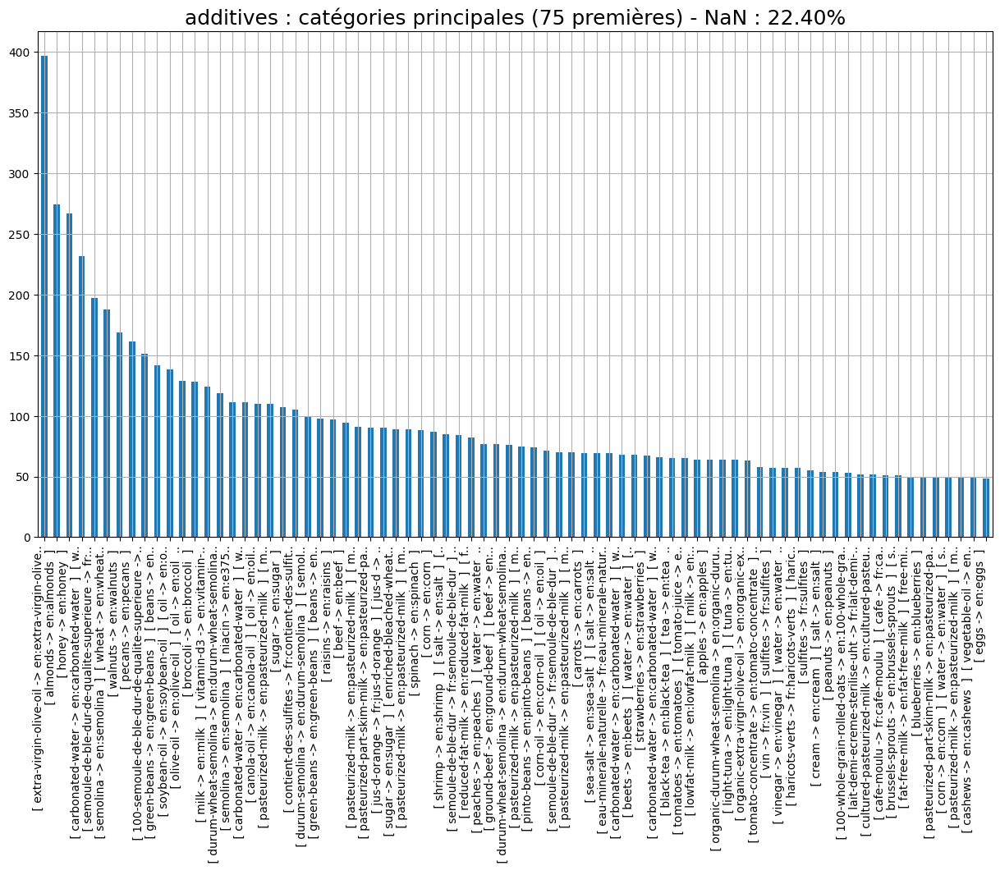

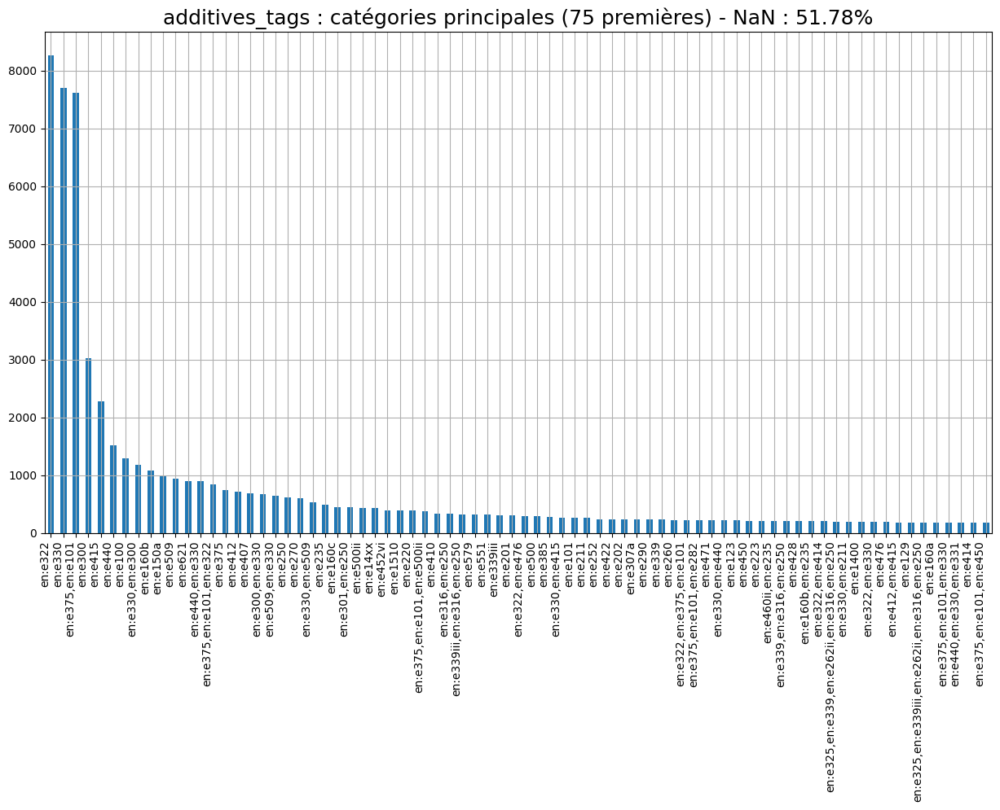

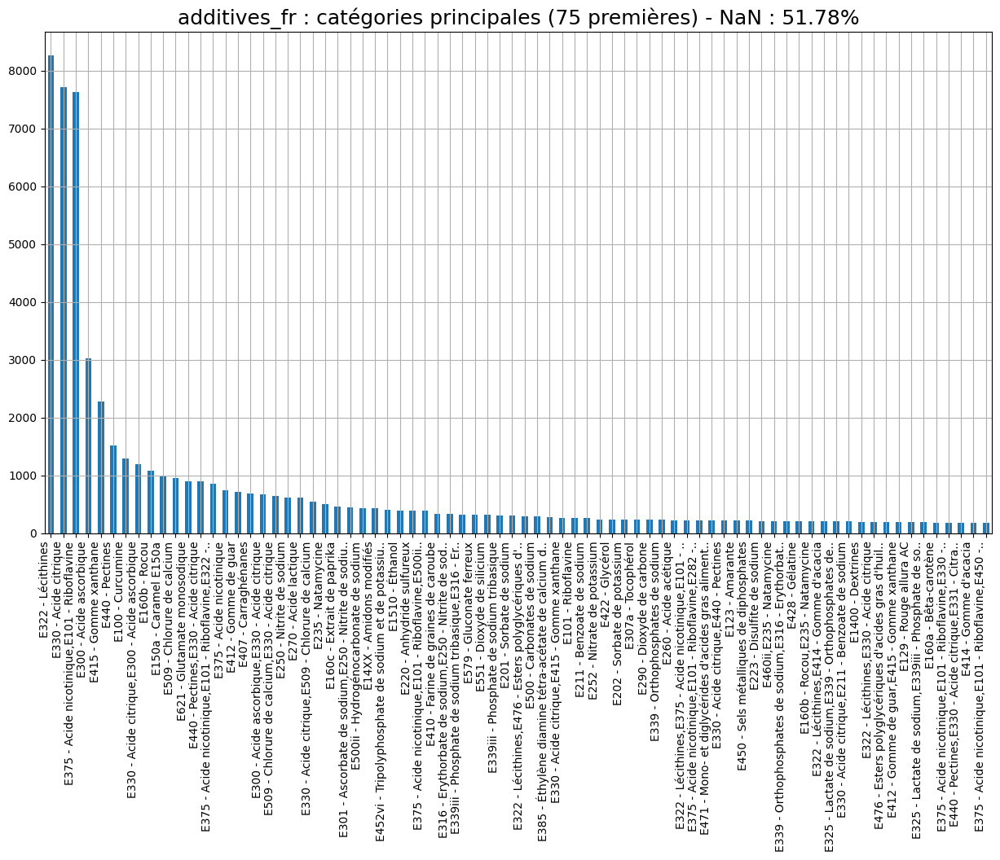

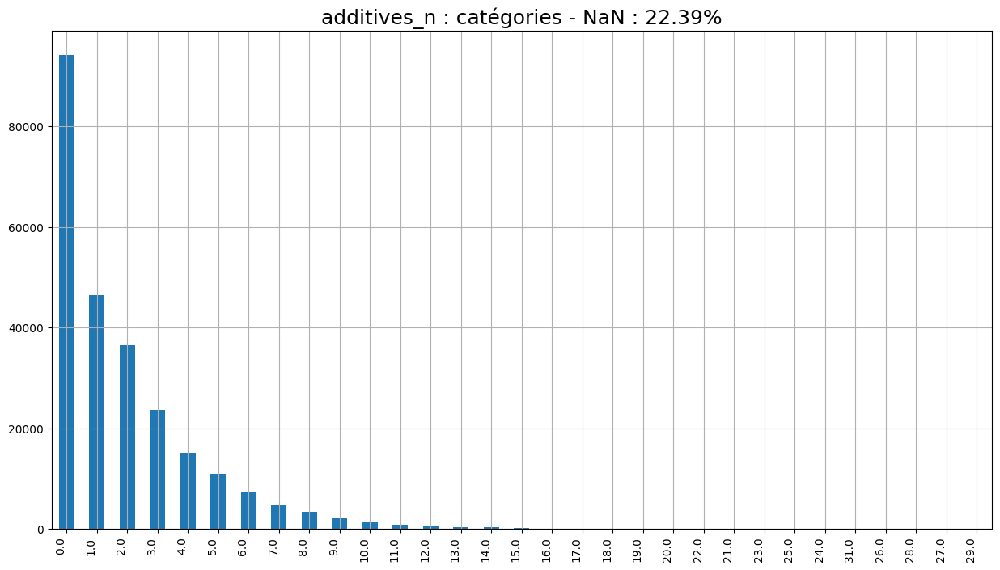

In [58]:
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

colonne = 'additives'
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=1., max_bar=75, kind='bar', rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)

colonne = 'additives_tags'
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=1., max_bar=75, kind='bar', rot=90)
if SAVE_FIGS: plt.savefigplt.savefig(colonne+'.jpg', dpi = 600)

colonne = 'additives_fr'
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=1., max_bar=75, kind='bar', rot=90)
if SAVE_FIGS: plt.savefigplt.savefig(colonne+'.jpg', dpi = 600)

colonne = 'additives_n'
df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=1., max_bar=75, kind='bar', rot=90)
if SAVE_FIGS: plt.savefigplt.savefig(colonne+'.jpg', dpi = 600)

In [59]:
df_init[['additives', 'additives_tags', 'additives_fr', 'additives_n']].head(10)

,additives,additives_tags,additives_fr,additives_n
0,NaN,NaN,NaN,NaN
1,[ bananas -> en:bananas ] [ vegetable-oil -...,NaN,NaN,0.0
2,[ peanuts -> en:peanuts ] [ wheat-flour -> ...,NaN,NaN,0.0
3,[ organic-hazelnuts -> en:organic-hazelnuts ...,NaN,NaN,0.0
4,[ organic-polenta -> en:organic-polenta ] [...,NaN,NaN,0.0
5,[ rolled-oats -> en:rolled-oats ] [ oats ->...,NaN,NaN,0.0
6,[ organic-long-grain-white-rice -> en:organic...,NaN,NaN,0.0
7,[ org-oats -> en:org-oats ] [ oats -> en:oa...,"en:e123,en:e307a","E123 - Amarante,E307a - Tocophérol",2.0
8,[ organic-chocolate-liquor -> en:organic-choc...,NaN,NaN,0.0
9,[ organic-expeller-pressed -> en:organic-expe...,NaN,NaN,0.0


On constate que des produits ont plusieurs valeurs dans la colonne `'additives'` (séparés par des `[ ]`), mais pas de valeurs dans `'additives_tags'` pour autant. Donc dans ce cas-là, les tags ne sont pas bien recalculés.

D'autre part, la valeur `'additives_n'` vaut 0 pour un grand nombre de cas où la colonne `'additives'` contient pourtant. Donc le `n` correspondra plus à la colonne `'additives_tags'`.

In [60]:
df_init.loc[df_init['additives_tags'].notna(),['additives', 'additives_tags', 'additives_fr', 'additives_n']].tail(10)

,additives,additives_tags,additives_fr,additives_n
320693,[ water -> en:water ] [ sugar -> en:sugar ...,en:e415,E415 - Gomme xanthane,1.0
320701,[ extrait-de-levure -> fr:extrait-de-levure ...,"en:e101,en:e375","E101 - Riboflavine,E375 - Acide nicotinique",2.0
320702,[ edulcorants -> fr:edulcorants ] [ sorbito...,"en:e420,en:e955,en:e950,en:e470b,en:e330","E420 - Sorbitol,E955 - Sucralose,E950 - Acésul...",5.0
320703,[ milk -> en:milk ] [ sugar -> en:sugar ] ...,"en:e442,en:e476","E442 - Phosphatides d'ammonium,E476 - Esters p...",2.0
320707,[ concentrated-grape-juice -> en:concentrated...,"en:e150a,en:e1401","E150a - Caramel E150a,E1401 - Amidon traité au...",2.0
320708,[ purified-water -> en:purified-water ] [ w...,"en:e500ii,en:e333,en:e508,en:e530","E500ii - Hydrogénocarbonate de sodium,E333 - C...",4.0
320730,[ organic-wheat-flour -> en:organic-wheat-flo...,"en:e422,en:e330,en:e296","E422 - Glycérol,E330 - Acide citrique,E296 - A...",3.0
320738,[ organic-oat-blend -> en:organic-oat-blend ...,en:e322,E322 - Lécithines,1.0
320750,[ water -> en:water ] [ high-fructose-corn-...,"en:e330,en:e440,en:e331,en:e150a,en:e201,en:e1...","E330 - Acide citrique,E440 - Pectines,E331 - C...",8.0
320771,[ citric-acid -> en:e330 -> exists -- ok ]...,"en:e330,en:e951,en:e150a,en:e950,en:e552,en:e1...","E330 - Acide citrique,E951 - Aspartame,E150a -...",7.0


In [61]:
df_init.loc[320693, 'additives']

' [ water -> en:water  ]  [ sugar -> en:sugar  ]  [ rice-wine-vinegar -> en:rice-wine-vinegar  ]  [ wine-vinegar -> en:wine-vinegar  ]  [ vinegar -> en:vinegar  ]  [ contains-sulphites -> en:contains-sulphites  ]  [ sulphites -> en:sulphites  ]  [ rapeseed-oil -> en:rapeseed-oil  ]  [ oil -> en:oil  ]  [ concentrated-lime-juice-5 -> en:concentrated-lime-juice-5  ]  [ lime-juice-5 -> en:lime-juice-5  ]  [ juice-5 -> en:juice-5  ]  [ 5 -> en:fd-c  ]  [ contains-sulphites -> en:contains-sulphites  ]  [ sulphites -> en:sulphites  ]  [ white-wine-vinegar -> en:white-wine-vinegar  ]  [ wine-vinegar -> en:wine-vinegar  ]  [ vinegar -> en:vinegar  ]  [ contains-sulphites -> en:contains-sulphites  ]  [ sulphites -> en:sulphites  ]  [ ginger-puree -> en:ginger-puree  ]  [ puree -> en:puree  ]  [ cornflour -> en:cornflour  ]  [ red-chilli-puree-2 -> en:red-chilli-puree-2  ]  [ chilli-puree-2 -> en:chilli-puree-2  ]  [ puree-2 -> en:puree-2  ]  [ 2 -> en:fd-c  ]  [ gariic-puree -> en:gariic-puree 

In [62]:
df_init.loc[320693,'additives_fr']

'E415 - Gomme xanthane'

In [63]:
df_init.loc[320693,'additives_n']

1.0

**Constats :**
- `[ contains-sulphites -> en:contains-sulphites  ]` est répété
- `[ water -> en:water  ]` n'est peut-être pas un additif
- `[ 2 -> en:fd-c  ]` est plutôt WTF
- `[ xanthan-gum -> en:e415  -> exists  -- ok  ]` est le seul additif à se retrouver dans `'additives_tags'` et `'additives_fr'`

On rejoue :

In [64]:
df_init.loc[320708,'additives']

' [ purified-water -> en:purified-water  ]  [ water -> en:water  ]  [ potassium-bicarbonate -> en:e500ii  -> exists  -- ok  ]  [ sodium-bicarbonate -> en:e500ii  ]  [ bicarbonate -> en:bicarbonate  ]  [ calcium-citrate -> en:e333  -> exists  -- ok  ]  [ sodium-chloride -> en:e508  -> exists  -- ok  ]  [ magnesium-oxide -> en:e530  -> exists  -- ok  ] '

In [65]:
df_init.loc[320708,'additives_fr']

'E500ii - Hydrogénocarbonate de sodium,E333 - Citrates de calcium,E508 - Chlorure de potassium,E530 - Oxyde de magnésium Périclase'

In [66]:
df_init.loc[320708,'additives_n']

4.0

A peu près cohérent.

On rejoue :

In [67]:
df_init.loc[320702,'additives']

' [ edulcorants -> fr:edulcorants  ]  [ sorbitols -> en:e420  -> exists  -- ok  ]  [ sucralose -> en:e955  -> exists  -- ok  ]  [ acesulfame-k-aromes -> fr:acesulfame-k-aromes  ]  [ acesulfame-k -> en:e950  -> exists  -- ok  ]  [ miel-citron -> fr:miel-citron  ]  [ miel -> fr:miel  ]  [ menthol-antiagglomerant -> fr:menthol-antiagglomerant  ]  [ menthol -> fr:menthol  ]  [ stearate-de-magnesium-acidifiant -> fr:stearate-de-magnesium-acidifiant  ]  [ stearate-de-magnesium -> en:e470b  -> exists  -- ok  ]  [ acide-citrique -> en:e330  -> exists  -- ok  ] '

In [68]:
df_init.loc[320702,'additives_tags']

'en:e420,en:e955,en:e950,en:e470b,en:e330'

In [69]:
df_init.loc[320702,'additives_fr']

'E420 - Sorbitol,E955 - Sucralose,E950 - Acésulfame K,E470b - Stéarate de magnésium,E330 - Acide citrique'

In [70]:
df_init.loc[320702,'additives_n']

5.0

**Constats :**
- `'additives'` : `[ sorbitols -> en:e420  -> exists  -- ok  ]`, `[ sucralose -> en:e955  -> exists  -- ok  ]`, `[ acesulfame-k -> en:e950  -> exists  -- ok  ]`, `[ stearate-de-magnesium -> en:e470b  -> exists  -- ok  ]`, `[ acide-citrique -> en:e330  -> exists  -- ok  ]` font bien 5 additifs, OK
- Des ingrédients supplémentaires mais non comptés comme additifs figurent dans la variable `'additives'`

Sur le site, si ça ne commence pas par `Exyz`, ce n'est pas un additif : https://fr.openfoodfacts.org/additifs. Donc le nombre `_n` colle avec le nombre de véritables additifs.

En regardant sur le web, il y a un `'label'` "sans additifs" ^^.
Par contre, on n'a pas le `'Eco-Score'` dans les data.

In [71]:
for col in df_init.columns:
    if 'eco' in col.lower():
        print('YOUPLA !!!')

On rejoue :

In [72]:
df_init.loc[320750,'additives']

' [ water -> en:water  ]  [ high-fructose-corn-syrup -> en:high-fructose-corn-syrup  ]  [ fructose-corn-syrup -> en:fructose-corn-syrup  ]  [ corn-syrup -> en:corn-syrup  ]  [ syrup -> en:syrup  ]  [ contains-2-or-less-of-the-following -> en:contains-2-or-less-of-the-following  ]  [ 2-or-less-of-the-following -> en:2-or-less-of-the-following  ]  [ or-less-of-the-following -> en:or-less-of-the-following  ]  [ less-of-the-following -> en:less-of-the-following  ]  [ of-the-following -> en:of-the-following  ]  [ the-following -> en:the-following  ]  [ following -> en:following  ]  [ maltodextrin -> en:maltodextrin  ]  [ citric-acid -> en:e330  -> exists  -- ok  ]  [ pectin -> en:e440  -> exists  -- ok  ]  [ natural-and-artificial-flavors -> en:natural-and-artificial-flavors  ]  [ and-artificial-flavors -> en:and-artificial-flavors  ]  [ artificial-flavors -> en:artificial-flavors  ]  [ flavors -> en:flavors  ]  [ sodium-citrate -> en:e331  -> exists  -- ok  ]  [ caramel-color -> en:e150a  

In [73]:
df_init.loc[320750,'additives_fr']

'E330 - Acide citrique,E440 - Pectines,E331 - Citrates de sodium,E150a - Caramel E150a,E201 - Sorbate de sodium,E102 - Tartrazine,E129 - Rouge allura AC,E110 - Jaune orangé S'

In [74]:
df_init.loc[320750,'additives_n']

8.0

- `[ contains-2-or-less-of-the-following -> en:contains-2-or-less-of-the-following  ]  [ 2-or-less-of-the-following -> en:2-or-less-of-the-following  ]  [ or-less-of-the-following -> en:or-less-of-the-following  ]  [ less-of-the-following -> en:less-of-the-following  ]  [ of-the-following -> en:of-the-following  ]  [ the-following -> en:the-following  ]  [ following -> en:following  ]` : qué paso ?!
- `[ preservatives -> en:preservatives  ]` : ...

**Conclusion :**
- On ne tiendra pas compte de la colonne `'additives'` <span class="girk">mais seulement des colonnes `'additives_fr'` et `'additives_n'`</span>.
<span class="mark">On pourra checker la cohérence entre `'additives_fr'` et `'additives_n'` (voire la version corrigée).</span>

### Ingrédients issus de l'huile de palme 

In [75]:
df_init.loc[df_init['ingredients_from_palm_oil_n']>0]

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
509,23092,http://world-fr.openfoodfacts.org/produit/0002...,kiliweb,1492087695,2017-04-13T12:48:15Z,1492087702,2017-04-13T12:48:22Z,Maple syrup & pecan cookie,NaN,NaN,...,NaN,0.0,NaN,NaN,NaN,NaN,18.0,18.0,NaN,NaN
1356,99332,http://world-fr.openfoodfacts.org/produit/0009...,beniben,1472742598,2016-09-01T15:09:58Z,1491142380,2017-04-02T14:13:00Z,Wrap Poulet à la Jamaïcaine,"Poulet mariné aux épices à la jamaïcalne, avec...",231 g,...,NaN,NaN,NaN,NaN,NaN,NaN,-3.0,-3.0,NaN,NaN
10372,12009012168,http://world-fr.openfoodfacts.org/produit/0012...,b7,1480703725,2016-12-02T18:35:25Z,1480706657,2016-12-02T19:24:17Z,Chef d'oeuf™avec fromage sur muffin anglais,"Sandwich déjeuner - Oeuf, saucisse, fromage",192 g,...,NaN,NaN,NaN,NaN,NaN,NaN,13.0,13.0,NaN,NaN
11272,14100096979,http://world-fr.openfoodfacts.org/produit/0014...,teolemon,1398696889,2014-04-28T14:54:49Z,1483517324,2017-01-04T08:08:44Z,Chocolate Chunk Crispy Cookies - Dark Chocolat...,Cookies croustillants aux morceaux de chocolat...,204 g,...,NaN,NaN,NaN,NaN,NaN,NaN,21.0,21.0,NaN,NaN
11273,14100096986,http://world-fr.openfoodfacts.org/produit/0014...,tacinte,1425744328,2015-03-07T16:05:28Z,1487255714,2017-02-16T14:35:14Z,Chocolate Chunk Dark Double Chocolate Crispy C...,NaN,220 g,...,NaN,NaN,NaN,NaN,NaN,NaN,21.0,21.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320530,9555022300023,http://world-fr.openfoodfacts.org/produit/9555...,miles67off,1390581100,2014-01-24T16:31:40Z,1487256330,2017-02-16T14:45:30Z,Nouilles orientales au curry - 85 g - Mamee,Nouilles orientales assaisonnées au curry,85 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320531,9555022300030,http://world-fr.openfoodfacts.org/produit/9555...,tacinte,1408252279,2014-08-17T05:11:19Z,1413193046,2014-10-13T09:37:26Z,Nouilles orientales arôme de champignons - 85 ...,Nouilles instantanées,85 g,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320601,9556041610322,http://world-fr.openfoodfacts.org/produit/9556...,sebleouf,1455977973,2016-02-20T14:19:33Z,1490723028,2017-03-28T17:43:48Z,Nouilles instantanées,NaN,350 g,...,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN
320648,9556417639339,http://world-fr.openfoodfacts.org/produit/9556...,openfoodfacts-contributors,1487961298,2017-02-24T18:34:58Z,1490998734,2017-03-31T22:18:54Z,Mantou Sandwich,Petits sandwiches orientaux,250 g (10 pièces),...,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN


On a des produits avec un nombre d'ingrédients issus d'huile de palme, mais ces ingrédients sont mal renseignés :

In [76]:
df_palmoil = df_init.loc[df_init['ingredients_from_palm_oil_n']>0][['product_name','brands','ingredients_from_palm_oil','ingredients_from_palm_oil_n']]
df_palmoil

,product_name,brands,ingredients_from_palm_oil,ingredients_from_palm_oil_n
509,Maple syrup & pecan cookie,Marks & Spencer,NaN,1.0
1356,Wrap Poulet à la Jamaïcaine,Marks & Spencer,NaN,1.0
10372,Chef d'oeuf™avec fromage sur muffin anglais,A&W,NaN,1.0
11272,Chocolate Chunk Crispy Cookies - Dark Chocolat...,Pepperidge Farm,NaN,1.0
11273,Chocolate Chunk Dark Double Chocolate Crispy C...,"Chocolate Chunk,Pepperidge Farm",NaN,1.0
...,...,...,...,...
320530,Nouilles orientales au curry - 85 g - Mamee,Mamee,NaN,1.0
320531,Nouilles orientales arôme de champignons - 85 ...,Mamee,NaN,1.0
320601,Nouilles instantanées,Ayam,NaN,1.0
320648,Mantou Sandwich,PA Food,NaN,1.0


In [77]:
df_palmoil['ingredients_from_palm_oil'].unique()

array([nan])

In [78]:
df_palmoil = df_init.loc[df_init['ingredients_from_palm_oil_n']>0][['product_name','brands','ingredients_from_palm_oil_tags','ingredients_from_palm_oil_n']]
df_palmoil

,product_name,brands,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n
509,Maple syrup & pecan cookie,Marks & Spencer,huile-de-palme,1.0
1356,Wrap Poulet à la Jamaïcaine,Marks & Spencer,huile-de-palme,1.0
10372,Chef d'oeuf™avec fromage sur muffin anglais,A&W,huile-de-palme,1.0
11272,Chocolate Chunk Crispy Cookies - Dark Chocolat...,Pepperidge Farm,huile-de-palme,1.0
11273,Chocolate Chunk Dark Double Chocolate Crispy C...,"Chocolate Chunk,Pepperidge Farm",huile-de-palme,1.0
...,...,...,...,...
320530,Nouilles orientales au curry - 85 g - Mamee,Mamee,huile-de-palme,1.0
320531,Nouilles orientales arôme de champignons - 85 ...,Mamee,huile-de-palme,1.0
320601,Nouilles instantanées,Ayam,huile-de-palme,1.0
320648,Mantou Sandwich,PA Food,huile-de-palme,1.0


In [79]:
df_palmoil['ingredients_from_palm_oil_tags'].unique()

array(['huile-de-palme', 'e304-palmitate-d-ascorbyle', 'oleine-de-palme',
       'huile-de-palme,e304-palmitate-d-ascorbyle',
       'huile-de-palme,mono-et-diglycerides-d-acides-gras-de-palme',
       'mono-et-diglycerides-d-acides-gras-de-palme',
       'e304-palmitate-d-ascorbyle,huile-de-palme',
       'huile-de-palme,stearine-de-palme',
       'huile-de-palme,oleine-de-palme',
       'mono-et-diglycerides-d-acides-gras-de-palme,huile-de-palme',
       'oleine-de-palme,huile-de-palme', 'stearine-de-palme',
       'stearine-de-palme,huile-de-palme',
       'oleine-de-palme,e304-palmitate-d-ascorbyle'], dtype=object)

C'est donc dans la variable `'ingredients_from_palm_oil_tags'` que l'on trouvera la bonne liste des ingrédients !

### Magasins

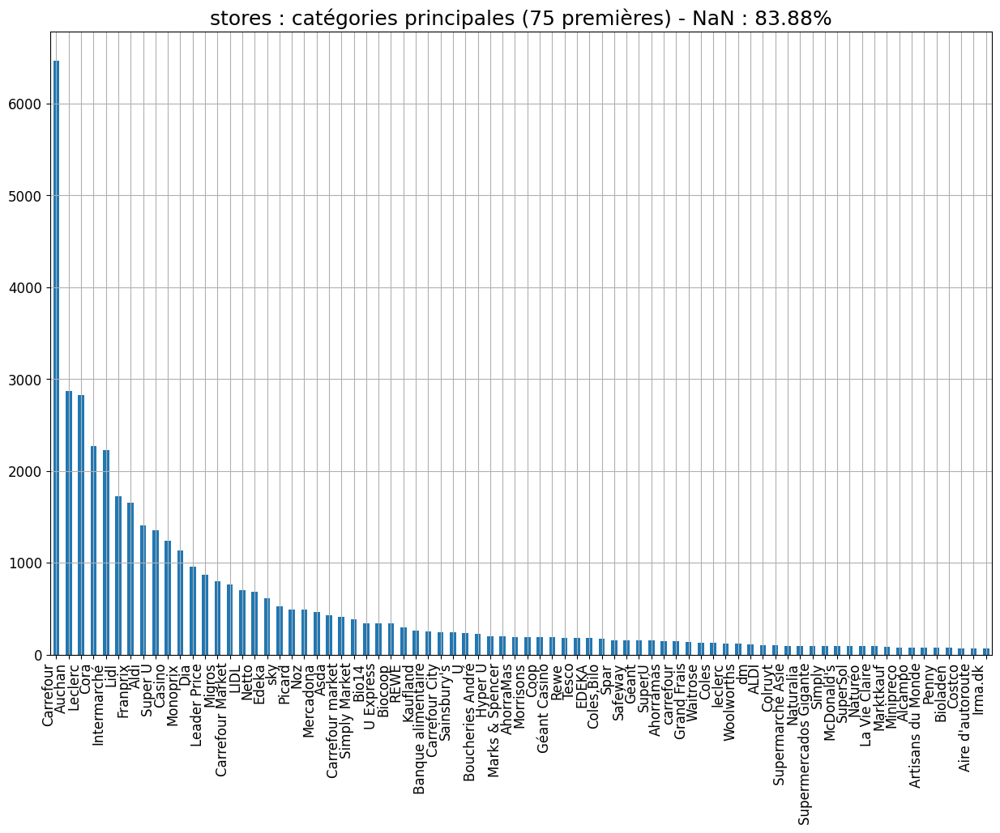

In [80]:
colonne = 'stores'
plt.rcParams['figure.figsize'] = [15, 10]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=1.,max_bar=75,kind='bar',rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)

Cette colonne semble à valeur unique (pas de virgule). Vérifions :

In [81]:
df_init.loc[(df_init['stores'].notna()) & (df_init['stores'].str.contains(','))]['stores']

543       Marks and Spencer,Marks and Spencer Food
1051                     Coles,Woolworths,Bilo,IGA
1345                   7eleven,C-Town Supermarkets
10837                          Aldi,US Food Stores
11272                             Auchan,Carrefour
                            ...                   
320531                           Monoprix,Franprix
320560                       Coles,Bilo,Woolworths
320589                                Monoprix,G20
320606                                  Coles,Bilo
320618    Bilo,Coles,Woolworths,Asian Supermarkets
Name: stores, Length: 3305, dtype: object

Et bien non, les `stores` peuvent être multiples.

In [82]:
nan_rate['stores']

83.8757746935518

### Labels

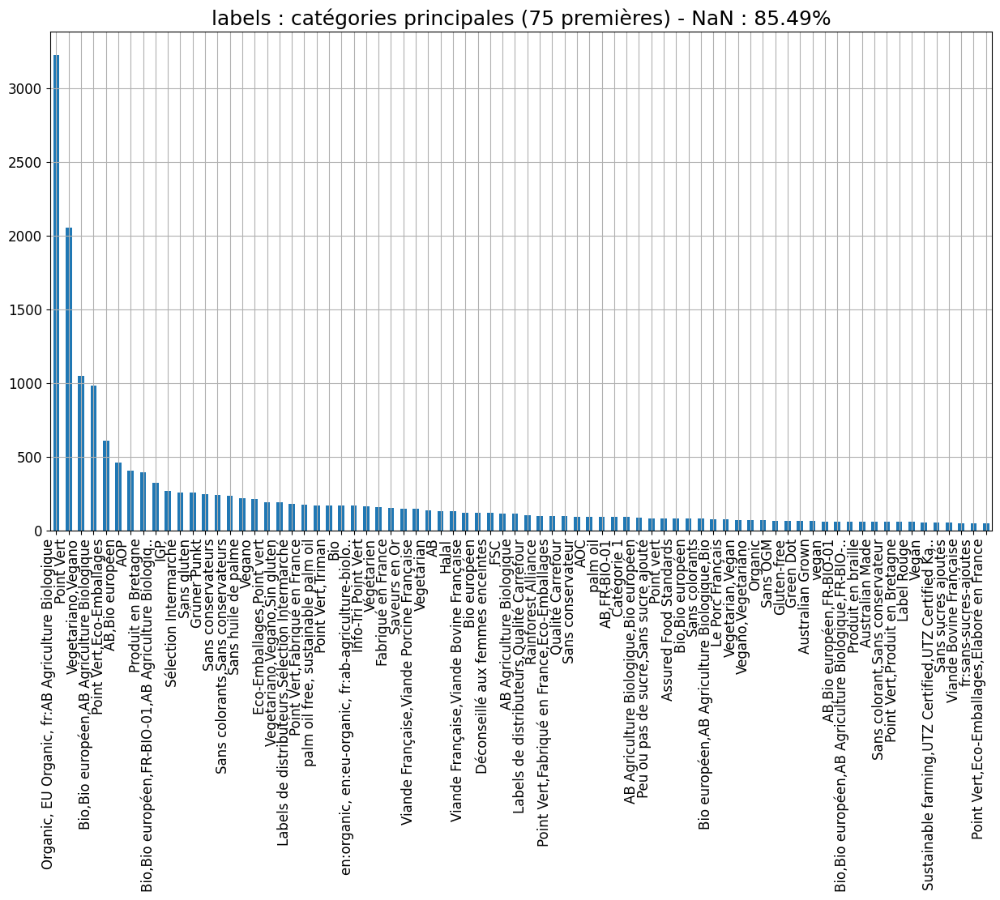

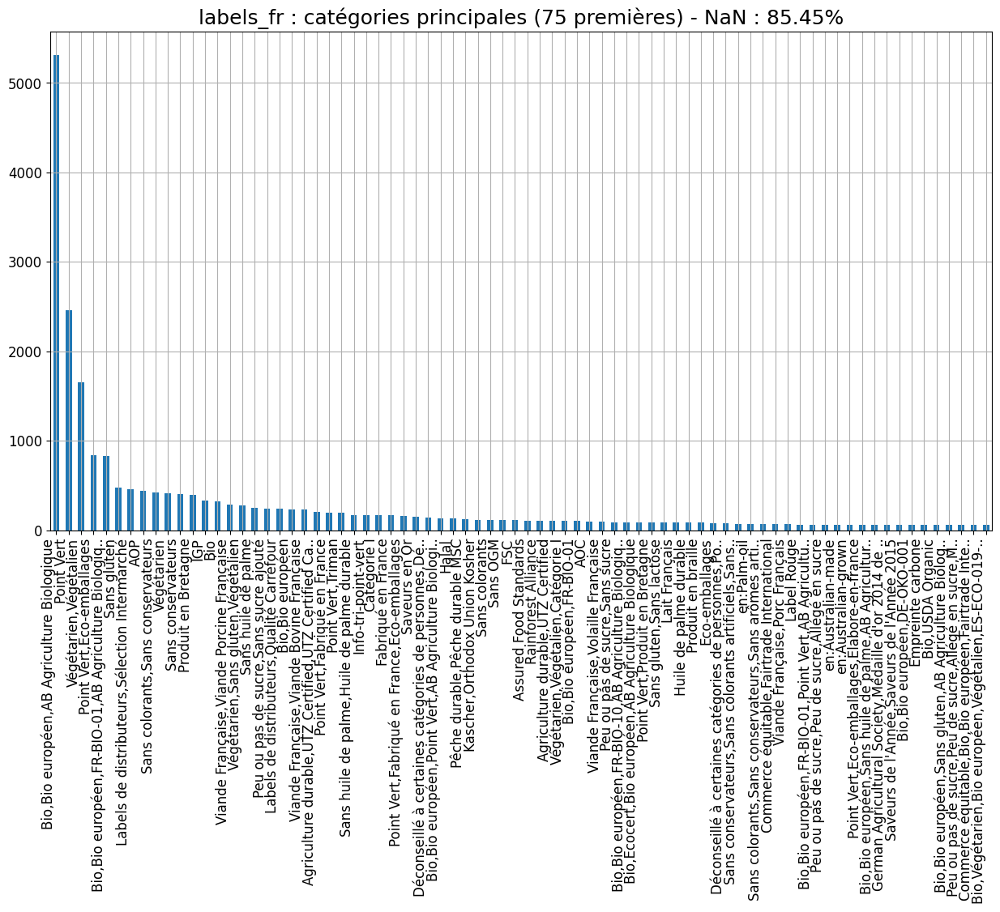

In [83]:
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12

colonne = 'labels'
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=1.,max_bar=75,kind='bar',rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)

colonne = 'labels_fr'
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=1.,max_bar=75,kind='bar',rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)


In [84]:
len(df_init['labels'].unique())

18115

In [85]:
len(df_init['labels_fr'].unique())

13656

In [86]:
df_init.loc[df_init['labels'].notna()][['product_name', 'brands', 'labels', 'labels_fr']].tail(15)

,product_name,brands,labels,labels_fr
320669,Allioli,Chovi,"Peu ou pas de sucre,Sans gluten,Sans sucre ajo...","Peu ou pas de sucre,Sans gluten,Sans sucre ajo..."
320681,Spearmint sans sucres,Fisherman's Friend,"Sans sucres,Ne pas donner aux enfants de moins...","Peu ou pas de sucre,Sans sucre,Ne-pas-donner-a..."
320683,tuna chunks in spring water,princes,"Dolphin friendly,Fished by pole & line,Recycla...","en:Dolphin-friendly,en:Fished-by-pole-line,en:..."
320692,Blue Cheese Dressing,Newman's Own,Suitable for vegetarians,Végétarien
320693,Santa Cruz Chilli & Lime Dressing,Newman's Own,Suitable for vegetarians,Végétarien
320702,Fisherman's Friend Miel-Citron,Fisherman's Friend,Sans sucre,"Peu ou pas de sucre,Sans sucre"
320704,Eat Natural yoghurt coated coconut and apricot,NaN,palm oil,Palm-oil
320709,Whole dried blueberrys,NaN,"palm oil free, sustainable palm oil","Sans huile de palme,Huile de palme durable"
320744,Ferrero Rocher,NaN,palm oil,en:Palm-oil
320749,Les Belles Tranches Bacon fumé,Justin Bridou,Fumé au bois de hêtre,Fumé au bois de hêtre


Ah, la présence d'huile de palme a été entrée dans la rubrique `'labels'`, plutôt destinée à des informations positives sur le produit (sans sucres ajoutés, agriculture biologique, etc.). On ne peut pas étudier et séparer les 13656 valeurs de labels en "bons" et "mauvais" labels. D'autre part, on gardera la colonne `'_fr'` par homogénéité avec les autres variables. 

Si l'on souhaite étudier le lien entre les labels et d'autres caractéristiques, le **nombre** de labels sera utile.
On créera donc la colonne `'labels_n'`, à partir de la colonne `'labels_fr'` lors de la phase de prétraitement des données.

### Pays où le produit est en vente

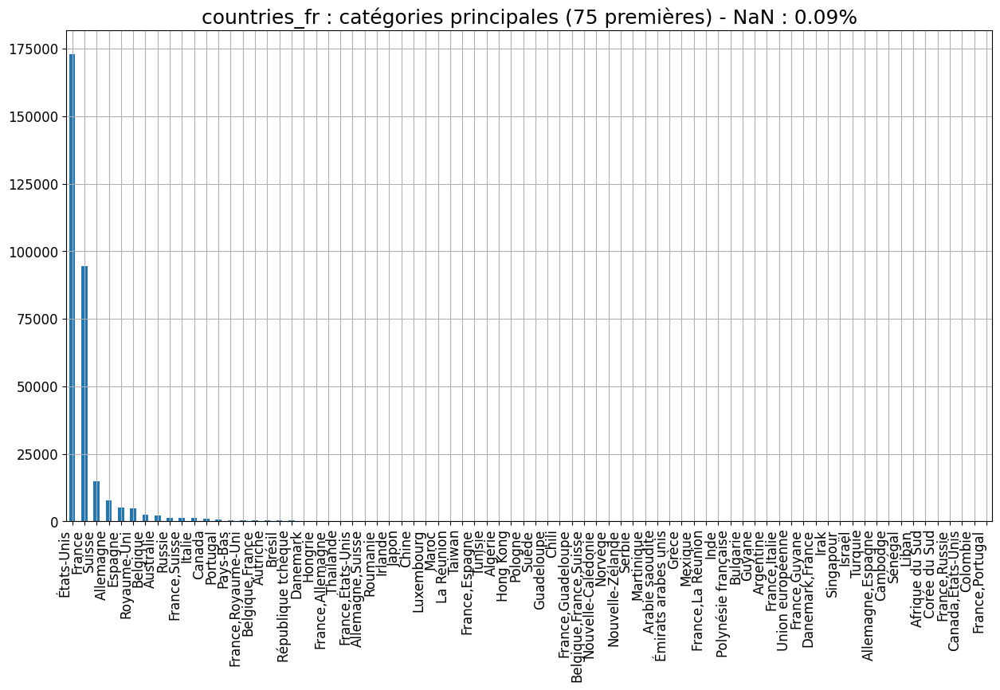

In [88]:
colonne = 'countries_fr'
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=1.,max_bar=75,kind='bar',rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)

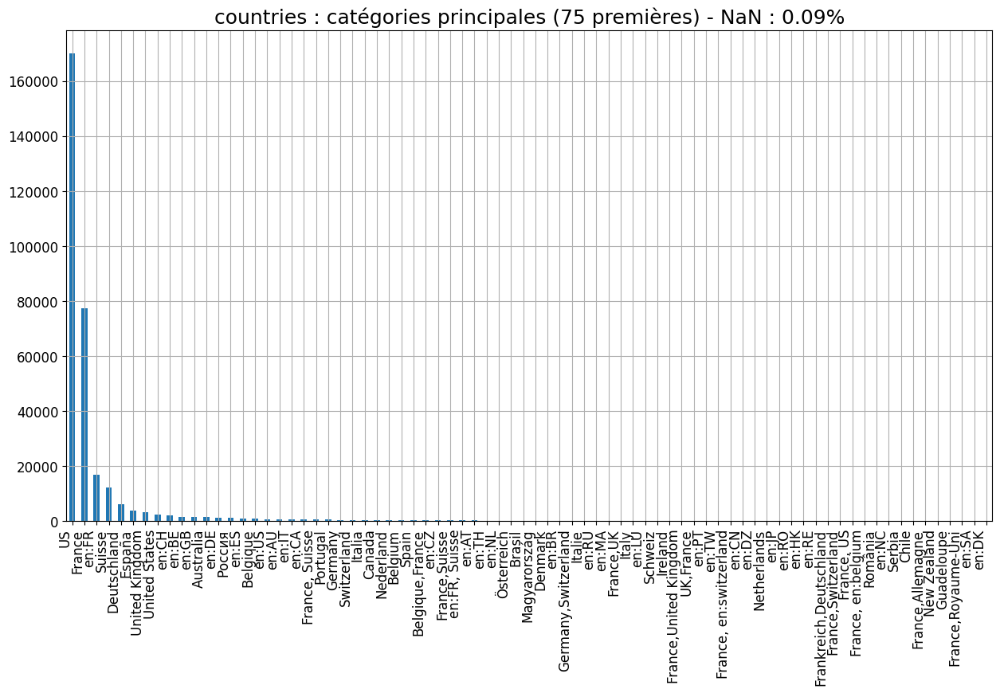

In [89]:
colonne = 'countries'
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=1.,max_bar=75,kind='bar',rot=90)
if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi = 600)

In [90]:
df_init.loc[(df_init['countries'].notna()) & (df_init['countries'].str.contains(','))]['countries']

106               France, US
138               France, US
452       France,Royaume-Uni
454                UK,France
456                UK,France
                 ...        
320606      Australie,France
320630     France,États-Unis
320633      en:HK, en:france
320637       Hong Kong,China
320734             France,UK
Name: countries, Length: 5097, dtype: object

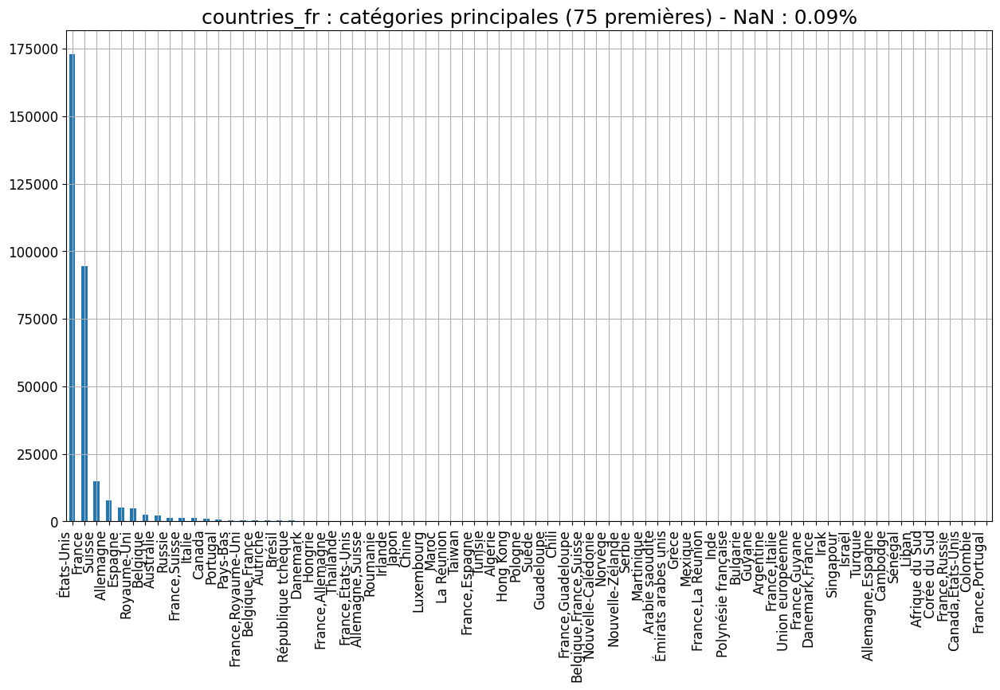

In [91]:
colonne = 'countries_fr'
plt.rcParams['figure.figsize'] = [15, 8]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
df2 = DisplotData.plot_categ_bars(df_init,colonne,seuil=1.,max_bar=75,kind='bar',rot=90)
plt.savefig(colonne+'.jpg', dpi = 600)

La colonne `countries` est moins proprement documentée que la colonne `countries_fr` : mélange de noms en anglais, de codes pays `(US, France, en:FR, Suisse, España, ... United States)`

<span class="girk">On utilisera cette colonne sans devoir la corriger.</span>

### Tout plein de colonnes d'un coup

In [92]:
ignored_cols = ['code','url','creator',
                'created_t',
                'created_datetime',
                'last_modified_t',
                'last_modified_datetime',
#                 'brands',
#                 'categories_fr',
#                 'stores','countries_fr','pnns_groups_1'
               ]
col_list = [col for col in df_init.columns if ((not col.endswith('_100g')) and 
                                               (not col.endswith('_url')) and 
                                               (col not in ignored_cols))]

In [93]:
plt.rcParams['figure.max_open_warning'] = 100

<Figure size 1800x12000 with 0 Axes>

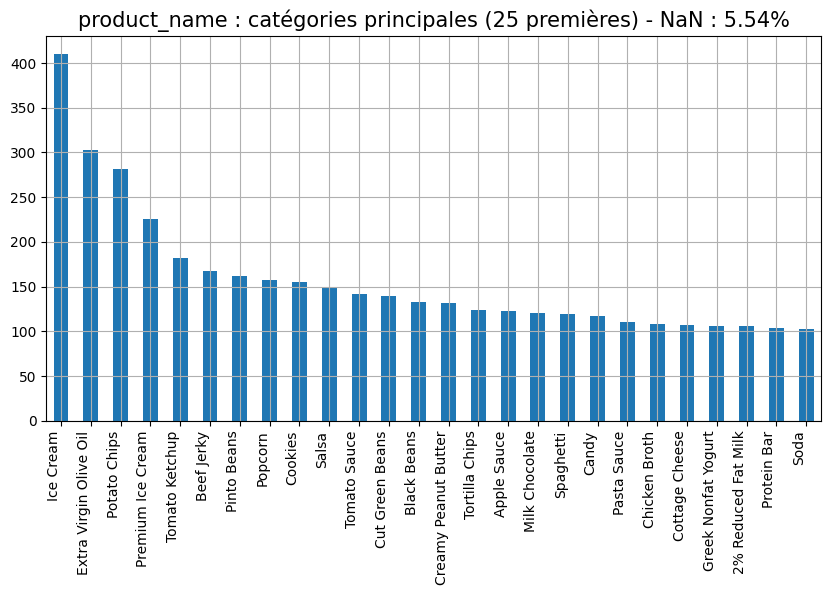

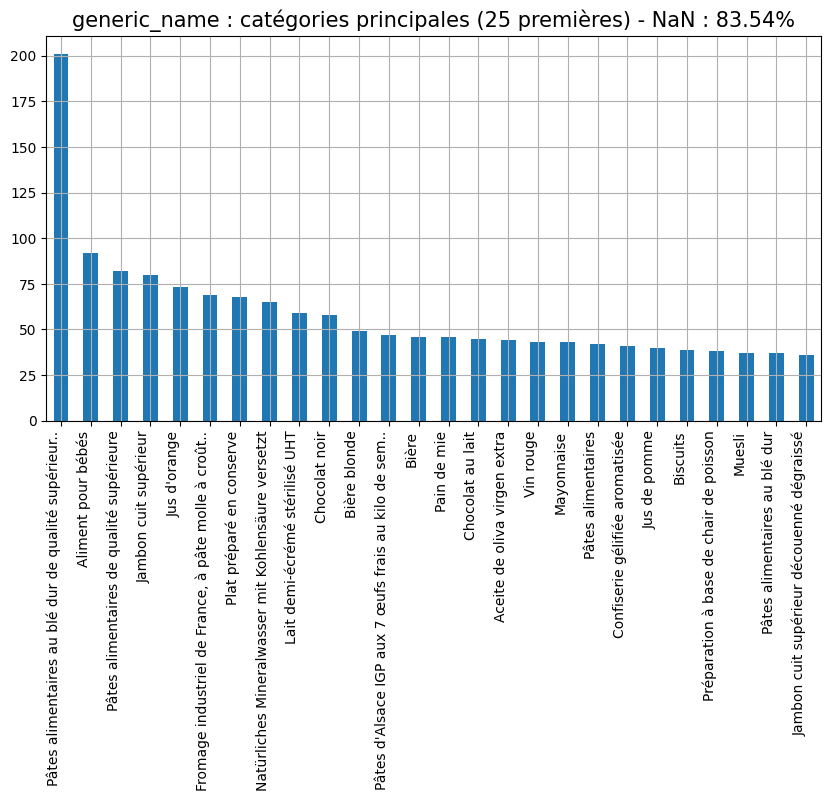

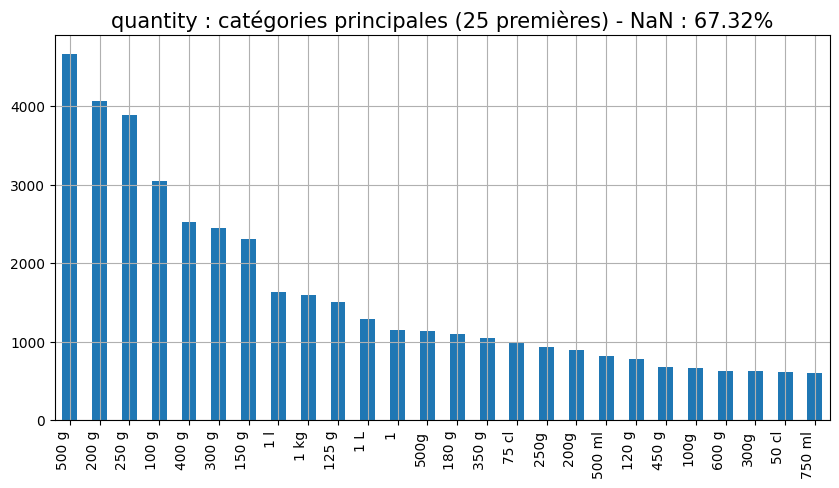

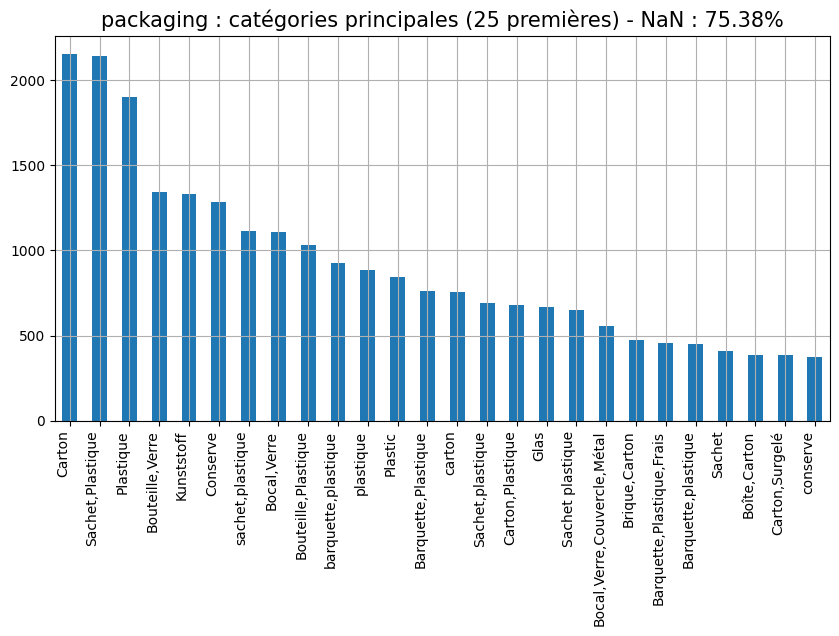

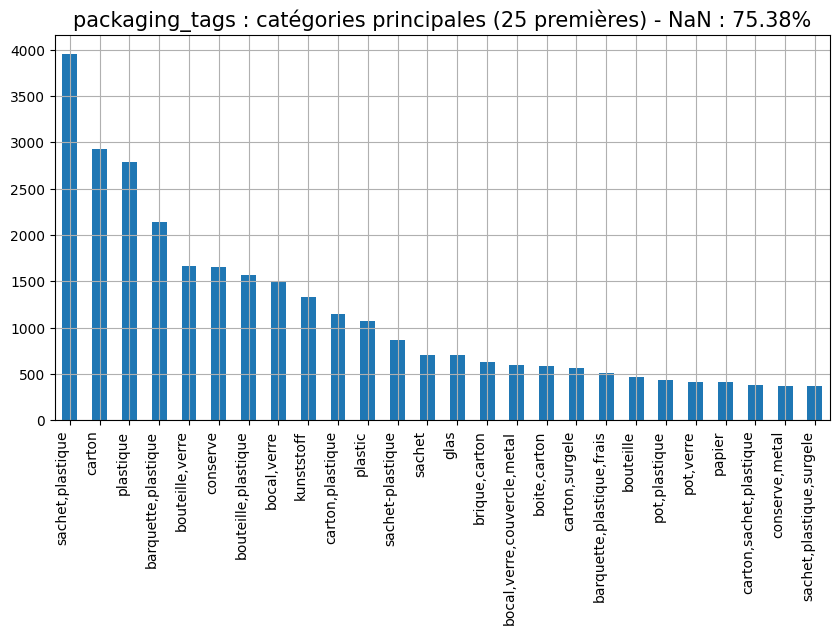

...

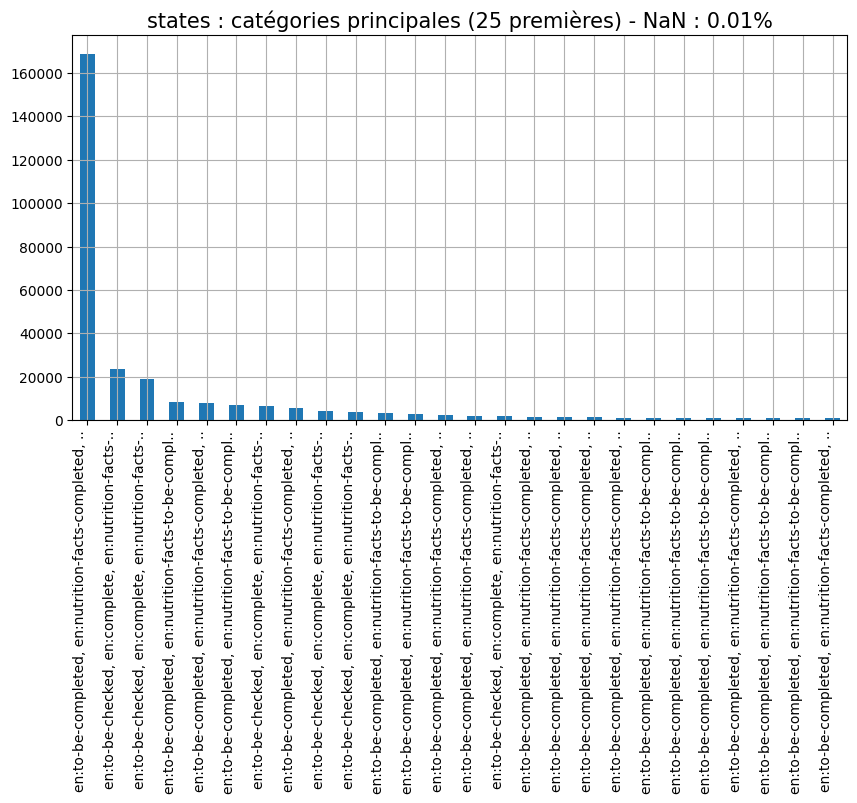

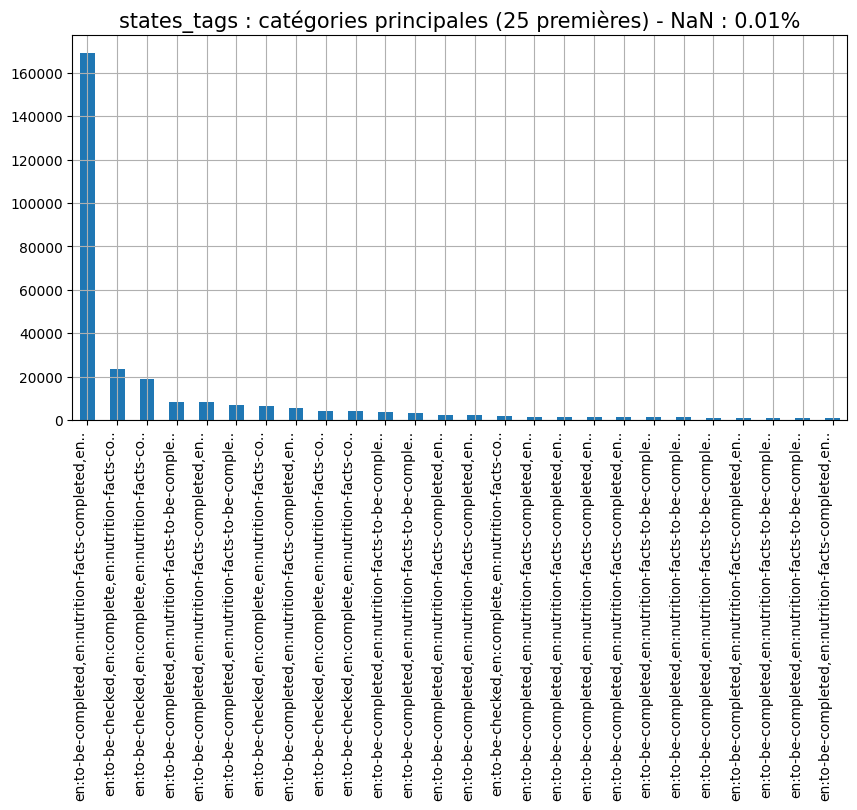

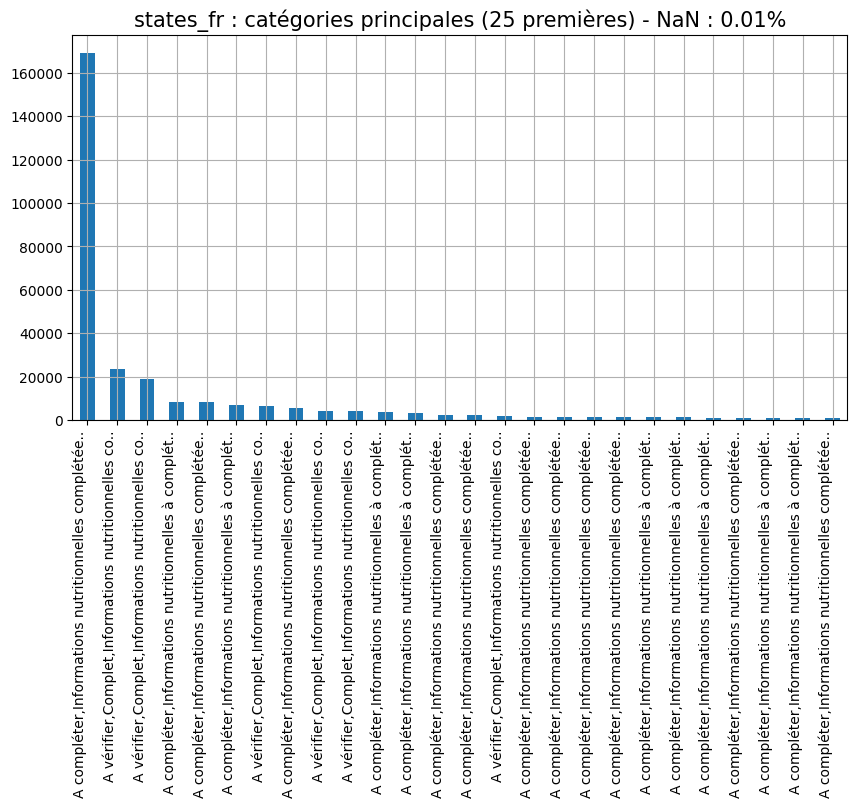

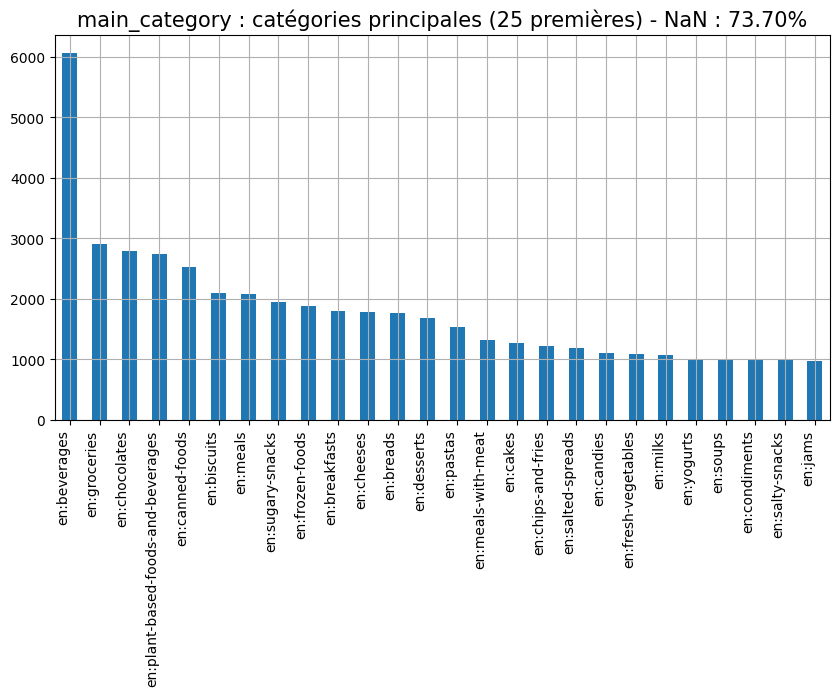

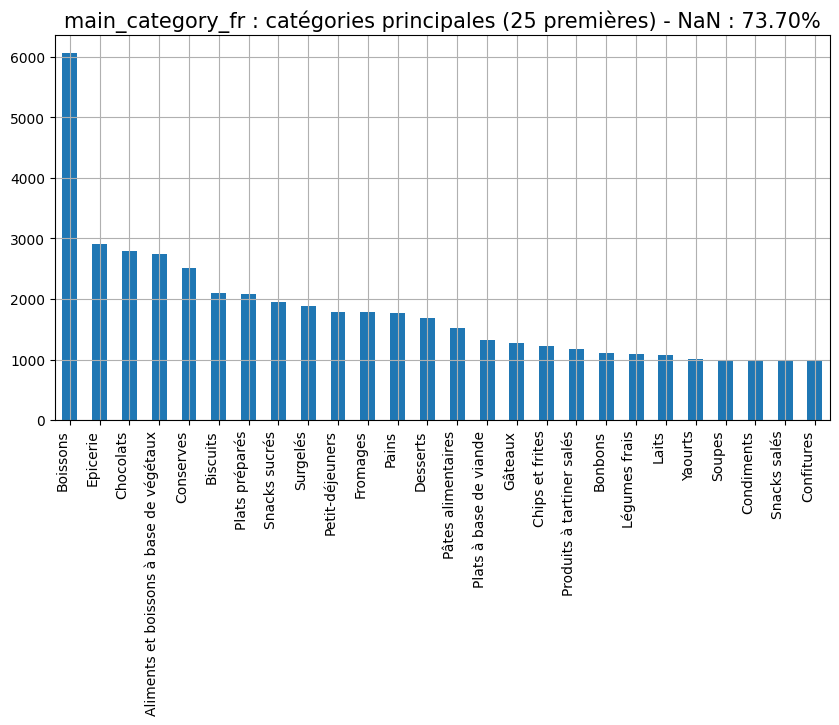

In [97]:
plt.rcParams['figure.figsize'] = [10, 5]
plt.rcParams['axes.titlesize'] = 15
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
n = len(col_list)
ind = 0
plt.figure(figsize=(18, 120))
for colonne in col_list:
    if nan_rate[colonne] > 95.:
        continue
    ind += 1
    df2 = DisplotData.plot_categ_bars(df_init, colonne, seuil=1., max_bar=25, kind='bar', rot=90)
    if SAVE_FIGS: plt.savefig(colonne+'.jpg', dpi=600)

- `'allergens'`: `'Lait'`, `'LAIT'`, `'lait'` : <span class="mark">modifier la casse et fusionner</span>
- `'serving_size'` : parfois précision des oz, des floz, du nombre de cup, de Tbsp, d'ONZ etc.
⇨ on ne corrigera rien de tout ça, pour notre Use Case
- Les `'additives'` sont séparés par des [ ] et non des "," (à prendre en compte si on éclate les valeurs)
- La valeur `'unknown'` pour les colonnes `'pnns_groups_1'` et `'pnns_groups_2'` vaut le coup de regarder si on ne peut pas <span class="mark">la rétablir par un algo de ML</span>, d'autant qu'elle est majoritaire
- `'energy_100g'` : <span class="mark">0.0 est étonnant, sauf pour certaines catégories (eau, et autre à identifier). Un NaN serait plus approprié. Cette valeur est recalculable avec les valeurs pour 100g de protéines/glucides/lipides.</span>
- `'fat_100g'` (et les autres) à 0.0 : moins évident à corriger.
- Les colonnes `_fr` sont <span class="girk">plus homogènes et simples à utiliser</span>.

In [98]:
# Multivalues columns (with ',')
for colonne in col_list:
    if nan_rate[colonne] > 95.:
        continue
    if colonne.endswith('_n') or colonne.endswith('_100g'):
        continue
    print(colonne)
    print(df_init.loc[(df_init[colonne].notna()) & (df_init[colonne].str.contains(','))][colonne])
    print('\n\n')

product_name
34             Organic Unsweetened Granola, Cinnamon Almond
36                     Sweeteners, Demerara Turbinado Sugar
72                     Sweeteners, Organic Fair Trade Sugar
80                                      Peanuts, Mixed Nuts
85                                   Foods, Spanish Peanuts
                                ...                        
320694                                    Umami Pepper, Hot
320730                    Sour Licorice Twists, Sour Cherry
320764                           Cheese cake thé vert, yuzu
320768    Mint Melange Tea A Blend Of Peppermint, Lemon ...
320771                      Sugar Free Drink Mix, Peach Tea
Name: product_name, Length: 65587, dtype: object



generic_name
680       quatrtiers de pomme de terre aux épices, blanc...
894       Feijoada brésilienne au porc, haricots noirs, ...
1163      A crunchy hazelnut and almond filling, enrobed...
1356      Poulet mariné aux épices à la jamaïcalne, avec...
9601      chair de que

## Exploration des variables numériques

### Boxplots des protéines/glucides/lipides par `pnns_groups_1`

In [99]:
col_compos = [
    'proteins_100g',
    'sugars_100g',
    'carbohydrates_100g',
    'fat_100g',
    'saturated-fat_100g',
    # 'fiber_100g', 'cholesterol_100g', 'trans-fat_100g', 'calcium_100g', 'vitamin-c_100g', 'iron_100g', 'vitamin-a_100g'
]

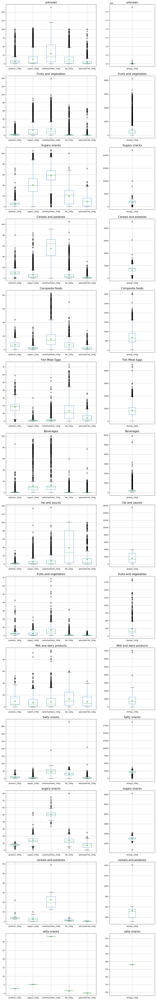

In [100]:
categs = df_init.loc[df_init['pnns_groups_1'].notna()]['pnns_groups_1'].unique()
n = len(categs)
fig = plt.figure(figsize=(15,100))
rows = n
cols = 2
grid = plt.GridSpec(rows, cols, wspace=0.2, hspace=0.15, width_ratios=[cols, 1])

for ind in range(n):
    categ = categs[ind]
    fig_ax1 = fig.add_subplot(grid[ind, 0])
    df = df_init.loc[df_init['pnns_groups_1']==categ][col_compos].copy()
    bx1 = df.boxplot(showmeans=True,return_type='dict')
    plt.title(f'{categ}')  

    fig_ax2 = fig.add_subplot(grid[ind, 1])
    df = df_init.loc[df_init['pnns_groups_1']==categ][['energy_100g']].copy()
    bx2 = df.boxplot(showmeans=True,return_type='dict')
    plt.title(f'{categ}')

Dans toutes les catégories `'pnns_groups_1'`, on observe des outliers pour quasiment toutes les distributions de nutriment, qu'il est préférable de comprendre.

### Etude des outliers dans `'pnns_groups_1'`

Regardons les outliers en protéines dans la catégorie `'Cereals and potatoes'` : 

In [101]:
group = 'Cereals and potatoes'
nutr = 'proteins_100g'
seuil = 20.
outliers = df_init.loc[(df_init['pnns_groups_1']==group) & (df_init[nutr]>seuil)][['product_name','proteins_100g','carbohydrates_100g','fat_100g']]
outliers.shape

(356, 4)

In [102]:
outliers.head(50)

,product_name,proteins_100g,carbohydrates_100g,fat_100g
28880,Natural peanut butter and flaxseed,21.90,25.00,50.00
29113,Beurre De Cacahuètes Crémeux,25.00,21.00,50.00
34614,Natural creamy peanut butter,21.88,18.75,50.00
34626,Beurre de cacahuètes crémeux,25.30,18.80,51.60
34631,Skippy Creamy Peanut Butter,21.90,18.80,50.00
34639,Creamy Peanut Butter,21.90,18.80,50.00
34644,Creamy Peanut Butter,21.90,18.80,50.00
35180,Tofurella,21.40,0.00,14.30
35205,Froot Loops,34.50,86.20,3.45
35216,Special K Protein,31.20,59.40,3.12


Ces 50 outliers sont principalement des aliments à base de fruits secs (beurre de cacahuète, graines de sésames, lentilles, ...), très riches en protéines.

In [103]:
outliers.tail(50)

,product_name,proteins_100g,carbohydrates_100g,fat_100g
308557,Harina de garbanzo,21.33,55.70,6.50
308796,Seitán en rodajas,24.00,1.80,1.40
308812,Lino dorado ecológico &quot;Ecocesta Productos...,22.90,5.90,29.90
308814,Harina de garbanzo,21.70,44.50,6.00
308819,Soja texturizada fina ecológica &quot;Ecocesta...,43.00,30.00,8.00
308820,Soja texturizada gruesa ecológica &quot;Ecoces...,43.00,0.00,8.00
308821,Semillas de chía,32.20,4.50,31.10
308822,Soja texturizada gruesa &quot;El Granero Integ...,52.00,31.00,1.20
308823,Milanesas de soja texturizada &quot;El Granero...,56.00,28.00,0.90
308826,Lentejas rojas peladas,20.40,20.40,1.50


Soja, seitan, cacahuète, ... Des articles qui auraient dû être rangés dans les catégories `'Composite foods'`, `'Fruits and vegetables'`, etc.

Dans cette dernière catégorie, regardons quelques outliers, en terme de matières grasses :

In [104]:
group = 'Fruits and vegetables'
nutr = 'fat_100g'
seuil = 30.
outliers = df_init.loc[(df_init['pnns_groups_1']==group) & (df_init[nutr]>seuil)][['product_name','proteins_100g','carbohydrates_100g','fat_100g']]
outliers.head(50)

,product_name,proteins_100g,carbohydrates_100g,fat_100g
11299,Almonds,21.2,21.7,49.4
11330,Pistachios,21.4,27.7,46.0
13931,desiccated coconut,5.6,6.1,62.0
174968,Rostad Lök,6.0,38.0,43.0
179541,Aceitunas de color cambiante enteras &quot;Bar...,1.4,0.0,31.0
180238,Mélange de Fruits Secs,19.0,15.0,56.0
191993,Mon Tour Malin,23.6,5.6,52.9
195830,Noix de Coco des Tropiques râpée,15.5,11.8,67.6
195831,Noix de coco râpée,15.5,11.8,67.6
198154,Noix de coco râpée,6.9,7.4,64.5


Oui alors si on met les `'Mélange salé'` (index 205425) les `'banan med smör'` ("banane au beurre", index 102172) dans les fruits et légumes, aussi... ! 😅 Beaucoup de noix de coco, bien catégorisées pour le coup, donc normales quant à la quantité de matières grasses.

Quelles sont les boissons avec plus de 10g (dix grammes) de matière grasse ?

In [105]:
group = 'Beverages'
nutr = 'fat_100g'
seuil = 10.
outliers = df_init.loc[(df_init['pnns_groups_1']==group) & (df_init[nutr]>seuil)][['product_name','proteins_100g','carbohydrates_100g','fat_100g']]
outliers.head(50)

,product_name,proteins_100g,carbohydrates_100g,fat_100g
13118,Lait de coco,1.60,2.00,19.0
45274,Leche de coco,3.50,3.50,16.0
57324,Coconut milk,2.10,5.60,17.0
57349,Coconut Milk Powder,12.00,32.00,60.0
66227,Coconut Milk,0.60,2.30,19.2
85172,Lait de Coco,2.10,3.70,21.0
101547,Coconut Milk Rich Formula,1.67,3.33,18.3
102192,Lait de coco,1.60,2.00,19.0
122553,Elephant Vanilla Chai,2.86,75.00,12.1
176458,Sagylait,31.00,45.00,14.0


Ce sont les laits de coco, donc OK.

**Conclusion :** des valeurs `'pnns_groups_1'` parfois mal choisies, mais parfois tout à fait licites. Il est donc délicat de les remplacer par des `NaN` pour tenter d'imputer à des meilleures valeurs.

Par contre, des produits ont plus de 100g de `sugars`, de `carbohydrates`, etc. pour les `unknown`, les `Fruits` and `vegetables`, `Sugary snacks`, `Fat and Sauces`, `Salty snacks`, etc. :

In [106]:
nutr = 'carbohydrates_100g'
seuil = 100.
outliers = df_init.loc[df_init['carbohydrates_100g']>seuil][['product_name','proteins_100g','carbohydrates_100g','fat_100g']]
outliers.head(50)

,product_name,proteins_100g,carbohydrates_100g,fat_100g
71000,"Toaster Pastries, Strawberry",6.250,209.38,NaN
73668,Icing Decorations,0.000,120.00,0.000
111566,Tomato Ketchup,7.060,136.00,0.588
119783,Naturally Caffeinated Pure Empower Mint Dietar...,NaN,120.00,NaN
133567,Mango Jalapeno,NaN,125.00,0.000
155609,Beurre d'érable,0.000,164.00,0.000
155803,"Tamarind Juice With Nata De Coco, Tamarind",NaN,2916.67,0.000
202571,Sirop d'Agave brun bio,0.000,104.00,0.000
234726,Palets pur beurre,10.000,106.00,52.000
239347,Sirop d'agave,NaN,105.00,NaN


**On remplacera ces valeurs aberrantes par `NaN`**, en vue d'une imputation plus intelligente, plus tard.

## Possibles Use Cases et réflexions

Parce que les données associées sont plutôt bien renseignées, on s'aventure sur une appli qui propose des produits :
- avec moins ou pas d'additifs (78% bien renseignés)
- avec moins ou pas d'huile de palme et ses dérivés (78% bien renseignés)
- avec un label quelconque (même si très peu renseigné, 15%, mais certainement à raison).

<div class="alert alert-block alert-warning">
<b>Usability : </b>Le risque est porté par la proposition de label : si dans 85% des cas il n'y a pas de label, l'utilisateur aura souvent un produit qu'il <b>veut</b> remplacer, mais on risque d'avoir peu souvent un produit avec qu'il <b>peut</b> remplacer.
</div>

⇨ à chiffrer

Une grosse question est la manière de caractériser un produit et **ceux qui lui ressemblent** !
Quelle variable utiliser ? En faut-il plusieurs ? Le KNN ne serait-il pas une bonne idée ? Ou le clustering en général ? 

**Autres idées**
- Scan du produit, produit avec la même composition mais **empreinte carbone** moindre
=> vérifier le taux de remplissage de cet indicateur (peu d'espoir)
- Scan du produit, sélection de **critère(s) à améliorer** (NutriScore meilleur / moins de sucre / moins de sel / ...) et proposition de produits ayant le maximum d'attributs commun
- Option de l'application : **dans la même enseigne / pas dans la même enseigne** (oublier ; il sera rare d'avoir une "enseigne-marque"

Cela amène à nouveau à la **complétude des variables**, pour que la liste de produits de substitution soit **maximale**.

## Premier Use Case (MVP) retenu 

⇨ Mode **Agile** suggéré : une première version simple, avec peu de variables et d'options, que l'on enrichira par la suite.

<div class="alert alert-block alert-info">
<b>Première version de l'application :</b>
    
 - à partir d'un produit choisi (tiré au hasard, pour la démo)
 - proposition de tous les produits de la même catégorie, classés par ordre croissant d'additifs
 - en second lieu : idem avec le nombre d'ingrédients issus de l'huile de palme `'ingredients_from_palm_oil_n'`
</div>

Pour les colonnes du genre `'categories'`, `'categories_fr'`, si on a des valeurs séparées par des virgules, on crée des colonnes qui sont autant de dimensions ? Exemple : `'a,b,c'` ⇨ 0 ou 1 sur la dim `'a'`, `'b'` et `'c'` ?

## Caractérisation d'un produit que c'est le même mais en différent 

On a vu que les variables `'pnns_groups_1'` et `'pnns_groups_2'` étaient trop larges pour être utilisées seules, et que les variables `'categories'`, `'categories_fr'` étaient elles trop riches.

👉 Ne faudra-t-il pas identifer les produits de substitution par **plusieurs variables**, ayant le maximum de matching ? 
👉 Et comment être sûr de ne choisir **ni trop ni trop peu** de variables pour classifier un produit ? Une ACP ? 

# Nettoyage des données

## Définitions des variables, dont le Nutri-Score

### Recherche sur son mode de calcul

Nous avons vu que le Nutri-Score n'était pas toujours documenté (69% seulement). Est-il **recalculable**, à partir d'informations données ? Peut-on le **prédire** si toutes les informations officielles ne sont pas présentes ?

Le calcul du score nutritionnel est basé sur les données de la déclaration nutritionnelle, pour 100g de 
produit, tel que vendu.

Quantification du contenu en **fruits, légumes, légumineuses, fruits à coque huiles de colza, de noix et d’olive.**


Le calcul du score global d’un aliment se fait en retranchant la somme des points favorables à la somme 
des points défavorables. 
De plus, en fonction du niveau des points défavorables (au seuil de 11), les points favorables peuvent varier 
selon la prise en compte ou non des points correspondant aux protéines (voir règles spécifiques).

**Non concerné par le NS :**

Tous les aliments qui n'ont pas d'obligation de déclaration nutritionnelle, càd :
1. Les produits non transformés qui comprennent un seul ingrédient ou une seule catégorie d’ingrédients
(par exemple fruits ou légumes frais, viandes crues découpées, miel…)
2. Les produits transformés ayant, pour toute transformation, été soumis à une maturation, et qui 
comprennent un seul ingrédient ou une seule catégorie d’ingrédients
NB : le produit visé est essentiellement la viande 
3. Les eaux destinées à la consommation humaine, y compris celles dont les seuls ingrédients ajoutés 
sont du dioxyde de carbone et/ou des arômes
4. Les plantes aromatiques, les épices ou leurs mélanges
5. Le sel et les succédanés de sel
6. Les édulcorants de table
7. Café, chircorée, etc.
8. Infusions, thé, etc.
9. Vinaigre
10. Arômes
11. Les additifs alimentaires
12. Les auxiliaires technologiques
13. Les enzymes alimentaires
14. La gélatine
15. Les substances de gélification
16. Les levures
17. Les gommes à mâcher
18. Les denrées alimentaires conditionnées dans des emballages ou récipients dont la face la plus grande 
a une surface inférieure à 25 cm2 (???)
19. Les denrées alimentaires, y compris de fabrication artisanale, fournies directement par le fabricant 
en faibles quantités au consommateur final ou à des établissements de détail locaux fournissant 
directement le consommateur.
20. Les compléments alimentaires

**Autre :**

- Les sucres simples comprennent les mono et les disaccharides.
- La teneur en sodium correspond à la teneur en sel mentionnée sur la déclaration obligatoire divisée par un coefficient de conversion de 2,5
- Le calcul du Nutri-Score d'un produit préparé peut être utilisé si et  seulement si la méthode de préparation est décrite précisément (ex : soupe déshydratée)
- Produits à frire obligatoirement : mention à faire sur l'emballage, de 1 voire 2 lettres du NS final (si acide gras non-saturé ou saturé respectivement).
- Prise en compte du liquide de couverture dans le calcul du NS : à expliciter aussi sur l'emballage.
- Aliments infantiles destinés aux enfants de 0 à 3 ans : pas recommandé d’appliquer le Nutri-Score sur ces produits. En effet, les besoins nutritionnels des enfants sont spécifiques (ddéclaration nutritionnelle obligatoire)
- Pas d’utilisation du Nutri-Score sur des produits de nutrition sportive. L’algorithme sous-jacent du Nutri-Score a été développé pour répondre aux besoins de la population générale, alors que la nutrition sportive a pour objectif de répondre à des besoins particuliers d’un sous-groupe de la population.
- Idem pour les aliments à visée médicale, les substituts de repas

**Score nutritionnel != Nutri-Score**
-15 à +40 / A à E

**Points négatifs** (correspondant aux composantes 
‘défavorables’ dont un apport en excès est considéré comme délétère pour l’état de santé : énergie, sucres, 
sodium et acides gras saturés) 

**Points positifs** (correspondant aux composantes ‘favorables’ : fruits, 
légumes, légumineuses, fruits à coque et huiles de colza, de noix et d’olive, protéines et fibres dont un 
apport adéquat est considéré comme favorable à la santé)

## Filtrer son jeu de données en fonction de l'idée d'application, sur les seules variables indispensables à celle-ci

Le taux de valeurs du manquantes du Nutri-Score est :

In [107]:
nan_rate['nutrition-score-fr_100g']

31.038245233374482

Si l'on souhaite réaliser l'imputation **par calcul** du Nutri-Score (qui paut servir à imputer d'autres informations), on doit garder les colonnes :
```
'energy_100g',
'sugars_100g',
'saturated-fat_100g',
'sodium_100g',
'fruits-vegetables-nuts_100g',
'fiber_100g',
'proteins_100g'
```

(doute sur les colonnes :
```
'gamma-linolenic-acid_100g',
'arachidic-acid_100g',
'dihomo-gamma-linolenic-acid_100g',
'oleic-acid_100g',
'arachidonic-acid_100g'
```
)

Or, l'information `'fruits-vegetables-nuts_100g'` possède un taux de NaN de :

In [108]:
nan_rate['fruits-vegetables-nuts_100g']

99.05353335079121

Donc on va avoir du mal à recalculer le Nutri-Score !

In [109]:
for col in df_init.columns:
    print(col)

code
url
creator
created_t
created_datetime
last_modified_t
last_modified_datetime
product_name
generic_name
quantity
packaging
packaging_tags
brands
brands_tags
categories
categories_tags
categories_fr
origins
origins_tags
manufacturing_places
manufacturing_places_tags
labels
labels_tags
labels_fr
emb_codes
emb_codes_tags
first_packaging_code_geo
cities
cities_tags
purchase_places
stores
countries
countries_tags
countries_fr
ingredients_text
allergens
allergens_fr
traces
traces_tags
traces_fr
serving_size
no_nutriments
additives_n
additives
additives_tags
additives_fr
ingredients_from_palm_oil_n
ingredients_from_palm_oil
ingredients_from_palm_oil_tags
ingredients_that_may_be_from_palm_oil_n
ingredients_that_may_be_from_palm_oil
ingredients_that_may_be_from_palm_oil_tags
nutrition_grade_uk
nutrition_grade_fr
pnns_groups_1
pnns_groups_2
states
states_tags
states_fr
main_category
main_category_fr
image_url
image_small_url
energy_100g
energy-from-fat_100g
fat_100g
saturated-fat_100g
butyr

Pour identifier un produit, on doit conserver les variables :
 - `'product_name'`
 - `'brands'`

On considère que la quantité de produit ne modifie pas la nature d'un produit, dans nos Use Cases.

Pour caractériser son substitut, on doit conserver les variables :
 - `'generic_name'`
 - `'main_category_fr'`
 - `'pnns_groups_1'`
 - `'pnns_groups_2'`
 - `'categories'` (à confirmer)
 - `'categories_fr'`
 - `'ingredients_text'` (à confirmer, car colonne très très disparate)
 
Pour les Use Cases "moins d'additfs" et "moins d'huile de palme", on doit également conserver :
 - `'additives_n'` (la variable `'additives_fr'` n'est pas utile)
 - `'ingredients_from_palm_oil_n'` (de même, la variable `ingredients_from_palm_oil_tags'` n'est pas utile)
 
Pour pour les imputations on se donne de conserver :
 - `'energy_100g'`
 - `'proteins_100g'`
 - `'carbohydrates_100g'`
 - `'sugars_100g'`
 - `'fat_100g'`
 - `'saturated-fat_100g'`
 - `'sodium_100g'`,
 - `'fiber_100g'`,
 - `'nutrition-score-fr_100g'`

On n'utilisera notamment pas la colonne :
 - `'nutrition_grade_fr'`

même si la consigne nous conseille de se renseigner sur son calcul, car elle est corrélée à la colonne `'nutrition-score-fr_100g'`, conservée et plus précise. La valeur de `'nutrition_grade_fr'` peut être racalculée simplement à partir de `'nutrition-score-fr_100g'`.

In [110]:
key_cols = ['product_name','brands']
attr_cols = ['generic_name',
             'main_category_fr',
             'pnns_groups_1',
             'pnns_groups_2',
             'categories',
             'categories_fr',
             'additives_n',
             'additives_fr',
             'energy_100g',
             'proteins_100g',
             'carbohydrates_100g',
             'sugars_100g',
             'fat_100g',
             'saturated-fat_100g',
             'sodium_100g',
             'fiber_100g',
             'nutrition-score-fr_100g',
             'ingredients_from_palm_oil_tags',
             'ingredients_from_palm_oil_n',
             'labels_fr'
            ]
categ_cols = ['product_name','brands',
              'generic_name',
             'main_category_fr',
             'pnns_groups_1',
             'pnns_groups_2',
             'categories',
             'categories_fr',
             'additives_fr',
             'labels_fr']
kept_cols = key_cols.copy()
kept_cols.extend(attr_cols)

In [111]:
df_work = df_init[kept_cols].copy()

In [112]:
df_work.columns

Index(['product_name', 'brands', 'generic_name', 'main_category_fr',
       'pnns_groups_1', 'pnns_groups_2', 'categories', 'categories_fr',
       'additives_n', 'additives_fr', 'energy_100g', 'proteins_100g',
       'carbohydrates_100g', 'sugars_100g', 'fat_100g', 'saturated-fat_100g',
       'sodium_100g', 'fiber_100g', 'nutrition-score-fr_100g',
       'ingredients_from_palm_oil_tags', 'ingredients_from_palm_oil_n',
       'labels_fr'],
      dtype='object')

## Traitement des doublons

Etat des lieux des doublons :

In [113]:
df_dbl = df_work.loc[df_work[key_cols].duplicated(keep=False), :].copy()

In [114]:
df_dbl

,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n,additives_fr,...,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,labels_fr
9,Organic Sunflower Oil,Napa Valley Naturals,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,NaN,NaN,100.0,7.14,NaN,NaN,NaN,NaN,0.0,NaN
48,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
159,Organic Pitted Prunes,Pcc,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,90.00,62.50,NaN,NaN,NaN,7.5,NaN,NaN,0.0,NaN
173,Fresh Organic Carrots,Bunny-Luv,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,8.97,6.41,0.0,0.00,0.077,2.6,-2.0,NaN,0.0,NaN
187,NaN,NaN,Bonbons acidulés Raisin Fraise,Bonbons,Sugary snacks,Sweets,Bonbons,"Snacks sucrés,Confiseries,Bonbons",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Sans arômes artificiels,Contient-des-ogm"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
320753,Lager,Carib,Bière caribeenne de luxe,Boissons,NaN,Alcoholic beverages,Bières blondes,"Boissons,Boissons alcoolisées,Bières,Bières bl...",0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,Déconseillé à certaines catégories de personne...
320754,nf test,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
320755,NaN,NaN,NaN,Pâtes à tartiner,Sugary snacks,Sweets,fr:Pâtes à tartiner aux noisettes et au cacao,"Produits à tartiner,Petit-déjeuners,Produits à...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
320760,Poireaux,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Ah quand même, 51000 doublons, sur 320000 produits (16%) ! Regardons de plus près un cas précis (les Frosties), pour dégager des premières idées de traitement des doublons.

On constate que des produits ont un NaN pour leur nom **ou** pour leur marque, on ne peut pas les conserver :
 - sans le nom, on peut traiter des produits d'une même marque, ce qui peut ne pas avoir de sens
 - sans la marque, on peut traiter des produits du même nom, ce qui a un peu plus de sens, mais on risque d'avoir des produits qui peuvent ne pas réellement se valoir, comme `'Corn Flakes'` :

In [115]:
df_work.loc[(df_work['product_name']=='Corn Flakes') & (df_work['brands'].isna())]

,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n,additives_fr,...,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,labels_fr
176165,Corn Flakes,NaN,Dried cereal made from maize,NaN,unknown,unknown,NaN,NaN,NaN,NaN,...,NaN,8.0,1.0,0.333,0.446,NaN,NaN,NaN,NaN,NaN
315368,Corn Flakes,NaN,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Corn Flakes,"Aliments et boissons à base de végétaux,Alimen...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
319414,Corn Flakes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Mauvais exemple, on a une ligne meilleure que toutes les autres. Tentons les `'Olives'` :

In [116]:
df_work.loc[(df_work['product_name']=='Olives') & (df_work['brands'].isna())]

,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n,additives_fr,...,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,labels_fr
44470,Olives,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,"E401 - Alginate de sodium,E412 - Gomme de guar...",...,0.00,NaN,17.86,3.57,2.357,NaN,NaN,NaN,0.0,NaN
44471,Olives,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,"E401 - Alginate de sodium,E412 - Gomme de guar...",...,0.00,NaN,16.67,3.33,2.333,NaN,NaN,NaN,0.0,NaN
44492,Olives,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,E579 - Gluconate ferreux,...,6.67,0.0,16.67,0.00,0.767,0.0,10.0,NaN,0.0,NaN
187366,Olives,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
280707,Olives,NaN,NaN,NaN,unknown,unknown,NaN,NaN,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,"Bio,Bio européen,AB Agriculture Biologique"


Voilà un bon exemple : toutes ces produits ne se valent pas. Donc on dégage les olives et les autres trucs comme ça.

In [117]:
df_work = df_work.drop( df_work[ (df_work['product_name'].isna()) | (df_work['brands'].isna())].index )

On redétermine les doublons :

In [120]:
df_dbl = df_work.loc[df_work[key_cols].duplicated(keep=False), :].copy()

Avant de prendre des décisions sur le traitement des doublons, regardons un exemple.

### Le cas des Frosties

In [121]:
df_Frosties = df_work.loc[df_work['product_name']=='Frosties']
df_Frosties

,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n,additives_fr,...,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,labels_fr
257753,Frosties,Kellogg's,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
257756,Frosties,Kellogg's,NaN,NaN,unknown,unknown,NaN,NaN,0.0,NaN,...,87.0,37.0,0.6,0.1,0.326772,2.0,13.0,NaN,0.0,NaN
272742,Frosties,Kellogg's,céréales petit déjêuner,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Céréales pour le petit-déjeuner,"Aliments et boissons à base de végétaux,Alimen...",2.0,"E101 - Riboflavine,E170 - Carbonate de calcium",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
272761,Frosties,Kellogg's,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,"Aliments et boissons à base de végétaux,Alimen...","Aliments et boissons à base de végétaux,Alimen...",3.0,"E170 - Carbonate de calcium,E375 - Acide nicot...",...,87.0,37.0,0.6,0.1,0.326772,2.0,13.0,NaN,0.0,"Végétarien,Kascher,Halal,Halal Food Authority,..."
272785,Frosties,Kellogs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,37.0,NaN,0.1,0.326772,2.0,13.0,NaN,NaN,NaN
273765,Frosties,Kellogg's,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Céréales pour petit-déjeuner,"Aliments et boissons à base de végétaux,Alimen...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
273766,Frosties,Kellogg's,Pétales de maïs glacés au sucre,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Céréales pour petit-déjeuner,"Aliments et boissons à base de végétaux,Alimen...",2.0,"E101 - Riboflavine,E170 - Carbonate de calcium",...,87.0,37.0,0.6,0.1,0.350000,2.0,13.0,NaN,0.0,NaN
273781,Frosties,Kellogg's,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,"Aliments et boissons à base de végétaux,Alimen...","Aliments et boissons à base de végétaux,Alimen...",2.0,"E101 - Riboflavine,E170 - Carbonate de calcium",...,87.0,37.0,0.6,0.1,0.350000,2.0,13.0,NaN,0.0,NaN
282858,Frosties,Kellogg's,NaN,NaN,unknown,unknown,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
306873,Frosties,Kellogg's,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Bigre. Que d'entrées pour un même produit. Même le code barre est différent :

In [122]:
df_init.loc[df_init['product_name']=='Frosties'][['code','product_name','brands']]

,code,product_name,brands
257753,4003994123546,Frosties,Kellogg's
257756,4003994152744,Frosties,Kellogg's
272742,5050083393846,Frosties,Kellogg's
272761,5050083499616,Frosties,Kellogg's
272785,5050083554346,Frosties,Kellogs
273765,5053827103473,Frosties,Kellogg's
273766,5053827104081,Frosties,Kellogg's
273781,5053827111027,Frosties,Kellogg's
282858,6004890152744,Frosties,Kellogg's
306873,8410188151098,Frosties,Kellogg's


In [123]:
df_work.loc[272761,'main_category_fr']

'Petit-déjeuners'

In [124]:
df_work.loc[319411,'main_category_fr']

'Aliments et boissons à base de végétaux'

In [125]:
df_work.loc[272761,'categories']

"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Petit-déjeuners,Céréales et pommes de terre,Céréales et dérivés,Céréales pour petit-déjeuner"

In [126]:
df_work.loc[273766,'categories']

'Céréales pour petit-déjeuner'

**Constats :**
- des noms de marque entrées différemment (`"Kellogg's"`, `"Kellogs"`)
- des ingrédients avec et sans majuscules (`'Maïs, sucre, ...,'`, `'maïs, sucre, ...'` ou `'d’orge'`, `'d’_orge_'`)
- un Nutri-Score pas toujours renseigné (déjà constaté)
- un champ `'main_category_fr'` pas identiquement renseigné (`'Petit-déjeuners'`, `'Aliments et boissons à base de végétaux'`)
- pas mieux pour `'generic_name'` : `'céréales petit déjêuner'`, `'Pétales de maïs glacés au sucre'`
- un pnns_groups_1 parfois renseigné à `'unknown'` plutôt que `NaN`
- un pnns_groups_2 différent (`'Breakfast cereals'`, `'Cereals'`)
- plus gênant : un nombre d'additifs différents (`0`, `2`, `3` et `NaN`)

Les lignes dupliquées vont être sympa à traiter :
- Garde-t-on toutes les lignes ? Une seule ?
- Si une seule, laquelle ?
- Si on fusionne, est-ce avec une politique du "mieux disant" ? (on garde l'info la plus complète)
- Ou on crée un "set" de valeurs, quitte à ce qu'elles contiennent des redondances lexicales ?

<span class="girk">Pas de suppression de ligne, mais remplacement de 0 ou NaN par le mieux-disant des produits doublons.
-> Comment repérer des vrais doublons ?</span>

Raisonnons sur **ce qu'il ne faut pas** :
- conserver un `NaN` pour une colonne centrale au(x) Use Case(s) choisi(s)
- conserver un `NaN` pour une colonne permettant la caractérisation de produits de substitution  dans le(s) Use Case(s) choisi(s)
- conserver une valeur aberrantes (mais pas atypique) (ex: `'sucre'` dans une colonne numérique type `'xxx_100g'`)

Et abandonner l'idée de corriger les noms de marques mal orthographiés, les labels faux, les valeurs fausses, etc.

Si on fait "avec" des marques ou produits orthographiés différemment, et que l'on repère un produit par ces 2 infos :

In [127]:
df_work.loc[(df_work['product_name']=='Frosties') & (df_work['brands']=="Kellogg's")]

,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n,additives_fr,...,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,labels_fr
257753,Frosties,Kellogg's,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
257756,Frosties,Kellogg's,NaN,NaN,unknown,unknown,NaN,NaN,0.0,NaN,...,87.0,37.0,0.6,0.1,0.326772,2.0,13.0,NaN,0.0,NaN
272742,Frosties,Kellogg's,céréales petit déjêuner,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Céréales pour le petit-déjeuner,"Aliments et boissons à base de végétaux,Alimen...",2.0,"E101 - Riboflavine,E170 - Carbonate de calcium",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
272761,Frosties,Kellogg's,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,"Aliments et boissons à base de végétaux,Alimen...","Aliments et boissons à base de végétaux,Alimen...",3.0,"E170 - Carbonate de calcium,E375 - Acide nicot...",...,87.0,37.0,0.6,0.1,0.326772,2.0,13.0,NaN,0.0,"Végétarien,Kascher,Halal,Halal Food Authority,..."
273765,Frosties,Kellogg's,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Céréales pour petit-déjeuner,"Aliments et boissons à base de végétaux,Alimen...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
273766,Frosties,Kellogg's,Pétales de maïs glacés au sucre,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,Céréales pour petit-déjeuner,"Aliments et boissons à base de végétaux,Alimen...",2.0,"E101 - Riboflavine,E170 - Carbonate de calcium",...,87.0,37.0,0.6,0.1,0.350000,2.0,13.0,NaN,0.0,NaN
273781,Frosties,Kellogg's,NaN,Petit-déjeuners,Cereals and potatoes,Breakfast cereals,"Aliments et boissons à base de végétaux,Alimen...","Aliments et boissons à base de végétaux,Alimen...",2.0,"E101 - Riboflavine,E170 - Carbonate de calcium",...,87.0,37.0,0.6,0.1,0.350000,2.0,13.0,NaN,0.0,NaN
282858,Frosties,Kellogg's,NaN,NaN,unknown,unknown,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
306873,Frosties,Kellogg's,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
319411,Frosties,Kellogg's,NaN,Aliments et boissons à base de végétaux,Cereals and potatoes,Cereals,Cereals,"Aliments et boissons à base de végétaux,Alimen...",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


On voit que les NaN ne sont pas tous aux mêmes endroits. Autrement dit, les lignes se complètent entre elles, on n'a pas **une** ligne qui contient toutes les informations.

### Fusion des informations des différentes lignes doublons

(A ce stade de la formation, les opérations "touchy" avec Pandas sont en cours d'acquisition 😉)

Principe : 
- on extrait la table constituée des doublons sur les variables `['product_name','brands']`
- pour chaque produit concerné :
    - on initialise une nouvelle ligne (super-ligne) d'un super-df qui contiendra les meilleures infos
    - on avance colonne par colonne :
        - on détermine l'info jugée la plus complète de toutes les lignes
        - on la propage aux autres OU BIEN on la garde dans une nouvelle ligne fabriquée
    - on ajoute la super-ligne au super-df
- on réintègre les super-lignes (càd le super-df) au df principal 

In [134]:
def get_filtered_df(df, key_cols, key_vals):
    df2 = df.loc[(df[key_cols[0]] == key_vals[0]) &
                 (df[key_cols[1]] == key_vals[1])]
    return df2


def set_filtered_df(df, key_cols, key_vals, col, val):
    df.loc[(df[key_cols[0]] == key_vals[0]) & 
           (df[key_cols[1]] == key_vals[1]), col] = val
    return df


def create_fus_df(df):
    df_fus = pd.DataFrame(columns=df.columns)
    # Enforce column types
    for col, tp in zip(df.columns, df.dtypes.values):
        df_fus[col] = df_fus[col].astype(tp)
    return df_fus

In [135]:
def merge_duplicates(df, key_cols, attr_cols):
    """
    Duplicates merging function, by searching for the richest possible information.
    We suppose that :
     - df is the dataframe containing all the duplicates (but if any, that works too).
     - key_cols has 2 elements
    TODO: Any number of items in key_cols
    """
    # Init
    df2 = df.copy()

    # Small dataframe with rows containing merged info
    df_fus = create_fus_df(df2)

    # For each row
    for ind in df2.index:
        key_vals = df2.loc[ind, key_cols]

        # We check if a line with the merged info already exists
        df_test = get_filtered_df(df_fus, key_cols, key_vals)
        if df_test.empty: # no line yet, we create it
            line = pd.DataFrame([key_vals], columns=key_cols)
            df_fus = pd.concat([df_fus, line], sort=False, ignore_index=True)

        line_fus = get_filtered_df(df_fus, key_cols, key_vals)
        # Column by column, we compare the information we encounter with the existing one
        # in merged data (df_fus)
        for col in attr_cols:
            val = df2.loc[ind, col]
            # No info yet (NaN)
            if line_fus[col].isna().sum() or line_fus[col].empty:
                # Replace with the new val
                set_filtered_df(df_fus, key_cols, key_vals, col, val)
            # If an info exists but is shorter (less ',')
            elif line_fus[col].dtypes in ['object']:
                if isinstance(val, str) \
                        and len(line_fus[col].str.split(',')) < len(val.split(',')):
                    # Replace with the new val
                    set_filtered_df(df_fus, key_cols, key_vals, col, val)
            # If an info exists but is longer
            elif line_fus[col].dtypes in ['float', 'int']:
                if (isinstance(val, float) or isinstance(val, int)) \
                        and line_fus[col].to_numpy()[0] < val:
                    # Replace with the new val
                    set_filtered_df(df_fus, key_cols, key_vals, col, val)
            # Otherwise
            else:
                # Do nothing
                pass
    return df_fus

In [136]:
def get_filtered_df2(df,key_cols,key_vals,attr_cols):
    df2 = df.loc[ (df[key_cols[0]]==key_vals[0]) & (df[key_cols[1]]==key_vals[1]) ][attr_cols]
    return df2

def isNaN(a): # Trick to test if a variable is NaN, because NaN != NaN is True
    return a != a

def merge_tab(vals):
    vals2 = []
    for row in vals:
        if vals2:
            row2 = []
            for ind, val in enumerate(row):
                val2 = vals2[ind]
                # If an info exists but is NaN
                if isNaN(val2):
                    vals2[ind] = val # replace, even it's a NaN
                # If an info exists but is shorter (less ',')
                elif isinstance(val2,str) and isinstance(val,str):
                    if len(val2.split(',')) < len(val.split(',')):
                        # Replace with the new val
                        vals2[ind] = val
                # If an info exists but is longer
                elif isinstance(val2,(float,int)) and isinstance(val,(float,int)) :
                    if val2 < val:
                        # Replace with the new val
                        vals2[ind] = val
                # Otherwise
                else:
                    # Do nothing
                    pass

        else: # No info yet
            # Replace with the new val
            vals2 = list(row.copy())
            
    vals2 = np.array(vals2,dtype='object')
    return vals2

def merge_duplicates_numpy(df,key_cols,attr_cols):
    """
    Faster version of merging duplicates, based on Numpy.
    We suppose that :
     - df is the dataframe containing all the duplicates (but if any, that works too).
     - key_cols has 2 elements
    TODO: Any number of items in key_cols    """
    # Init
    df2 = df.copy()
    
    # Determine the unique keys
    dico = {}
    tab_keys = df2[key_cols].values
    for tk in list(tab_keys):
        dico[tuple(tk)] = 1
    unique_tab_keys = list(dico.keys())
    
    dico = {}
    for tab_keys in unique_tab_keys:
        vals = get_filtered_df2(df2,key_cols,tab_keys,attr_cols).values
        dico[tab_keys] = vals
    
    data = []
    for tab_keys in dico:
        vals = dico[tab_keys]
        vals2 = merge_tab(vals)
        row = list(tab_keys)
        row.extend(vals2)
        data.append(row)
    
    all_cols = key_cols.copy()
    all_cols.extend(attr_cols)
    df_fus = pd.DataFrame(data=data, columns=all_cols)
    return df_fus

In [130]:
df_dbl.shape

(32853, 22)

In [131]:
if HAVE_TIME:
    %%time
    df_fus_old = merge_duplicates(df_dbl,key_cols,attr_cols) # version pas optimisée, très lente
    df_fus_old
# Wall time: 31min 28s

In [132]:
%%time
df_fus = merge_duplicates_numpy(df_dbl,key_cols,attr_cols) # version à base de Numpy
df_fus

Wall time: 4min 2s


,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n,additives_fr,...,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n,labels_fr
0,Organic Sunflower Oil,Napa Valley Naturals,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,0.00,NaN,100.00,7.14,0.000,NaN,NaN,NaN,0.0,NaN
1,Organic Pitted Prunes,Pcc,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,90.00,62.50,0.00,0.00,0.000,7.5,8.0,NaN,0.0,NaN
2,Fresh Organic Carrots,Bunny-Luv,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,8.97,6.41,0.00,0.00,0.077,2.6,-2.0,NaN,0.0,NaN
3,Biscuit,Fresh & Easy,NaN,NaN,NaN,NaN,NaN,NaN,3.0,"E375 - Acide nicotinique,E101 - Riboflavine,E4...",...,38.67,9.33,20.00,10.67,0.560,1.3,19.0,NaN,0.0,NaN
4,Muffin,Fresh & Easy,NaN,NaN,NaN,NaN,NaN,NaN,3.0,"E375 - Acide nicotinique,E101 - Riboflavine,E4...",...,51.76,32.94,21.76,5.29,0.300,2.4,16.0,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13399,Lemon Lime & Bitters,Schweppes,NaN,Sodas,Beverages,Sweetened beverages,Soft Drinks,"Boissons,Boissons gazeuses,Sodas,Boissons sucrées",NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13400,Greek Nonfat Yogurt,Welch's,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,...,11.33,10.67,0.00,0.00,0.030,0.0,-3.0,NaN,0.0,NaN
13401,Blended Nonfat Yogurt,Welch's,NaN,NaN,NaN,NaN,NaN,NaN,2.0,"E428 - Gélatine,E418 - Gomme gellane",...,14.71,11.76,0.00,0.00,0.050,0.0,1.0,NaN,0.0,NaN
13402,Crushed Apple Cider,Monteiths Brewing Co,NaN,en:Apple-cider,unknown,unknown,Apple Cider,en:Apple-cider,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


La version numpy est beaucoup plus performante (4' versus 31') !

On supprime les doublons originaux et ajoute les doublons fusionnés :

In [137]:
df_work.drop_duplicates(subset=key_cols, inplace=True)

In [138]:
df_work = pd.concat([df_work,df_fus],sort=False,ignore_index=True)

In [139]:
df_work.shape

(283891, 22)

## Traiter les valeurs aberrantes, avec une (ou plus) méthode statistique adaptée

 **Objectifs :**
 - ne pas exclure des samples valides (ex : huile saturée en matières grasses) => éviter les Z-score ou critère de Tukey

In [140]:
df_work.describe()

,additives_n,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_n
count,239354.000000,2.492050e+05,248035.000000,231942.000000,234306.000000,232238.000000,219743.000000,244409.000000,192788.000000,212099.000000,239354.000000
mean,1.949330,1.143303e+03,7.110197,32.160488,15.950893,12.737625,5.138038,0.814352,2.885179,9.173037,0.019026
std,2.516787,6.593396e+03,8.434714,29.783798,22.322772,17.533976,8.047992,51.635317,13.110651,9.059504,0.138410
min,0.000000,0.000000e+00,-800.000000,0.000000,-17.860000,0.000000,0.000000,0.000000,-6.700000,-15.000000,0.000000
25%,0.000000,3.810000e+02,0.700000,6.000000,1.300000,0.000000,0.000000,0.025000,0.000000,1.000000,0.000000
50%,1.000000,1.100000e+03,4.800000,20.710000,5.700000,5.000000,1.790000,0.233000,1.500000,10.000000,0.000000
75%,3.000000,1.674000e+03,10.000000,58.700000,24.000000,20.000000,7.140000,0.549000,3.600000,16.000000,0.000000
max,31.000000,3.251373e+06,430.000000,2916.670000,3520.000000,714.290000,550.000000,25320.000000,5380.000000,40.000000,2.000000


- [X] Des valeurs de protéines, sucres et fibres sont négatives !
- [X] Des masses de nutriments dépassent largement les 100g !
- [X] Des valeurs d'énergie dépassent le maximum de ce que peut contenir un produit (100% de matière grasse, soit $100*9*4.1868 = 3768$ kJ) 

**Autre idées :**
- Erreur de formatage (ex : valeur multiple séparées par une ',') : coder la détection et la conversion
- Erreurs lexicales (ex : chaîne à la place d'un réel) : suppression
- Erreurs d'irrégularité (unité différente, terme anglais dans une colonne `_fr` ) : coder la détection et la conversion- (...)

**Erreurs ou contrôles à faire relevés lors de l'exploration des données :**
- [X] marque `'P$$T'` à traiter (à confirmer) 
- [X] fusion des valeurs manifestement identiques de `pnns_groups_1`
- [X] fusion des valeurs manifestement identiques de `pnns_groups_2`
- [X] nombre d'additifs `_n` cohérent avec les additifs déclarés dans `'additives_fr'`
- [X] `'allergens'`: `'Lait'`, `'LAIT'`, `'lait'` : uniformiser la casse (Xxxxx) (ce qui provoque la fusion)
- [X] Composition à strictement plus de 100g pour 100g pour la somme des composants (remplacement par des NaN)
- [ ] `'energy_100g'` : contrôler que les 0.0 sont dans une catégorie licite (eau, et autres à identifier, dont les `'no_nutriments'`), et sinon le recalculer avec les valeurs pour 100g de protéines/glucides/lipides (si fournies), sinon mettre une `NaN` ?
- [X] `'energy_100g'` : contrôler que la valeur d'énergie totale recalculée avec les valeurs pour 100g de protéines/glucides/lipides (si fournies) est cohérent à 5% près
- [ ] Traduction de certaines catégories (et tags) `'en:...'` pour la colonne `_fr` ? 


Si une valeur de nutriment est aberrantes (>100g), même si le Use Case concerne les additifs, les imputations seront impactées, donc on va mettre un NaN, corrigé par imputation

In [141]:
df_work['ingredients_from_palm_oil_n'].unique()

array([nan,  0.,  1.,  2.])

In [142]:
df_work['ingredients_from_palm_oil_tags'].unique()

array([nan, 'huile-de-palme', 'e304-palmitate-d-ascorbyle',
       'oleine-de-palme', 'huile-de-palme,e304-palmitate-d-ascorbyle',
       'huile-de-palme,mono-et-diglycerides-d-acides-gras-de-palme',
       'mono-et-diglycerides-d-acides-gras-de-palme',
       'e304-palmitate-d-ascorbyle,huile-de-palme',
       'huile-de-palme,stearine-de-palme',
       'huile-de-palme,oleine-de-palme',
       'mono-et-diglycerides-d-acides-gras-de-palme,huile-de-palme',
       'oleine-de-palme,huile-de-palme', 'stearine-de-palme',
       'stearine-de-palme,huile-de-palme',
       'oleine-de-palme,e304-palmitate-d-ascorbyle'], dtype=object)

In [143]:
def create_columns(df):
    df2 = df.copy()
    df2['labels_n'] = df2['labels_fr'].apply(len_row_ingr)
    return df2

In [144]:
def fix_emoji(df, columns):
    df2 = df.copy()
    for col in columns:
        df2.loc[df2[col] == '🍺', col] = 'Bière'
    return df2


def empty_to_nan(row):
    if row == '':
        row = np.nan
    return row


def keep_1_categ_val(row):
    if isinstance(row, str):
        row = row.split(',')[0]
    return row


def fix_multiple_categ_vals(df, columns):
    df2 = df.copy()
    for col in columns:
        df2[col] = df2[col].apply(keep_1_categ_val)
    return df2


def fix_blanks(df, columns):
    df2 = df.copy()
    for col in columns:
        df2[col] = df2[col].str.strip()
        df2[col] = df2[col].apply(empty_to_nan)
    return df2


def fix_case(df, columns):
    df2 = df.copy()
    for col in columns:
        df2[col] = df2[col].str.lower()
    return df2


def fix_pnns_groups_1(df):
    """Fix fix_pnns_groups_1 problems."""
    df2 = df.copy()
    df2.loc[df2['pnns_groups_1'] == 'fruits-and-vegetables',
            'pnns_groups_1'] = 'Fruits and vegetables'
    df2.loc[df2['pnns_groups_1'] == 'sugary-snacks',
            'pnns_groups_1'] = 'Sugary snacks'
    df2.loc[df2['pnns_groups_1'] == 'cereals-and-potatoes',
            'pnns_groups_1'] = 'Cereals and potatoes'
    df2.loc[df2['pnns_groups_1'] == 'salty-snacks',
            'pnns_groups_1'] = 'Salty snacks'
    df2.loc[df2['pnns_groups_1'] == 'unknown', 'pnns_groups_1'] = np.nan
    return df2


def fix_pnns_groups_2(df):
    """Fix fix_pnns_groups_2 problems."""
    df2 = df.copy()
    df2.loc[df2['pnns_groups_2'] == 'unknown', 'pnns_groups_2'] = np.nan
    return df2


def len_row_ingr(row):
    n = 0
    if isinstance(row, str):
        n = len(row.split(','))
    return n


def fix_negative_values(df, alert=False):
    """Replaces by NaN the mass per 100g of a nutrient, in case of negative value.
    No tolerance considered.
    """
    df2 = df.copy()
    nutri_list = [col for col in df2.columns if col.endswith('_100g') and not col.startswith('energy_')
                  and not col.startswith('nutrition-score')]
    print(nutri_list)
    for nutr in nutri_list:
        ca_depasse = df2[nutr] < 0.
        if alert and ca_depasse.any().any():
            print(f'*** WARNING: less than 0g of nutriments in 100g of product for:\n{df2.loc[ca_depasse,nutr]}')
        df2.loc[ca_depasse, nutr] = np.nan
    return df2

In [145]:
def fix_nutriment_order(df, alert=False):
    """Compare the masses per 100g of carbohydrates and sugars on the one hand, and fats and saturated fats
    on the other hand. Reverses the values if necessary.
    """
    df2 = df.copy()
    for couple in [['carbohydrates_100g', 'sugars_100g'],
                   ['fat_100g', 'saturated-fat_100g']]:
        C1, C2 = couple[0], couple[1]
        ca_colle_pas = df2.loc[df2[C1] < df2[C2]].copy()
        if alert and not ca_colle_pas.empty:
            print(f'*** WARNING: Mass of {C1} lower than mass of {C2} for:\n{ca_colle_pas[couple]}')
        ca_colle_pas['diff'] = df2[C2]-df2[C1]
        ca_colle_pas[C1] = ca_colle_pas[C1] + ca_colle_pas['diff']
        ca_colle_pas[C2] = ca_colle_pas[C2] - ca_colle_pas['diff']
        df2.loc[ca_colle_pas.index, [C1, C2]] = ca_colle_pas[[C1, C2]]
    return df2


def fix_additives_n(df, alert=False):
    """Verifies the consistency between the number of additives declared and the n declared 
    (and corrects the latter if necessary)."""
    df2 = df.copy()
    df2.rename(columns={'additives_n': 'additives_n_orig'}, inplace=True)
    df2['additives_n'] = df2['additives_fr'].apply(len_row_ingr)
    ca_colle_pas = df2.loc[df2['additives_n'] != df2['additives_n_orig'].fillna(0)][['additives_n', 'additives_n_orig']]
    if alert and ca_colle_pas.any().any():
        print(f'*** WARNING: inconsistent number of additives:\n{ca_colle_pas}')
    return df2


def fix_palmoil_n(df, alert=False):
    """Verifies the consistency between the number of palm oil ingredients declared and the n declared 
    (and corrects the latter if necessary)."""
    df2 = df.copy()
    df2.rename(columns={'ingredients_from_palm_oil_n': 'ingredients_from_palm_oil_n_orig'}, inplace=True)
    df2['ingredients_from_palm_oil_n'] = df2['ingredients_from_palm_oil_tags'].apply(len_row_ingr)
    ca_colle_pas = df2.loc[df2['ingredients_from_palm_oil_n'] != df2['ingredients_from_palm_oil_n_orig'].fillna(0)][['ingredients_from_palm_oil_n', 'ingredients_from_palm_oil_n_orig']]
    if alert and ca_colle_pas.any().any():
        print(f'*** WARNING: inconsistent number of ingredients_from_palm_oil_tags:\n{ca_colle_pas}')
    return df2


def fix_additives_fr_palmoil_tags(df, alert=False):
    """Transform NaN to '-' because interpreted as absence of additives/palm oil ingr.."""
    df2 = df.copy()
    df2['additives_fr_orig'] = df2['additives_fr']
    df2['ingredients_from_palm_oil_tags_orig'] = df2['ingredients_from_palm_oil_tags']
    df2.loc[df2['additives_fr'].isna(), 'additives_fr'] = '-'
    df2.loc[df2['ingredients_from_palm_oil_tags'].isna(
    ), 'ingredients_from_palm_oil_tags'] = '-'
    return df2


def fix_allergens(df):
    """First letter uppercase."""
    df2 = df.copy()
    df2['allergens'] = df2['allergens'].str.capitalize()
    return df2


def fix_nutriment_100g(df, alert=False):
    """Replaces the mass per 100g of a nutrient by NaN, if the 100g is exceeded.
    A tolerance of 5% is considered.
    """
    df2 = df.copy()
    nutri_list = [col for col in df2.columns if col.endswith('_100g') and not col.startswith('energy_')]
    for nutr in nutri_list:
        ca_depasse = df2[nutr] > 100.*TOL
        if alert and ca_depasse.any().any():
            print(f'*** WARNING: more than 100g of nutriments in 100g of product for:\n{df2.loc[ca_depasse,nutr]}')
        df2.loc[ca_depasse, nutr] = np.nan
    return df2


def fix_nutriments_sum_100g(df, alert=False):
    """Check if the sum of the 4 basic nutrients (proteins, carbohydrates, lipids) exceeds 100g
    in 100g of product. Replaces the nutritional information with NaN in the positive case.
    A tolerance of 5% is considered.
    """
    df2 = df.copy()
    df2['proteins_100g_save'] = df2['proteins_100g']
    for nutri_list in [['proteins_100g', 'carbohydrates_100g', 'fat_100g'],
                       ['proteins_100g_save', 'sugars_100g', 'saturated-fat_100g']]:
        df2['nutri_sum_100g'] = df2[nutri_list].sum(axis=1)
        ca_depasse = df2['nutri_sum_100g'] > 100.*TOL
        if alert and ca_depasse.any().any():
            print(f'*** WARNING: more than 100g of nutriments per 100g for the following products:\n{df2.loc[ca_depasse,nutri_list]}')
        df2.loc[ca_depasse, nutri_list] = np.nan

    # Suppression des colonnes de travail 'nutri_sum_100g' et 'proteins_100g_save'
    del(df2['nutri_sum_100g'])
    del(df2['proteins_100g_save'])
    return df2


def fix_energy_100g(df, alert=False):
    """Check the energy embedded in 100g and replaces it with a NaN if exceeded.
    A product cannot exceed 9000 kcal per 100g, i.e. 900*4.18 kJ (case where it is composed of 100% raw materials
    greasy.
    Three scenarios:
     - the total energy is OK => we keep all the information
     - the total energy is KO but the recalculated energy is OK => we keep the nutritional information and the recalculated energy
     - the total energy and the recalculated energy are KO => we delete all the information
    A tolerance of 5% is considered.
    This function must be called after the mass correction for 100g of nutrients."""
    df2 = df.copy()

    df2['proteins_100g_save'] = df2['proteins_100g']
    for nutri_list in [['proteins_100g', 'carbohydrates_100g', 'fat_100g'],
                       ['proteins_100g_save', 'sugars_100g', 'saturated-fat_100g']]:
        df2['energy_100g_recalc'] = df2[nutri_list].multiply(
            np.array([4., 4., 9.])).sum(axis=1)

        ca_depasse_orig = df2['energy_100g'] > 900.*CAL_TO_J*TOL
        if alert and any(ca_depasse_orig):
            print(f"*** WARNING: declared energy in 100g of product too high for:\n{df2.loc[ca_depasse_orig,'energy_100g']}")

        ca_depasse_recalc = df2['energy_100g_recalc'] > 900.*CAL_TO_J*TOL
        if alert and any(ca_depasse_recalc):
            print(f"*** WARNING: recalculated energy in 100g of product too high for:\n{df2.loc[ca_depasse_recalc,'energy_100g_recalc']}")

        # Delete the energy and nutritional information because they are obviously delirious
        df2.loc[ca_depasse_orig & ca_depasse_recalc, nutri_list] = np.nan
        df2.loc[ca_depasse_orig & ca_depasse_recalc, 'energy_100g'] = np.nan
        df2.loc[ca_depasse_orig & ~ca_depasse_recalc,
                'energy_100g'] = df2.loc[ca_depasse_orig & ~ca_depasse_recalc, 'energy_100g_recalc']

    # Removed 'energy_100g_recalc' and 'proteins_100g_save' working columns
    del(df2['energy_100g_recalc'])
    del(df2['proteins_100g_save'])
    return df2

In [146]:
def fix_all(df, categ_cols, alert=False):
    df2 = df.copy()
    #df2 = fix_categ_to_str(df2,categ_cols)
    df2 = fix_emoji(df2, categ_cols)
    df2 = fix_blanks(df2, categ_cols)
    df2 = fix_palmoil_n(df2, alert)
    df2 = fix_additives_n(df2, alert)
    df2 = fix_additives_fr_palmoil_tags(df2)  # to call after fix_additives_n()
    # to call after fix_additives_n() and fix_additives_fr()
    df2 = fix_multiple_categ_vals(df2, categ_cols)
    df2 = fix_pnns_groups_1(df2)
    df2 = fix_pnns_groups_2(df2)
    df2 = fix_case(df2, categ_cols)
#     df2 = fix_allergens(df2)
    df2 = fix_nutriment_order(df2, alert)
    df2 = fix_negative_values(df2, alert)
    df2 = fix_nutriment_100g(df2, alert)
    df2 = fix_nutriments_sum_100g(df2, alert)
    df2 = fix_energy_100g(df2, alert)
    return df2

In [147]:
categ_cols = ['generic_name', 'main_category_fr',
              'pnns_groups_1', 'pnns_groups_2', 'categories', 'categories_fr', 'additives_fr',
              'ingredients_from_palm_oil_tags', 'labels_fr']
df_work = create_columns(df_work)
df_fix = fix_all(df_work, categ_cols, alert=True)

*** WARNING: Mass of carbohydrates_100g lower than mass of sugars_100g for:
        carbohydrates_100g  sugars_100g
332                  72.50        75.00
1253                  3.57         7.14
1254                  3.57         7.14
1255                  3.57         7.14
1789                  5.71         6.12
...                    ...          ...
283002               16.00        17.00
283185               13.00        16.00
283379                9.60        11.70
283395                2.80         4.40
283697                0.00         0.20

[716 rows x 2 columns]
*** WARNING: Mass of fat_100g lower than mass of saturated-fat_100g for:
        fat_100g  saturated-fat_100g
2025        0.00                1.25
2988        1.31                1.62
5060        9.21               21.05
5061        9.21               21.05
5501        1.79                5.36
...          ...                 ...
283221      0.10                0.50
283312      0.00                0.90
283507      0.

In [148]:
df_fix.loc[5501, :]

product_name                                                              Tzatziki Sauce
brands                                                                          Roundy's
generic_name                                                                         NaN
main_category_fr                                                                     NaN
pnns_groups_1                                                                        NaN
pnns_groups_2                                                                        NaN
categories                                                                           NaN
categories_fr                                                                        NaN
additives_n_orig                                                                     6.0
additives_fr                                    e339iii - phosphate de sodium tribasique
energy_100g                                                                        448.0
proteins_100g        

In [149]:
df_fix['additives_n'].isna().sum()

0

In [150]:
df_fix['ingredients_from_palm_oil_n'].isna().sum()

0

In [151]:
df_fix.shape

(283891, 27)

In [152]:
any(df_fix['carbohydrates_100g'] < df_fix['sugars_100g'])

False

Petit contrôle qui s'est avéré nécessaire :

In [154]:
for col in df_fix.columns:
    dft = df_fix.loc[df_fix[col]=='nan']
    if not dft.empty:
        print(f"La colonne {col} contient un 'nan' en toutes lettres !!")

OK :)

In [155]:
df_init.shape

(320772, 162)

In [156]:
df_fix.shape

(283891, 27)

## Traitement des valeurs manquantes

### Suppression d'un sample si trop de valeurs manquantes

Quel critère sur le nombre de NaN que l'on tente d'imputer peut-on poser pour une ligne donnée ?

Dans notre Use Case (proposer un produit équivalent avec moins d'additifs), on a retenu les colonnes :
```
'product_name','brands' : forcément renseigné à ce stade
'generic_name',
'main_category_fr',
'pnns_groups_1',
'pnns_groups_2',
'categories',
'categories_fr',
('ingredients_text', : on va commencer sans)
'additives_n','additives_fr', : à ne pas imputer car un NaN est à interpréter comme un 0 et une absence d'additifs, et c'est tout l'intérêt de l'application
'energy_100g',
'proteins_100g',
'carbohydrates_100g',
'sugars_100g',
'fat_100g',
'saturated-fat_100g',
'nutrition-score-fr_100g'
```
Les catégories permettent de déterminer valeurs nutritionnelles (à mon avis), et réciproquement.
Donc on ne peut pas se passer **des deux infos en même temps**, sauf dans le cas exceptionnel où l'on a un nom de produit identique. 

Stratégie d'imputation :

1. Suppression des lignes ayant des NaN dans les colonnes :
```
'main_category_fr',
'pnns_groups_1',
'pnns_groups_2',
'categories',
```
**et**
```
'energy_100g',
'proteins_100g',
'carbohydrates_100g',
'sugars_100g',
'fat_100g',
'saturated-fat_100g',
'nutrition-score-fr_100g'
```

2. Pour les lignes ayant les infos connues :
```
'product_name',
'generic_name',
'main_category_fr',
'pnns_groups_1',
'pnns_groups_2',
'categories',
'categories_fr',
('ingredients_text',)
```
imputation des colonnes :
```
'energy_100g',
'proteins_100g',
'carbohydrates_100g',
'sugars_100g',
'fat_100g',
'saturated-fat_100g',
'nutrition-score-fr_100g'
```

3. Pour les lignes ayant les infos connues :
```
'energy_100g',
'proteins_100g',
'carbohydrates_100g',
'sugars_100g',
'fat_100g',
'saturated-fat_100g',
'nutrition-score-fr_100g'
```
imputation des colonnes :
```
'product_name',
'generic_name',
'main_category_fr',
'pnns_groups_1',
'pnns_groups_2',
'categories',
'categories_fr',
('ingredients_text',)
```


In [158]:
categs_col = [
    # 'main_category_fr',
    # 'categories'
    'pnns_groups_1',
    'pnns_groups_2'
]
values_col = [
    'energy_100g',
    'proteins_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fat_100g',
    'saturated-fat_100g',
    'fiber_100g',
    'sodium_100g',
    'nutrition-score-fr_100g']

Devant le temps de calcul et les plantages de KNNImputer, on doit être plus strict sur le taux de NaN : 

In [159]:
df_fix_save = df_fix.copy()

In [160]:
df_fix = df_fix_save.copy()

In [161]:
df_fix.shape

(283891, 27)

In [162]:
df_nan = df_fix[(df_fix['pnns_groups_1'].isna()) & (df_fix['pnns_groups_2'].isna())]
df_fix = df_fix.drop(df_nan.index)
df_fix.shape

(69717, 27)

Le dataset a bien fondu !

D'autre part, on peut considérer qu'il sera difficile d'imputer en même temps les valeurs de nutriments si les principales manquent toutes.

### Imputation : essai avec `SimpleImputer` 

La vidéo de présentation du projet propose par 0, la moyenne, la médiane ?
Pour les colonnes catégorielle, cela n'a pas de sens. Pour les colonnes numériques, ces imputations sont trop grossières.

##### Essais

In [163]:
df_fix.columns

Index(['product_name', 'brands', 'generic_name', 'main_category_fr',
       'pnns_groups_1', 'pnns_groups_2', 'categories', 'categories_fr',
       'additives_n_orig', 'additives_fr', 'energy_100g', 'proteins_100g',
       'carbohydrates_100g', 'sugars_100g', 'fat_100g', 'saturated-fat_100g',
       'sodium_100g', 'fiber_100g', 'nutrition-score-fr_100g',
       'ingredients_from_palm_oil_tags', 'ingredients_from_palm_oil_n_orig',
       'labels_fr', 'labels_n', 'ingredients_from_palm_oil_n', 'additives_n',
       'additives_fr_orig', 'ingredients_from_palm_oil_tags_orig'],
      dtype='object')

In [164]:
df_fix['product_name'].unique().shape

(57102,)

Premier essai avec uniquement des Pizzas, et encore, les 3 fromages pour ne pas avoir trop de lignes

In [165]:
df_pizz = df_fix.loc[(df_fix['product_name'].notna()) & (df_fix['product_name'].str.contains('Pizza 3 fromages'))].copy()
df_pizz.shape

(8, 27)

In [166]:
df_pizz

,product_name,brands,generic_name,main_category_fr,pnns_groups_1,pnns_groups_2,categories,categories_fr,additives_n_orig,additives_fr,...,fiber_100g,nutrition-score-fr_100g,ingredients_from_palm_oil_tags,ingredients_from_palm_oil_n_orig,labels_fr,labels_n,ingredients_from_palm_oil_n,additives_n,additives_fr_orig,ingredients_from_palm_oil_tags_orig
100114,Pizza 3 fromages,Boucheries Andrés,pizza,plats préparés,composite foods,pizza pies and quiche,plats préparés,plats préparés,3.0,e579 - gluconate ferreux,...,NaN,NaN,-,0.0,NaN,0,0,3,"E579 - Gluconate ferreux,E535 - Ferrocyanure d...",NaN
179222,Pizza 3 fromages fondants,Sodebo,NaN,plats préparés,composite foods,pizza pies and quiche,pizzas aux trois fromages,plats préparés,3.0,e14xx - amidons modifiés,...,NaN,12.0,-,0.0,NaN,0,0,3,"E14XX - Amidons modifiés,E331 - Citrates de so...",NaN
179554,Pizza 3 fromages,Grand jury,NaN,plats préparés,composite foods,pizza pies and quiche,pizzas aux trois fromages,plats préparés,NaN,-,...,2.2,8.0,-,NaN,NaN,0,0,0,NaN,NaN
183368,Pizza 3 fromages,Netto,pizza à pâte fine à l'huile d'olive vierge ext...,plats préparés,composite foods,pizza pies and quiche,plats préparés,plats préparés,3.0,e14xx - amidons modifiés,...,NaN,11.0,-,0.0,NaN,0,0,3,"E14XX - Amidons modifiés,E331 - Citrates de so...",NaN
191462,Pizza 3 fromages,Leader price,pizza à l'emmental,plats préparés,composite foods,pizza pies and quiche,plats préparés,plats préparés,1.0,e470 - sels de sodium/potassium/calcium d'acid...,...,2.8,9.0,-,0.0,NaN,0,0,1,E470 - Sels de sodium/potassium/calcium d'acid...,NaN
200855,Pizza 3 fromages,"Monoprix Bio,Monoprix",NaN,surgelés,composite foods,pizza pies and quiche,plats préparés,surgelés,NaN,-,...,NaN,NaN,-,NaN,NaN,0,0,0,NaN,NaN
212990,Pizza 3 fromages cuite au feu de bois,"Volpone,Marque Repère",NaN,surgelés,composite foods,pizza pies and quiche,pizzas tartes salées et quiches,surgelés,2.0,e460 - celluloses,...,1.9,2.0,-,0.0,NaN,0,0,2,"E460 - Celluloses,E330 - Acide citrique",NaN
224217,Pizza 3 fromages,Les p tits chefs du bio,pizza,plats préparés,composite foods,pizza pies and quiche,pizzas,plats préparés,0.0,-,...,0.0,3.0,-,0.0,bio,3,0,0,NaN,NaN


Commençons avec 2 colonnes :

In [167]:
X = df_pizz[['product_name','generic_name']]

Tentons directement le KNNImputer, avec la distance de Levenshtein qui peut paraître adaptée pour classer les voisins textuels :

In [168]:
import Levenshtein as lev

In [169]:
knnimputer = KNNImputer(n_neighbors=3, metric=lev.distance)

Aïe : le KNNimputer ne fonctionne pas avec des chaînes de caractères. C'est sans regret, car le petit test suivant n'est pas convaincant concernant le fait de travail avec la distance de Levenshtein :

In [170]:
lev.distance('Pizzas', 'frites')

5

In [171]:
lev.distance('Pizzas', 'Pizzas aux 5 fromages')

15

Donc les `'frites'` est un meilleur voisin à `'Pizzas'` que `'Pizzas aux 5 fromages'`. La distance de Levenshtein sera plus adaptée à la correction syntaxique qu'à l'imputation.

**Lancement de `SimpleImputer`**

In [175]:
imputer = SimpleImputer(strategy='most_frequent')
Ximp = imputer.fit_transform(X)

In [176]:
Ximp

array([['Pizza 3 fromages', 'pizza'],
       ['Pizza 3 fromages fondants', 'pizza'],
       ['Pizza 3 fromages ', 'pizza'],
       ['Pizza 3 fromages',
        "pizza à pâte fine à l'huile d'olive vierge extra 0"],
       ['Pizza 3 fromages', "pizza à l'emmental"],
       ['Pizza 3 fromages', 'pizza'],
       ['Pizza 3 fromages cuite au feu de bois', 'pizza'],
       ['Pizza 3 fromages', 'pizza']], dtype=object)

Mais on n'a pas utilisé la notion de voisins pour qualifier les meilleurs points exemple. Et on a travaillé colonne par colonne, donc la valeur des autres colonnes n'a pas été utilisée. Donc il y aura des erreurs d'imputation si le produit le plus fréquent est "pâte à tartiner". La preuve :

In [177]:
df_pizztella = df_fix.loc[(df_fix['product_name'].notna()) &
                          (df_fix['product_name'].str.contains('Pizza 3 fromages')) |
                          (df_fix['product_name']=='Nutella')].copy()

In [178]:
Xpn = df_pizztella[['product_name', 'generic_name']]
imputer = SimpleImputer(strategy='most_frequent')
Xpnimp = imputer.fit_transform(Xpn)
Xpnimp

array([['Nutella', 'pizza'],
       ['Nutella', 'pizza'],
       ['Nutella', 'pizza'],
       ['Pizza 3 fromages', 'pizza'],
       ['Nutella',
        'hazelnut spread with cocoa - tartinade aux noisettes avec cacao'],
       ['Nutella', 'pizza'],
       ['Pizza 3 fromages fondants', 'pizza'],
       ['Pizza 3 fromages ', 'pizza'],
       ['Pizza 3 fromages',
        "pizza à pâte fine à l'huile d'olive vierge extra 0"],
       ['Pizza 3 fromages', "pizza à l'emmental"],
       ['Pizza 3 fromages', 'pizza'],
       ['Pizza 3 fromages cuite au feu de bois', 'pizza'],
       ['Pizza 3 fromages', 'pizza'],
       ['Nutella', 'nuss-nugat-creme'],
       ['Nutella', 'hazelnut spread with cocoa'],
       ['Nutella', 'pâte à tartiner aux noisettes et au cacau'],
       ['Nutella', 'pâtes à tartiner aux noisettes et au cacao'],
       ['Nutella', 'pâtes à tartiner aux noisettes et au cacao']],
      dtype=object)

Hum :  `['Pizza 3 fromages cuite au feu de bois','Pâte à tartiner aux noisettes et au cacao']`
Toutes les pizza avec `NaN` ont pris un drôle de goût 😆

### Exploration du fonctionnement de `KNNImputer` avec `KNeighborsClassifier`

Séparons les parties totalement connues et partiellement inconnues du mini-dataset :

In [179]:
X  = df_pizztella.loc[df_pizztella['generic_name'].notna()][['product_name','generic_name']].copy()
Xu = df_pizztella.loc[df_pizztella['generic_name'].isna()][['product_name','generic_name']].copy()

y  = X[['generic_name']]
yu = Xu['generic_name']

X  = X[['product_name']]
Xu = Xu['product_name']

In [180]:
X.shape

(10, 1)

On a vu que KNN nécessite des valeurs numériques, donc encodons-les :

In [181]:
enc_X = OneHotEncoder(handle_unknown='ignore')
enc_y = OneHotEncoder(handle_unknown='ignore')

In [182]:
X_enc = enc_X.fit_transform(X)
y_enc = y

In [183]:
X_enc

<10x2 sparse matrix of type '<class 'numpy.float64'>'
	with 10 stored elements in Compressed Sparse Row format>

In [184]:
y_enc

,generic_name
100114,pizza
161949,hazelnut spread with cocoa - tartinade aux noi...
183368,pizza à pâte fine à l'huile d'olive vierge ext...
191462,pizza à l'emmental
224217,pizza
227230,nuss-nugat-creme
270587,hazelnut spread with cocoa
275180,pâte à tartiner aux noisettes et au cacau
275181,pâtes à tartiner aux noisettes et au cacao
281135,pâtes à tartiner aux noisettes et au cacao


Beaucoup de tentatives (non laissées ici) avec `y` encodé ont montré qu'il fallait travailler avec la version **pleine** des valeurs.

In [185]:
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=0)

In [186]:
X_train

<8x2 sparse matrix of type '<class 'numpy.float64'>'
	with 8 stored elements in Compressed Sparse Row format>

In [187]:
enc_X.categories_

[array(['Nutella', 'Pizza 3 fromages'], dtype=object)]

In [188]:
neigh = KNeighborsClassifier(n_neighbors=3) #,metric=lev_distance

In [189]:
# neigh.fit(X_train.toarray(), y_train.toarray())
neigh.fit(X_train, y_train['generic_name'])

KNeighborsClassifier(n_neighbors=3)

In [190]:
y_pred = neigh.predict(X_test)

In [191]:
y_pred

array(['pizza', 'hazelnut spread with cocoa'], dtype=object)

Rapprochons les résultats :

In [192]:
X.columns

Index(['product_name'], dtype='object')

In [194]:
df_res = pd.DataFrame(enc_X.inverse_transform(X_test), columns=X.columns)
df_res['generic_name'] = y_test['generic_name'].values
df_res['generic_name_pred'] = y_pred

In [195]:
df_res

,product_name,generic_name,generic_name_pred
0,Pizza 3 fromages,pizza à pâte fine à l'huile d'olive vierge ext...,pizza
1,Nutella,pâtes à tartiner aux noisettes et au cacao,hazelnut spread with cocoa


Par contre, la perf va pas être brillante... 

La distance de Levenshtein paraît finalement moins inadaptée qu'une distance numérique. (Dans un espace OneHot, elle vaut d'ailleurs toujours 1, non ?)
D'ailleurs, en se documentant un peu, on trouve un indicateur de similarité entre chaînes de caractères : le ratio.

Quel est l'objectif de mesurer la performance, pour ces colonnes catégorielles ? D'optimiser la valeur de k, déjà. Concernant les autres conditions d'entrée de l'algorithme de classification, je ne vois pas (le nombre de NaN dans le dataset vaut 0).

In [196]:
from sklearn import metrics

In [197]:
def levCalculate(str1, str2):
    Distance = lev.distance(str1, str2)
    Ratio = lev.ratio(str1, str2)
    print("Levenshtein entre {0} et {1}".format(str1, str2))
    print("> Distance: {0}\n> Ratio: {1}\n".format(Distance, Ratio))

levCalculate("Benoit", "Ben")
levCalculate("Benoit", "Benoist")

Levenshtein entre Benoit et Ben
> Distance: 3
> Ratio: 0.6666666666666666

Levenshtein entre Benoit et Benoist
> Distance: 1
> Ratio: 0.9230769230769231



In [198]:
levCalculate("Pizzas", "Frites")
levCalculate("Pizzas", "Pizza aux oignons")
levCalculate("Pizzas", "Frites aux oignons")
levCalculate("Pizzas", "")

Levenshtein entre Pizzas et Frites
> Distance: 5
> Ratio: 0.3333333333333333

Levenshtein entre Pizzas et Pizza aux oignons
> Distance: 11
> Ratio: 0.5217391304347826

Levenshtein entre Pizzas et Frites aux oignons
> Distance: 15
> Ratio: 0.25

Levenshtein entre Pizzas et 
> Distance: 6
> Ratio: 0.0



Il y a aussi le module `fuzzywuzzy` :

In [199]:
from fuzzywuzzy import fuzz

In [200]:
Str1 = "Pizzas"
Str2 = "Frites"
Str3 = "Pizza aux oignons"
Partial_Ratio = fuzz.partial_ratio(Str1.lower(), Str2.lower())
print(Partial_Ratio)
Partial_Ratio = fuzz.partial_ratio(Str1.lower(), Str3.lower())
print(Partial_Ratio)

33
83


In [201]:
Str4 = "Frites aux oignons"
Partial_Ratio = fuzz.partial_ratio(Str3.lower(), Str4.lower())
print(Partial_Ratio)
Partial_Ratio = fuzz.partial_ratio(Str1.lower(), Str4.lower())
print(Partial_Ratio)

76
33


In [202]:
Partial_Ratio = fuzz.partial_ratio(Str1.lower(), "")
print(Partial_Ratio)

0


On va faire simple pour ce projet, on gardera le ratio de similarité comme métrique de scoring, moyenné sur toutes les prédictions. 

In [203]:
def lev_score(y_true, y_pred):
    sum = 0.
    n_true = len(y_true)
    n_pred = len(y_pred)
    if n_true != n_pred:
        print(f'y_true et y_pred pas de la même taille ! : {n_true} != {n_pred}')
        return None
    if n_true == 0:
        print(f'y_true et y_pred de taille nulle !')
        return None
    for u, v in zip(y_true, y_pred):
        sum += lev.ratio(u, v)
    score = sum/n_true
    return score

##### Test à plus grande échelle

In [204]:
def construit_probleme(df, known_cols, unknown_col,enc=True):
    all_cols = known_cols.copy()
    all_cols.extend([unknown_col])
    
    Xy = df.copy()
    Xu = None
    yu = None
    # Column by column, we separate known and unknown data
    for col in all_cols:
        Xy = Xy.loc[Xy[col].notna()][all_cols].copy()

    y  = Xy[[unknown_col]].values.reshape(-1,)

    X  = Xy[known_cols]
    if enc:
        enc_X = OneHotEncoder(handle_unknown='ignore')
        enc_y = OneHotEncoder(handle_unknown='ignore')
        X_enc = enc_X.fit_transform(X)
        y_enc = y.copy()
    else:
        enc_X = None
        enc_y = None
        X_enc = X.copy()
        y_enc = y.copy()

    X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=0)
    return (X_train, X_test, y_train, y_test, X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc)

In [205]:
known_cols = ['product_name']
unknown_col = 'generic_name'

(X_train, X_test, y_train, y_test,
 X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc) = construit_probleme(df_fix, known_cols, unknown_col)

In [206]:
neigh = KNeighborsClassifier(n_neighbors=3) # ,metric=lev.distance)

In [207]:
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [208]:
y_pred = neigh.predict(X_test)

In [209]:
y_pred

array(['assortiment de biscuits', 'assortiment de biscuits',
       'assortiment de biscuits', ..., 'assortiment de biscuits',
       'assortiment de biscuits', 'assortiment de biscuits'], dtype=object)

In [210]:
y_test

array(['riz délicatement précuit à la vapeur et assaisonné au citron',
       'crème fraîche épaisse entière', 'riz basmati long grain', ...,
       'biscuits feuilletés', 'choucroute garnie au vin blanc',
       'chocolat noir dessert'], dtype=object)

In [211]:
df_res = pd.DataFrame(enc_X.inverse_transform(X_test), columns=X.columns)
df_res['generic_name'] = y_test  # ['generic_name'].values
df_res['generic_name_pred'] = y_pred

In [212]:
df_res

,product_name,generic_name,generic_name_pred
0,Riz cuisiné Riz Citron et Romarin,riz délicatement précuit à la vapeur et assais...,assortiment de biscuits
1,Crème Fraîche Épaisse Entière (30 % MG),crème fraîche épaisse entière,assortiment de biscuits
2,Le Basmati du Penjab,riz basmati long grain,assortiment de biscuits
3,Sardinas en vinagre,sardinas en vinagre,assortiment de biscuits
4,Mandarinas,mandarinas,assortiment de biscuits
...,...,...,...
8904,Cacahuetes con cáscara tostados con sal,cacahuetes con cáscara tostados con sal,cacahuetes con cáscara tostados con sal
8905,Bio Dominosteine,glutenfreier,assortiment de biscuits
8906,Palmiers au sucre de canne roux,biscuits feuilletés,assortiment de biscuits
8907,Choucroute garnie,choucroute garnie au vin blanc,assortiment de biscuits


In [213]:
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [214]:
lev_score(y_test, y_pred)

0.3620926388989375

#### Optimisation de k

In [215]:
def knc_curve(X_train, y_train, kmax, disp=False):
    std_curve = []
    lev_curve = []
    kvals = range(1, kmax+1)
    if disp:
        endl = '\n'
    else:
        endl = ''
    for k in kvals:
        print(f'k = {k}...', end=endl)
        neigh = KNeighborsClassifier(n_neighbors=k)  # ,metric=lev.distance)

        neigh.fit(X_train, y_train)

        y_pred = neigh.predict(X_test)

        s = lev_score(y_test, y_pred)
        s2 = (np.char.lower(y_pred.astype('str')) ==
              np.char.lower(y_test.astype('str'))).mean()
        lev_curve.append(s)
        std_curve.append(s2)
        if disp:
            print(f' Standard score    = {s2:.2f}')
            print(f' Levenshtein score = {s:.2f}')
        else:
            print('\r', end=endl)  # Erases the last line, for more compactness

    return(kvals, std_curve, lev_curve)

In [222]:
def plot_knc_curve(kvals, known_cols, unknown_col, std_curve, lev_curve):
    plt.plot(kvals, lev_curve, 'r', label='Levenshtein ratio')
    plt.plot(kvals, std_curve, 'b', label='Accuracy (exact matching)')
    plt.title(f'Classification scores for :\n{known_cols} → {unknown_col}')
    plt.legend()  # loc='lower right'
    plt.xlabel(r'$k$')
    plt.ylabel('Score')
    plt.grid(True)
    plt.show()

In [220]:
(kvals, std_curve, lev_curve) = knc_curve(X_train, y_train, 10)

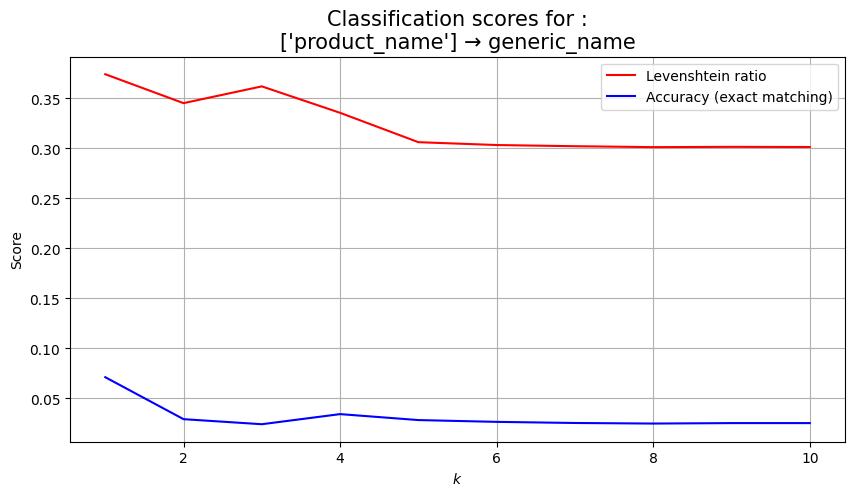

In [223]:
plot_knc_curve(kvals, known_cols, unknown_col, std_curve, lev_curve)

C'est avec 1 voisin qu'on maximise l'exact égalité, et avec 2 voisins la similarité :/

Cela peut être dû au fait que l'exemple des pizzas était constitué de produits qui se ressemblent. Donc un voisin existait, et avait souvent une valeur correcte pour `generic_name`. Avec le dataset complet, on a retiré les doublons, il y a certainement plus de produits "singletons", sans voisin clair. La distance OneHot est à reconsidérer...

##### Prédiction de `pnns_groups_1`

In [224]:
df_work['main_category_fr'].nunique()

3279

In [225]:
known_cols = ['product_name']
unknown_col = 'pnns_groups_1'

(X_train, X_test, y_train, y_test,
 X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc) = construit_probleme(df_fix, known_cols, unknown_col, enc=True)

In [226]:
neigh = KNeighborsClassifier(n_neighbors=3)

In [227]:
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [228]:
y_pred = neigh.predict(X_test)

In [229]:
y_pred

array(['sugary snacks', 'fish meat eggs', 'beverages', ..., 'beverages',
       'beverages', 'beverages'], dtype=object)

In [230]:
lev_score(y_test, y_pred)

0.4546014935340124

In [231]:
(kvals, std_curve, lev_curve) = knc_curve(X_train, y_train, 15)

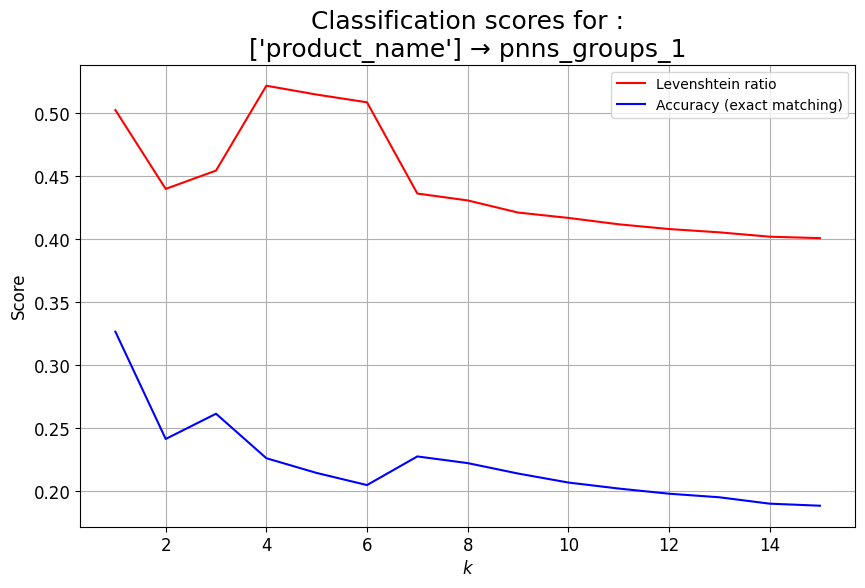

In [232]:
plt.rcParams['figure.figsize'] = [10, 6]
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 12
plt.rcParams['ytick.labelsize'] = 12
plot_knc_curve(kvals, known_cols, unknown_col, std_curve, lev_curve)

Bon, le score est sans doute faible parce que l'on catégorise une variable à partir d'une seule autre. L'espace OneHot fait que tout le monde est voisin de tout le monde, à 1 près, lorsqu'une seule dimension catégorielle est considérée.

Regardons ce que donne une classification avec 2 ou 3 colonnes dans X :

In [233]:
known_cols = ['product_name', 'main_category_fr']
unknown_col = 'pnns_groups_1'

(X_train, X_test, y_train, y_test,
 X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc) = construit_probleme(df_fix, known_cols, unknown_col)

In [234]:
neigh = KNeighborsClassifier(n_neighbors=3) # , metric=lev.distance)

In [235]:
neigh.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [236]:
y_pred = neigh.predict(X_test)

In [237]:
y_pred

array(['sugary snacks', 'fish meat eggs', 'cereals and potatoes', ...,
       'sugary snacks', 'sugary snacks', 'fat and sauces'], dtype=object)

In [238]:
lev_score(y_test, y_pred)

0.9418746213897335

Beaucoup mieux ! La deuxième colonne aide clairement à arbitrer les voisins !

Etudions la meilleure valeur de k :

In [239]:
(kvals, std_curve, lev_curve) = knc_curve(X_train, y_train, 25, disp=True)

k = 1...
 Standard score    = 0.90
 Levenshtein score = 0.93
k = 2...
 Standard score    = 0.91
 Levenshtein score = 0.94
k = 3...
 Standard score    = 0.91
 Levenshtein score = 0.94
k = 4...
 Standard score    = 0.88
 Levenshtein score = 0.93
k = 5...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 6...
 Standard score    = 0.90
 Levenshtein score = 0.94
k = 7...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 8...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 9...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 10...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 11...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 12...
 Standard score    = 0.89
 Levenshtein score = 0.93
k = 13...
 Standard score    = 0.90
 Levenshtein score = 0.94
k = 14...
 Standard score    = 0.90
 Levenshtein score = 0.94
k = 15...
 Standard score    = 0.90
 Levenshtein score = 0.94
k = 16...
 Standard score    = 0.90
 Levenshtein score = 0.93
k = 17...
 Standa

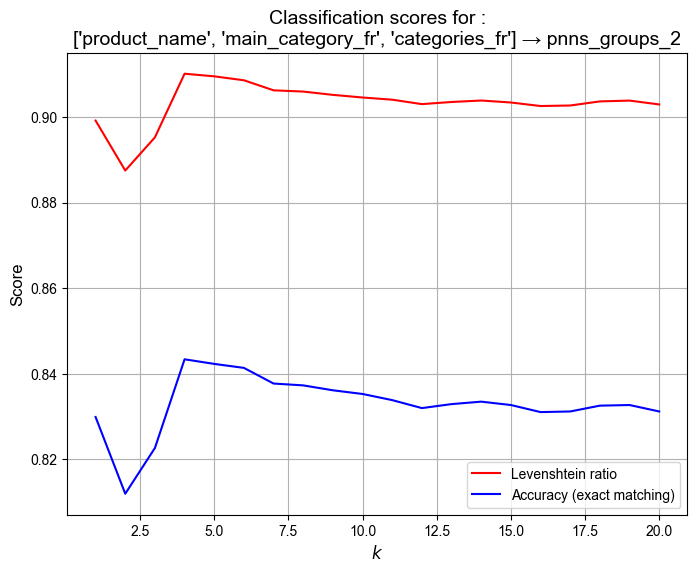

In [246]:
plt.rcParams['font.sans-serif'] = 'Arial'#'Bitstream Vera Sans'#'Avant Garde'#'Geneva'#'Verdana'#'Lucid'#'Helvetica'# 'Arial' #'Lucida Grande' # 'Computer Modern Roman' #'Computer Modern Sans Serif' # ['Computer Modern Roman']
# 'Arial' is more compact, I like it

plt.rcParams['figure.figsize'] = [8, 6]
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plot_knc_curve(kvals, known_cols, unknown_col, std_curve, lev_curve)

In [247]:
lev.distance('A', 'a')

1

In [248]:
lev.ratio('A', 'a')

0.0

Travailler avec une casse homogène pourrait améliorer la mesure de similarité des chaînes, mais pas les valeurs en elles-mêmes, donc on s'arrêtera là.

Classifions `pnns_groups_2` avec de plus en plus de colonnes :

['product_name']...


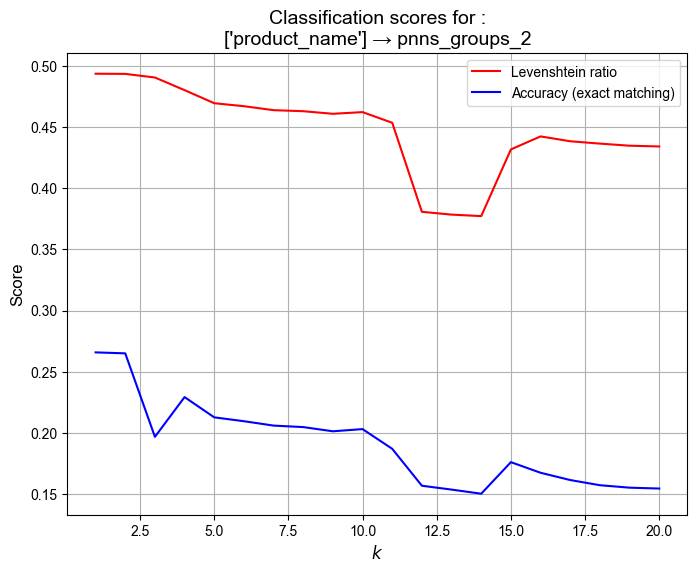

['product_name', 'main_category_fr']...


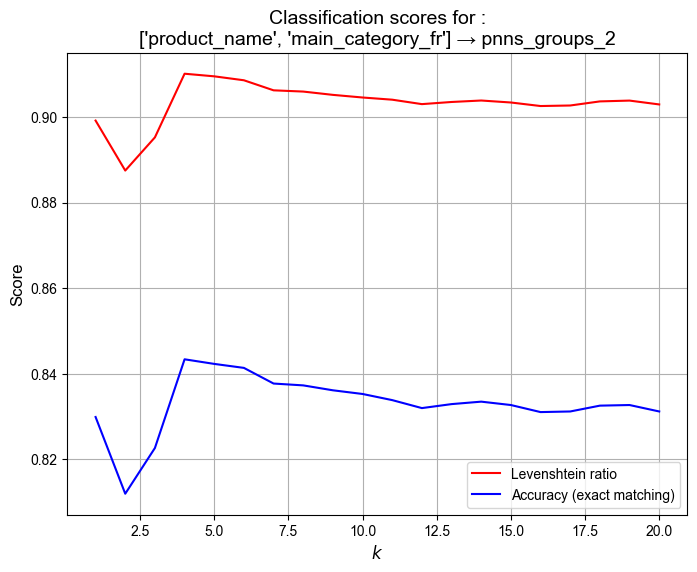

['product_name', 'main_category_fr', 'categories_fr']...


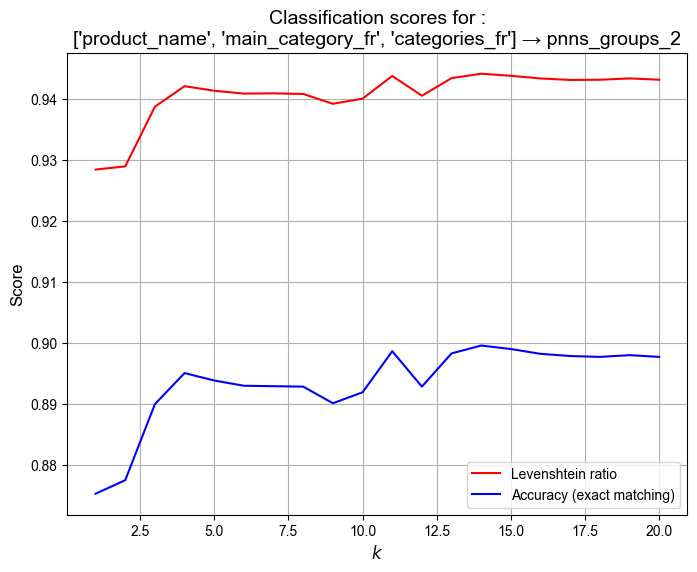

['product_name', 'main_category_fr', 'categories_fr', 'pnns_groups_1']...


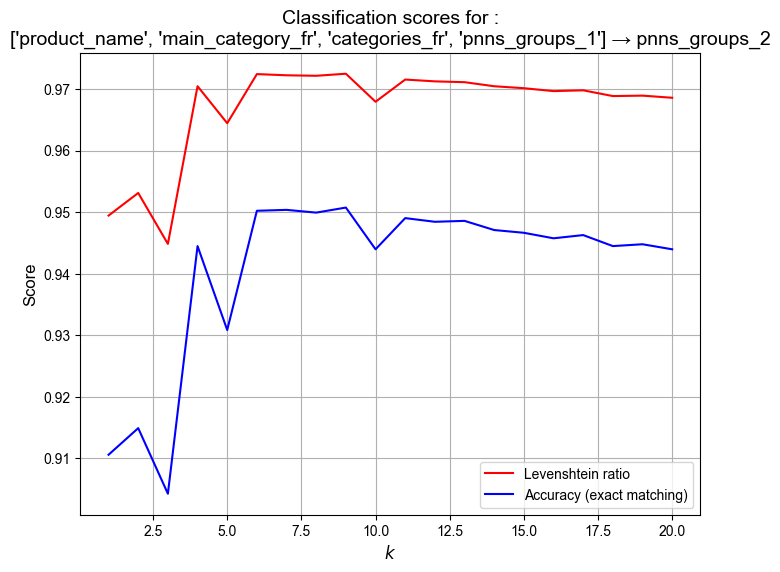

In [249]:
DOE = [
    ['product_name'],
    ['product_name', 'main_category_fr'],
    ['product_name', 'main_category_fr', 'categories_fr'],
    ['product_name', 'main_category_fr', 'categories_fr', 'pnns_groups_1']
]
unknown_col = 'pnns_groups_2'

for known_cols in DOE:
    print(f'{known_cols}...')
    (X_train, X_test, y_train, y_test,
     X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc) = construit_probleme(df_fix, known_cols, unknown_col)
    (kvals, std_curve, lev_curve) = knc_curve(X_train, y_train, 20, disp=False)
    plot_knc_curve(kvals, known_cols, unknown_col, std_curve, lev_curve)

Classifier 1 colonne à l'aide de 4 colonnes catégorielles a de très bonnes performances !

##### Tentative avec un Tf-idf

In [250]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer

In [251]:
known_cols = ['product_name']
unknown_col = 'generic_name'

In [252]:
all_cols = known_cols.copy()
all_cols.extend([unknown_col])
Xy = df_fix.loc[df_fix[unknown_col].notna()][all_cols].copy()
Xu = df_fix.loc[df_fix[unknown_col].isna()][all_cols].copy()

y  = Xy[[unknown_col]].values.reshape(-1,)
yu = Xu[[unknown_col]].values.reshape(-1,)

X  = Xy[known_cols]
Xu = Xu[known_cols]
enc_X = OneHotEncoder(handle_unknown='ignore')
enc_y = OneHotEncoder(handle_unknown='ignore')
X_enc = X

y_enc = y
X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=0)

In [253]:
categories = Xy[unknown_col].unique() #df_fix[df_fix['generic_name'].notna()]['generic_name'].unique()
train_data = Xy

In [254]:
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(X)

# transform a count matrix to a normalized tf-idf representation (tf-idf transformer)
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)

In [255]:
knn = KNeighborsClassifier(n_neighbors=1)

# training our classifier ; train_data.target will be having numbers assigned for each category in train data
clf = knn.fit(X_train_tfidf, y.reshape(1,-1))

# Input Data to predict their classes of the given categories
prods_new = ['Pizza aux frites', 'Pâte à tartiner aux noisettes', 'Mayonnaise', 'yaourts au gingembre']

# building up feature vector of our input
X_new_counts = count_vect.transform(prods_new)

# We call transform instead of fit_transform because it's already been fit
X_new_tfidf = tfidf_transformer.transform(X_new_counts)

In [256]:
# predicting the category of our input text: Will give out number for category
predicted = clf.predict(X_new_tfidf)

In [257]:
predicted

array([['laitue en salade', 'pâtisserie', 'flute', ...,
        'nectar de banane', 'smoked salmon slices', 'eau minérale'],
       ['laitue en salade', 'pâtisserie', 'flute', ...,
        'nectar de banane', 'smoked salmon slices', 'eau minérale'],
       ['laitue en salade', 'pâtisserie', 'flute', ...,
        'nectar de banane', 'smoked salmon slices', 'eau minérale'],
       ['laitue en salade', 'pâtisserie', 'flute', ...,
        'nectar de banane', 'smoked salmon slices', 'eau minérale']],
      dtype=object)

In [259]:
for prod, category in zip(prods_new, predicted[0]):
    print('%r => %s' % (prod, category))

'Pizza aux frites' => laitue en salade
'Pâte à tartiner aux noisettes' => pâtisserie
'Mayonnaise' => flute
'yaourts au gingembre' => pâtisserie


Bon, l'effort est louable, mais ce n'est pas fofollement plus adapté à notre problème.

### Exploration du fonctionnement de `KNNImputer` avec `KNeighborsRegressor`

In [260]:
def construit_probleme_mix(df, target_col, categ_cols=None, num_cols=None, enc=True):
    all_cols = []
    if categ_cols:
        all_cols.extend(categ_cols)
    if num_cols:
        all_cols.extend(num_cols)
    known_cols = all_cols.copy()
    all_cols.extend([target_col])
    
    Xy = df.copy()
    Xu = None
    yu = None
    # Column by column, we separate the known and unknown data
    for col in all_cols:
        Xy = Xy.loc[Xy[col].notna()][all_cols].copy()

    y  = Xy[[target_col]].values.reshape(-1,)
    X  = Xy[known_cols].copy()

    if enc:
        enc_X = OneHotEncoder(handle_unknown='ignore')
        enc_y = None
        X_enc = enc_X.fit_transform(X)
        y_enc = y.copy()
    else:
        enc_X = None
        enc_y = None
        X_enc = X.copy()
        y_enc = y.copy()

    X_train, X_test, y_train, y_test = train_test_split(X_enc, y_enc, test_size=0.2, random_state=0)
    return (X_train, X_test, y_train, y_test, X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc)

In [261]:
def knr_curve(X_train, y_train, X_test, y_test, kmax, disp=False):
    R2_curve = []
    RMSE_curve = []
    MAE_curve = []
    kvals = range(1, kmax+1)
    if disp: 
        endl = '\n'
    else:
        endl = ''
    for k in kvals:
        print(f'k = {k}...',end=endl)

        neigh = KNeighborsRegressor(n_neighbors=k)
        neigh.fit(X_train, y_train)
        y_pred = neigh.predict(X_test)    
            
        R2 = neigh.score(X_test, y_test)
        RMSE = math.sqrt(mean_squared_error(y_test, y_pred))
        MAE = mean_absolute_error(y_test, y_pred)
        R2_curve.append(R2)
        RMSE_curve.append(RMSE)
        MAE_curve.append(MAE)
        if disp :
            print(f' R²   : {R2:.2f}')
            print(f' RMSE : {RMSE:.2f}')
            print(f' MAE  : {MAE:.2f}')
        else:
            print('\r', end=endl)
        
    return(kvals, R2_curve, RMSE_curve, MAE_curve)

In [264]:
def plot_knr_curve(kvals, categ_cols, num_cols, target_col, R2_curve, RMSE_curve=None, MAE_curve=None):

    fig, ax_left = plt.subplots()
    ax_right = ax_left.twinx()

    ax_left.plot(kvals, R2_curve, color='r', label='R²')
    right_color = 'b'
    if RMSE_curve:
        ax_right.plot(kvals, RMSE_curve, color='b', label='RMSE')
    if MAE_curve:
        right_color = 'g'
        ax_right.plot(kvals, MAE_curve, color=right_color, label='MAE')

    known_cols = []
    if categ_cols:
        known_cols.extend(categ_cols)
    if num_cols:
        known_cols.extend(num_cols)

    plt.title(f'Regression scores for:\n{known_cols} → {target_col}')
    ax_left.legend()  # loc='lower right'
    ax_right.legend()  # loc='lower right'
    ax_left.set_xlabel(r'$k$')
    ax_left.set_ylabel(r'$R^2$', color='r')
    ax_right.set_ylabel(r'$RMSE$, $MAE$', color=right_color)
    ax_left.grid(True)
    plt.show()

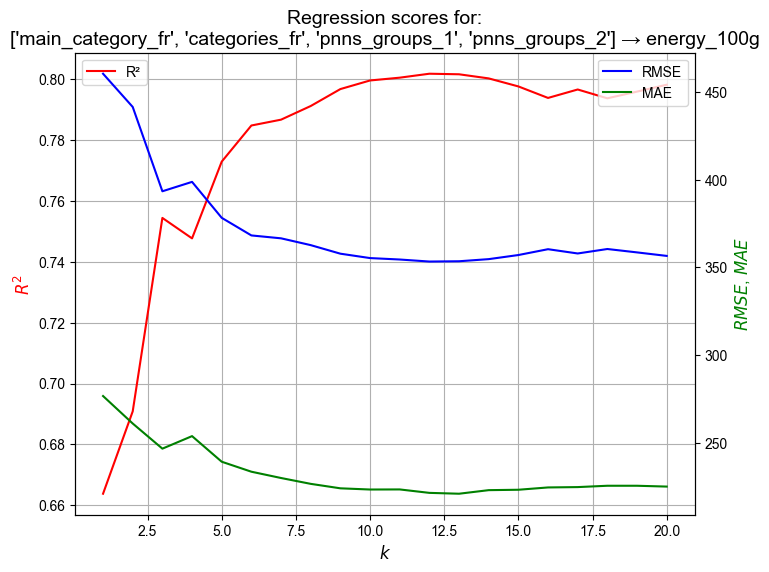

In [265]:
DOE_categ = [
    ['main_category_fr', 'categories_fr', 'pnns_groups_1', 'pnns_groups_2']
]
DOE_num = [None]
target_col = 'energy_100g'

for categ_cols, num_cols in zip(DOE_categ, DOE_num):
    (X_train, X_test, y_train, y_test,
     X, Xu, y, yu, enc_X, enc_y, X_enc, y_enc) = construit_probleme_mix(df_fix, target_col, categ_cols, num_cols)

    (kvals, R2_curve, RMSE_curve, MAE_curve) = knr_curve(X_train, y_train, X_test, y_test, 20, disp=False)
    plot_knr_curve(kvals, categ_cols, num_cols, target_col,
                   R2_curve, RMSE_curve, MAE_curve)

### Imputation : maquettage de `KNNImputer`

In [266]:
categ_cols = [
    # 'product_name', 'brands', # No need to impute them, we chose them "full"
    # 'generic_name', # Too heavy to encode
    # 'main_category_fr', # Too heavy to encode
    # 'categories', # Too heavy to encode
    # 'categories_fr', # Too heavy to encode, and no longer very useful if we keep only the first value
    'pnns_groups_1',
    'pnns_groups_2',
    # 'additives_fr' # We must avoid imputing this column because when it is empty, it has a particular meaning
]
num_cols = [
    'energy_100g',
    'proteins_100g',
    'carbohydrates_100g', 'sugars_100g',
    'fat_100g', 'saturated-fat_100g',
    'sodium_100g',
    'fiber_100g',
    'nutrition-score-fr_100g',
    # 'additives_n', # Same as additives_fr
]
all_cols = []
if categ_cols:
    all_cols.extend(categ_cols)
if num_cols:
    all_cols.extend(num_cols)

In [267]:
# Little test on df_fus
Xfix = df_fix.copy()
X = Xfix.iloc[0:1000][all_cols]

In [268]:
X

,pnns_groups_1,pnns_groups_2,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g
166,fruits and vegetables,vegetables,1210.0,22.00,23.0,0.0,12.0,7.0,0.850,2.00,6.0
167,sugary snacks,biscuits and cakes,1520.0,4.79,54.1,28.1,14.4,NaN,0.363,2.05,NaN
168,cereals and potatoes,bread,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
169,sugary snacks,biscuits and cakes,1090.0,3.33,38.7,24.7,10.7,2.0,0.255,2.00,9.0
171,cereals and potatoes,legumes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
60999,beverages,non-sugared beverages,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61000,beverages,non-sugared beverages,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61001,beverages,non-sugared beverages,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61002,beverages,non-sugared beverages,10.0,0.00,0.3,0.0,0.0,0.0,NaN,0.00,NaN


##### Encodage colonne par colonne

In [269]:
X_enc = X.copy()

enc = True
enc_X = {}
for col in categ_cols:
    if enc:
        enc_X[col] = OneHotEncoder(handle_unknown='ignore')
        enc_y = None
        print(X[col])
        X_enc[col] = pd.DataFrame(enc_X[col].fit_transform(X[[col]])) # .to_numpy().reshape(1,-1)
        y_enc = y.copy()
    else:
        enc_X[col] = None
        enc_y = None
        X_enc = X.copy()
        y_enc = y.copy()

166      fruits and vegetables
167              sugary snacks
168       cereals and potatoes
169              sugary snacks
171       cereals and potatoes
                 ...          
60999                beverages
61000                beverages
61001                beverages
61002                beverages
61006                beverages
Name: pnns_groups_1, Length: 1000, dtype: object
166                 vegetables
167         biscuits and cakes
168                      bread
169         biscuits and cakes
171                    legumes
                 ...          
60999    non-sugared beverages
61000    non-sugared beverages
61001    non-sugared beverages
61002    non-sugared beverages
61006    non-sugared beverages
Name: pnns_groups_2, Length: 1000, dtype: object


In [270]:
knn_imputer = KNNImputer(n_neighbors=3)

##### Encodage avec ColumnTransformer

In [271]:
preprocessor = ColumnTransformer(
    [
        ("categorical", OneHotEncoder(sparse=False,handle_unknown='ignore'), categ_cols),
        ("numerical", MinMaxScaler(), num_cols),
    ],
    verbose_feature_names_out=False,
)
preprocessor.fit(X)

ColumnTransformer(transformers=[('categorical',
                                 OneHotEncoder(handle_unknown='ignore',
                                               sparse=False),
                                 ['pnns_groups_1', 'pnns_groups_2']),
                                ('numerical', MinMaxScaler(),
                                 ['energy_100g', 'proteins_100g',
                                  'carbohydrates_100g', 'sugars_100g',
                                  'fat_100g', 'saturated-fat_100g',
                                  'sodium_100g', 'fiber_100g',
                                  'nutrition-score-fr_100g'])],
                  verbose_feature_names_out=False)

In [272]:
preprocessor.get_feature_names_out()

array(['pnns_groups_1_beverages', 'pnns_groups_1_cereals and potatoes',
       'pnns_groups_1_composite foods', 'pnns_groups_1_fat and sauces',
       'pnns_groups_1_fish meat eggs',
       'pnns_groups_1_fruits and vegetables',
       'pnns_groups_1_milk and dairy products',
       'pnns_groups_1_salty snacks', 'pnns_groups_1_sugary snacks',
       'pnns_groups_1_nan', 'pnns_groups_2_alcoholic beverages',
       'pnns_groups_2_appetizers',
       'pnns_groups_2_artificially sweetened beverages',
       'pnns_groups_2_biscuits and cakes', 'pnns_groups_2_bread',
       'pnns_groups_2_breakfast cereals', 'pnns_groups_2_cereals',
       'pnns_groups_2_cheese', 'pnns_groups_2_chocolate products',
       'pnns_groups_2_dairy desserts',
       'pnns_groups_2_dressings and sauces', 'pnns_groups_2_dried fruits',
       'pnns_groups_2_eggs', 'pnns_groups_2_fats',
       'pnns_groups_2_fish and seafood', 'pnns_groups_2_fruit juices',
       'pnns_groups_2_fruit nectars', 'pnns_groups_2_fruits',


In [273]:
%%time
X_enc = preprocessor.transform(X)
knn_imputer = {}
X_imp = {}
kmax=1
for k in range(1,kmax+1):
    knn_imputer[k] = KNNImputer(n_neighbors=k)
    X_imp[k] = knn_imputer[k].fit_transform(X_enc)

Wall time: 62.3 ms


Ce fut difficile : KNNImputer nous oblige à travailler en "dense array", mais avec toutes les colonnes prévues initialement :

```
['generic_name',
  'main_category_fr', 'categories', 'categories_fr',
  'pnns_groups_1', 'pnns_groups_2',
  'energy_100g',
  'proteins_100g',
  'carbohydrates_100g', 'sugars_100g',
  'fat_100g', 'saturated-fat_100g',
  'sodium_100g', 'fiber_100g',
  'nutrition-score-fr_100g']
```  
cela donne :
```
MemoryError: Unable to allocate array with shape (283891, 407534) and data type float64
```
😅
On a commencé par alléger les données. Actions : 
 - suppression des ' ', des blancs en début et fin de chaîne (possible fusion de valeurs)
 - passage en minuscules (possible fusion de valeurs)
 - conservation d'une seule valeurs dans les catégories à valeurs multiples (la première)  (possible fusion de valeurs)
 - on a même vu passer la valeur `🍺` (remplacement pas `bière`, pour l'honneur)
 
Ca nous a amené à : 
```
MemoryError: Unable to allocate array with shape (283891, 319903) and data type float64
```

On a dû passer à :
 - abandon des variables `main_category_fr`, `categories_fr`

```
MemoryError: Unable to allocate array with shape (283891, 248309) and data type float64
```

Il ne reste plus que : `['pnns_groups_1', 'pnns_groups_2']` dans les variables catégorielles, mais toutes les colonnes numériques. Le KNNImputer a enfin tourné !

Mais les problèmes ne sont pas terminés :

In [274]:
X_imp

{1: array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         3.54166667e-02, 4.28265525e-02, 4.25000000e-01],
        [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         1.51250000e-02, 4.38972163e-02, 6.00000000e-01],
        [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
         2.40833333e-02, 4.75374732e-02, 3.25000000e-01],
        ...,
        [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 1.86295503e-02, 1.75000000e-01],
        [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         5.00000000e-05, 0.00000000e+00, 2.50000000e-02],
        [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
         0.00000000e+00, 1.86295503e-02, 1.75000000e-01]])}

In [275]:
x = preprocessor.transformers_[0][1].inverse_transform(X_imp[1][:,0:44])
x

array([['fruits and vegetables', 'vegetables'],
       ['sugary snacks', 'biscuits and cakes'],
       ['cereals and potatoes', 'bread'],
       ...,
       ['beverages', 'non-sugared beverages'],
       ['beverages', 'non-sugared beverages'],
       ['beverages', 'non-sugared beverages']], dtype=object)

On a des NaN dans la version imputée !!

**Explication :** Le OneHotEncoder a créé une colonne `_nan` pour chaque catégorie, avec des 0 et 1 dans cette colonne, ce qui supprime la notion de **valeur manquante**. Il nous faut rétablir les `NaN` dans les colonnes encodées (et supprimer la colonne `_nan` au passage). 

In [276]:
class OHE_with_nan(BaseEstimator, TransformerMixin):
    """One-hot encode, propagating NaNs.
    Requires a dataframe as input!
    """
    def fit(self, X, y=None):
        self.orig_cols_ = X.columns
        self.imputer_ = SimpleImputer(strategy="constant", fill_value="MISSING")
        X_filled = self.imputer_.fit_transform(X)
        self.ohe_ = OneHotEncoder(sparse=False, handle_unknown="ignore")
        self.ohe_.fit(X_filled)

        self.ohe_colnames_ = self.ohe_.get_feature_names_out(X.columns)
        self.missing_value_columns = np.array(["MISSING" in col for col in self.ohe_colnames_])
        return self

    def transform(self, X, y=None):
        raw_ohe = pd.DataFrame(self.ohe_.transform(self.imputer_.transform(X)), columns=self.ohe_colnames_)
        out_list = []
        # Loop over columns to replace 0s with nan the correct places.
        self.filled_cols_ = [] # CG
        self.missing_cols_ = [] # CG
        for orig_col in self.orig_cols_:
            tmp_data = raw_ohe[self.ohe_colnames_[pd.Series(self.ohe_colnames_).str.startswith(orig_col)]].copy()
            missing_name = tmp_data.columns[["MISSING" in col for col in tmp_data.columns]]
            filled_name = list(tmp_data.columns[["MISSING" not in col for col in tmp_data.columns]]) # CG
            missing_indices = np.where(tmp_data[missing_name]==1)[0]
            tmp_data.loc[missing_indices, :] = np.nan
            tmp_data1 = tmp_data.drop(missing_name, axis=1)
            out_list.append(tmp_data1)
            self.filled_cols_.extend(filled_name) # CG
            self.missing_cols_.extend(missing_name) # CG 
        out = pd.concat(out_list, axis=1)
        return out
    
    def inverse_transform(self, X, y=None): # all CG
        X2 = X.copy()
        df2 = pd.DataFrame(X2,columns=self.filled_cols_)
        for col in self.missing_cols_:
            df2[col] = np.zeros((X.shape[0],1))
        df2 = pd.DataFrame(df2,columns=self.ohe_colnames_)
        return self.ohe_.inverse_transform(df2)

In [277]:
preprocessor = ColumnTransformer(
    [
#         ("categorical", OneHotEncoder(sparse=False,handle_unknown='ignore'), categ_cols),
        ("categorical", OHE_with_nan(), categ_cols),
        ("numerical", MinMaxScaler(), num_cols),
    ],
    verbose_feature_names_out=False,
)
preprocessor.fit(X)

ColumnTransformer(transformers=[('categorical', OHE_with_nan(),
                                 ['pnns_groups_1', 'pnns_groups_2']),
                                ('numerical', MinMaxScaler(),
                                 ['energy_100g', 'proteins_100g',
                                  'carbohydrates_100g', 'sugars_100g',
                                  'fat_100g', 'saturated-fat_100g',
                                  'sodium_100g', 'fiber_100g',
                                  'nutrition-score-fr_100g'])],
                  verbose_feature_names_out=False)

In [278]:
%%time
Xfus_enc = preprocessor.transform(X)
knn_imputer_fus = {}
Xfus_imp = {}
kmax = 1
for k in range(1,kmax+1):
    knn_imputer_fus[k] = KNNImputer(n_neighbors=k) # , missing_values=np.nan
    Xfus_imp[k] = knn_imputer_fus[k].fit_transform(Xfus_enc)

Wall time: 85.3 ms


In [279]:
Xfus_enc

array([[0.        , 0.        , 0.        , ..., 0.03541667, 0.04282655,
        0.425     ],
       [0.        , 0.        , 0.        , ..., 0.015125  , 0.04389722,
               nan],
       [0.        , 1.        , 0.        , ...,        nan,        nan,
               nan],
       ...,
       [1.        , 0.        , 0.        , ...,        nan,        nan,
               nan],
       [1.        , 0.        , 0.        , ...,        nan, 0.        ,
               nan],
       [1.        , 0.        , 0.        , ...,        nan,        nan,
               nan]])

In [280]:
Xfus_enc.shape

(1000, 52)

In [281]:
Xfus_imp[1]

array([[0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        3.54166667e-02, 4.28265525e-02, 4.25000000e-01],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        1.51250000e-02, 4.38972163e-02, 6.00000000e-01],
       [0.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        1.93750000e-02, 4.98929336e-02, 3.00000000e-01],
       ...,
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 5.75000000e-01],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        5.00000000e-05, 0.00000000e+00, 2.50000000e-02],
       [1.00000000e+00, 0.00000000e+00, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 5.75000000e-01]])

In [282]:
Xfus_imp[1].shape

(1000, 52)

In [283]:
nb_enc_cols = len(preprocessor.transformers_[0][1].filled_cols_)
nb_enc_cols

43

In [284]:
Xfus_imp[1][:,0:nb_enc_cols]

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.],
       [1., 0., 0., ..., 0., 0., 0.]])

In [285]:
Xfus_imp_dec = preprocessor.transformers_[0][1].inverse_transform(Xfus_imp[1][:,0:nb_enc_cols])
Xfus_imp_dec

array([['fruits and vegetables', 'vegetables'],
       ['sugary snacks', 'biscuits and cakes'],
       ['cereals and potatoes', 'bread'],
       ...,
       ['beverages', 'non-sugared beverages'],
       ['beverages', 'non-sugared beverages'],
       ['beverages', 'non-sugared beverages']], dtype=object)

In [286]:
df_fus_imp_dec = pd.DataFrame(Xfus_imp_dec,columns=categ_cols)
df_fus_imp_dec

,pnns_groups_1,pnns_groups_2
0,fruits and vegetables,vegetables
1,sugary snacks,biscuits and cakes
2,cereals and potatoes,bread
3,sugary snacks,biscuits and cakes
4,cereals and potatoes,legumes
...,...,...
995,beverages,non-sugared beverages
996,beverages,non-sugared beverages
997,beverages,non-sugared beverages
998,beverages,non-sugared beverages


In [287]:
Xfus_num = preprocessor.transformers_[1][1].inverse_transform(Xfus_imp[1][:,nb_enc_cols:])

In [288]:
df_fus_imp_num = pd.DataFrame(Xfus_num,columns=num_cols)
df_fus_imp_num

,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g
0,1210.0,22.00,23.00,0.00,12.00,7.0,0.8500,2.00,6.0
1,1520.0,4.79,54.10,28.10,14.40,2.0,0.3630,2.05,13.0
2,1170.0,9.30,51.20,6.98,2.33,0.0,0.4650,2.33,1.0
3,1090.0,3.33,38.70,24.70,10.70,2.0,0.2550,2.00,9.0
4,331.0,4.76,15.08,0.79,0.00,0.0,0.2620,6.30,-5.0
...,...,...,...,...,...,...,...,...,...
995,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
996,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
997,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
998,10.0,0.00,0.30,0.00,0.00,0.0,0.0012,0.00,-10.0


In [289]:
df_fus_imp_num

,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g
0,1210.0,22.00,23.00,0.00,12.00,7.0,0.8500,2.00,6.0
1,1520.0,4.79,54.10,28.10,14.40,2.0,0.3630,2.05,13.0
2,1170.0,9.30,51.20,6.98,2.33,0.0,0.4650,2.33,1.0
3,1090.0,3.33,38.70,24.70,10.70,2.0,0.2550,2.00,9.0
4,331.0,4.76,15.08,0.79,0.00,0.0,0.2620,6.30,-5.0
...,...,...,...,...,...,...,...,...,...
995,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
996,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
997,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
998,10.0,0.00,0.30,0.00,0.00,0.0,0.0012,0.00,-10.0


In [290]:
df_fus_imp = pd.concat([df_fus_imp_dec,df_fus_imp_num],axis=1)
df_fus_imp

,pnns_groups_1,pnns_groups_2,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g
0,fruits and vegetables,vegetables,1210.0,22.00,23.00,0.00,12.00,7.0,0.8500,2.00,6.0
1,sugary snacks,biscuits and cakes,1520.0,4.79,54.10,28.10,14.40,2.0,0.3630,2.05,13.0
2,cereals and potatoes,bread,1170.0,9.30,51.20,6.98,2.33,0.0,0.4650,2.33,1.0
3,sugary snacks,biscuits and cakes,1090.0,3.33,38.70,24.70,10.70,2.0,0.2550,2.00,9.0
4,cereals and potatoes,legumes,331.0,4.76,15.08,0.79,0.00,0.0,0.2620,6.30,-5.0
...,...,...,...,...,...,...,...,...,...,...,...
995,beverages,non-sugared beverages,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
996,beverages,non-sugared beverages,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
997,beverages,non-sugared beverages,0.0,0.00,0.00,5.56,0.00,17.0,0.0000,0.00,12.0
998,beverages,non-sugared beverages,10.0,0.00,0.30,0.00,0.00,0.0,0.0012,0.00,-10.0


### Imputation du dataset complet avec `KNNImputer`

In [291]:
df_fix[all_cols].isna().sum().sum()

180515

In [292]:
df_fix.shape

(69717, 27)

In [293]:
Xfix = df_fix.copy()
X = Xfix[all_cols]

In [294]:
categ_cols = ['pnns_groups_1', 'pnns_groups_2']
num_cols = [
    'energy_100g',
    'proteins_100g',
    'carbohydrates_100g',
    'sugars_100g',
    'fat_100g',
    'saturated-fat_100g',
    'sodium_100g',
    'fiber_100g',
    'nutrition-score-fr_100g'
]

In [295]:
preprocessor = ColumnTransformer(
    [
        ("categorical", OHE_with_nan(), categ_cols),
        ("numerical", MinMaxScaler(), num_cols),
    ],
    verbose_feature_names_out=False,
)
preprocessor.fit(X)

ColumnTransformer(transformers=[('categorical', OHE_with_nan(),
                                 ['pnns_groups_1', 'pnns_groups_2']),
                                ('numerical', MinMaxScaler(),
                                 ['energy_100g', 'proteins_100g',
                                  'carbohydrates_100g', 'sugars_100g',
                                  'fat_100g', 'saturated-fat_100g',
                                  'sodium_100g', 'fiber_100g',
                                  'nutrition-score-fr_100g'])],
                  verbose_feature_names_out=False)

In [296]:
%%time
Xfus_enc = preprocessor.transform(X)
knn_imputer_fus = {}
Xfus_imp = {}
kmax = 1
for k in range(1, kmax+1):
    knn_imputer_fus[k] = KNNImputer(n_neighbors=k) # , missing_values=np.nan
    Xfus_imp[k] = knn_imputer_fus[k].fit_transform(Xfus_enc)

Wall time: 7min 55s


In [297]:
Xfus_imp[1].shape

(69717, 54)

In [298]:
nb_enc_cols = len(preprocessor.transformers_[0][1].filled_cols_)
print(nb_enc_cols)

45


In [299]:
Xfus_imp[1][:, nb_enc_cols:].shape

(69717, 9)

In [344]:
with open(data_processed_dir+f'Xfus_imp.pkl', 'wb') as output:
    pickle.dump(Xfus_imp[1], output, pickle.HIGHEST_PROTOCOL)

In [301]:
def rebuild_df_imp(preprocessor, df_fix, Xfus_imp, categ_cols, num_cols):
    nb_enc_cols = len(preprocessor.transformers_[0][1].filled_cols_)
    Xfus_imp_dec = preprocessor.transformers_[
        0][1].inverse_transform(Xfus_imp[:, 0:nb_enc_cols])

    df_fus_imp_dec = pd.DataFrame(Xfus_imp_dec, columns=categ_cols)

    Xfus_num = preprocessor.transformers_[
        1][1].inverse_transform(Xfus_imp[:, nb_enc_cols:])
    df_imp_num = pd.DataFrame(Xfus_num, columns=num_cols)

    df_imp = df_fix[['product_name', 'brands']].copy()
    df_imp.reset_index(inplace=True, drop=True)

    df_imp = pd.concat([df_imp, df_fus_imp_dec, df_imp_num], axis=1)

    # Finally, we compare additives and palm oil for our Use Cases:
    # be careful with index !
    df_imp['additives_n'] = df_fix['additives_n'].values
    # be careful with index !
    df_imp['ingredients_from_palm_oil_n'] = df_fix['ingredients_from_palm_oil_n'].values
    df_imp['labels_n'] = df_fix['labels_n'].values  # be careful with index !

    return df_imp

In [302]:
df_imp = rebuild_df_imp(preprocessor, df_fix, Xfus_imp[1], categ_cols, num_cols)

In [303]:
df_imp.columns

Index(['product_name', 'brands', 'pnns_groups_1', 'pnns_groups_2',
       'energy_100g', 'proteins_100g', 'carbohydrates_100g', 'sugars_100g',
       'fat_100g', 'saturated-fat_100g', 'sodium_100g', 'fiber_100g',
       'nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'labels_n'],
      dtype='object')

In [304]:
df_imp.shape

(69717, 16)

In [305]:
df_fix['ingredients_from_palm_oil_n'].unique()

array([0, 1, 2], dtype=int64)

### Recalcul du Nutri-Score à partir du Nutrigrade imputé

In [306]:
nutri_bins = [-15,0,3,11,19,41]
nutri_lett = ['A','B','C','D','E']

In [307]:
add_moy = {}
df_imp['nutrition_grade_fr'] = '-'
for ind in range(len(nutri_bins)-1):
    a, b = nutri_bins[ind], nutri_bins[ind+1]
    ns = nutri_lett[ind]
    selected = (df_imp['nutrition-score-fr_100g']>=a) & (df_imp['nutrition-score-fr_100g']<b)
    df = df_imp.loc[selected, 'additives_n']
    am = df.mean()
    add_moy[ns] = am
    df_imp.loc[selected, 'nutrition_grade_fr'] = ns

In [345]:
with open(data_processed_dir+f'df_imp.pkl', 'wb') as output:
    pickle.dump(df_imp, output, pickle.HIGHEST_PROTOCOL)

In [346]:
with open(data_processed_dir+f'df_fix.pkl', 'wb') as output:
    pickle.dump(df_fix, output, pickle.HIGHEST_PROTOCOL)

#### Voyons voyons

In [310]:
df_imp.iloc[0:20]

,product_name,brands,pnns_groups_1,pnns_groups_2,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,labels_n,nutrition_grade_fr
0,Salade Cesar,Kirkland Signature,fruits and vegetables,vegetables,1210.0,22.00,23.00,0.000,12.00,7.00,0.850000,2.000,6.0,0,0,0,C
1,Danoises à la cannelle roulées,Kirkland Signature,sugary snacks,biscuits and cakes,1520.0,4.79,54.10,28.100,14.40,8.50,0.363000,2.050,0.0,10,0,0,B
2,Flute,Waitrose,cereals and potatoes,bread,1170.0,9.30,51.20,6.980,2.33,0.00,0.465000,2.330,1.0,0,0,0,B
3,Chaussons tressés aux pommes,Kirkland Signature,sugary snacks,biscuits and cakes,1090.0,3.33,38.70,24.700,10.70,2.00,0.255000,2.000,9.0,5,0,0,C
4,lentilles vertes,Bertrand Lejeune,cereals and potatoes,legumes,331.0,4.76,15.08,0.790,0.00,0.00,0.262000,6.300,-5.0,0,0,3,A
5,Biscuits sablés fourrage au cacao,St Michel,sugary snacks,biscuits and cakes,1520.0,4.79,54.10,28.100,14.40,2.00,0.363000,2.050,9.0,3,0,1,C
6,Quiche Lorraine,Kirkland Signature,composite foods,pizza pies and quiche,478.0,5.36,7.86,0.714,6.79,2.86,0.196000,0.357,2.0,3,0,0,B
7,Pâté au poulet,Kirkland Signature,fish meat eggs,meat,751.0,33.90,16.60,0.000,10.20,2.90,0.289000,0.000,0.0,0,0,0,B
8,Thé de Noël aromatisé orange-cannelle,Alice Délice,beverages,non-sugared beverages,0.0,0.00,0.00,0.000,0.00,0.00,0.000000,0.000,0.0,0,0,0,B
9,Belgische Pralinen,J. D. Gross,sugary snacks,sweets,2257.0,4.70,53.80,51.500,33.30,21.10,0.035433,4.000,26.0,3,0,3,E


In [311]:
df_imp.describe()

,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,labels_n
count,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000,69717.000000
mean,998.469382,7.451895,24.993014,12.411939,12.179453,4.819477,0.328060,1.842063,7.055883,1.463804,0.047306,1.595292
std,805.704160,8.164155,26.991048,18.688673,17.232264,8.170681,0.740543,3.374185,9.040809,2.370781,0.215645,2.131507
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-15.000000,0.000000,0.000000,0.000000
25%,278.000000,1.000000,2.900000,0.600000,0.400000,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,845.000000,5.000000,12.100000,3.330000,4.500000,1.300000,0.138000,0.700000,5.000000,0.000000,0.000000,1.000000
75%,1553.000000,10.000000,50.700000,15.000000,19.000000,6.100000,0.440945,2.200000,14.000000,2.000000,0.000000,3.000000
max,3925.000000,86.000000,105.000000,105.000000,101.000000,100.000000,83.000000,94.800000,40.000000,31.000000,2.000000,22.000000


Le dataset imputé a des caractéristiques très correctes.

In [312]:
df_imp.isna().sum().sum()

0

### Evaluation du modèle d'imputation

`KNNImputer` n'est pas un algorithme supervisé. Tester la bonne imputation peut être réalisé en :
 - réduisant un dataset avec des valeurs totalement connues
 - remplaçant des valeurs par des `NaN` de manière aléatoire
 - effectuant l'imputation avec le modèle
 - comparant les valeurs imputées aux valeurs initiales. 

#### Calcul du taux de NaN dans le dataset à imputer, pour s'aligner avec ce taux dans l'évaluation de la performance

In [313]:
nan_rate = df_fix.isna().sum().sum()/(df_fix.shape[0]*df_fix.shape[1])
nan_rate

0.1932458154900314

#### Extraction d'un dataset plein 

In [314]:
df_full = df_fix[df_fix.notnull().all(axis=1)]

In [315]:
df_full.shape

(678, 27)

In [316]:
N = df_full.shape[0] * df_full.shape[1]

In [317]:
N

18306

In [318]:
n = int(nan_rate * N)

In [319]:
n

3537

#### Remplacement de valeurs aléatoires par `NaN` 

In [320]:
a = np.random.randint(0,N,size=df_full.shape)
a

array([[15760,  9884,  8037, ...,   548,  2635,  7376],
       [ 1215,  4876, 12890, ..., 13915,  2950, 18259],
       [ 9739, 13682,  2924, ...,  2298,  7659,  2315],
       ...,
       [13494, 17843, 15771, ...,  3831, 15558,  5315],
       [12638,  2794,  8844, ..., 10663,  4631,  6906],
       [ 1017, 14192,  2578, ...,  8825, 16364, 13137]])

In [321]:
alea_mat = a < n

In [322]:
len(a[alea_mat])

3552

In [323]:
alea_mat

array([[False, False, False, ...,  True,  True, False],
       [ True, False, False, ..., False,  True, False],
       [False, False,  True, ...,  True, False,  True],
       ...,
       [False, False, False, ..., False, False, False],
       [False,  True, False, ..., False, False, False],
       [ True, False,  True, ..., False, False, False]])

In [324]:
df_holed = df_full.copy()

In [325]:
df_holed[alea_mat] = np.nan

In [326]:
nan_rate2 = df_holed.isna().sum().sum()/(df_holed.shape[0]*df_holed.shape[1])
nan_rate2

0.19403474270730908

On a à peu près le même taux de NaN que le dataset original.

#### Imputation

In [327]:
categ_cols

['pnns_groups_1', 'pnns_groups_2']

In [328]:
num_cols

['energy_100g',
 'proteins_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fat_100g',
 'saturated-fat_100g',
 'sodium_100g',
 'fiber_100g',
 'nutrition-score-fr_100g']

In [329]:
all_cols = []
if categ_cols:
    all_cols.extend(categ_cols)
if num_cols:
    all_cols.extend(num_cols)

In [330]:
all_cols

['pnns_groups_1',
 'pnns_groups_2',
 'energy_100g',
 'proteins_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fat_100g',
 'saturated-fat_100g',
 'sodium_100g',
 'fiber_100g',
 'nutrition-score-fr_100g']

In [331]:
Xfix = df_holed.copy()
X = Xfix[all_cols]

In [332]:
preprocessor = ColumnTransformer(
    [
        ("categorical", OHE_with_nan(), categ_cols),
        ("numerical", MinMaxScaler(), num_cols),
    ],
    verbose_feature_names_out=False,
)
preprocessor.fit(X)

ColumnTransformer(transformers=[('categorical', OHE_with_nan(),
                                 ['pnns_groups_1', 'pnns_groups_2']),
                                ('numerical', MinMaxScaler(),
                                 ['energy_100g', 'proteins_100g',
                                  'carbohydrates_100g', 'sugars_100g',
                                  'fat_100g', 'saturated-fat_100g',
                                  'sodium_100g', 'fiber_100g',
                                  'nutrition-score-fr_100g'])],
                  verbose_feature_names_out=False)

In [333]:
%%time
X_enc = preprocessor.transform(X)
k = 1
knn = KNNImputer(n_neighbors=k)
X_imp = knn.fit_transform(X_enc)

Wall time: 94.9 ms


In [334]:
X_imp.shape

(678, 39)

In [335]:
df_imp_test = rebuild_df_imp(preprocessor, df_full, X_imp, categ_cols, num_cols)

In [336]:
df_imp_test.shape

(678, 16)

In [337]:
df_imp_test

,product_name,brands,pnns_groups_1,pnns_groups_2,energy_100g,proteins_100g,carbohydrates_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fiber_100g,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,labels_n
0,Wrap Poulet à la Jamaïcaine,Marks & Spencer,composite foods,one-dish meals,811.0,5.9,8.2,1.3,5.3,1.9,0.236220,2.3,-3.0,7,1,1
1,Chocolate Chunk Crispy Cookies - Dark Chocolat...,Pepperidge Farm,sugary snacks,biscuits and cakes,2269.0,5.1,66.0,34.0,32.4,12.8,0.315000,3.0,21.0,7,1,2
2,Chocolate Chunk White Chocolate Macadamia Cris...,"Chocolate Chunk,Pepperidge Farm",sugary snacks,biscuits and cakes,2238.0,5.0,58.7,30.4,31.3,13.9,0.314961,3.6,20.0,6,1,2
3,Chocolate Chip Cookies,"Marks & Spencer,M&S",sugary snacks,biscuits and cakes,2080.0,7.0,61.7,35.3,24.5,12.4,0.228346,3.0,21.0,6,1,1
4,Iced & Spiced Soft Bun,Marks & Spencer,sugary snacks,pastries,1276.0,4.9,56.0,22.0,3.6,1.6,0.129921,2.2,13.0,6,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
673,Milka & Oreo,"Milka,Oreo",sugary snacks,sweets,2335.0,5.6,56.0,49.0,34.0,19.0,0.224409,1.6,27.0,4,1,5
674,Bloc Noir Pistaches Caramélisées,Côte d'Or,sugary snacks,chocolate products,2272.0,6.6,50.0,46.0,33.5,17.0,0.003937,7.7,21.0,2,1,1
675,Praliné Fondant Lait,Côte d'Or,sugary snacks,chocolate products,2240.0,6.7,58.0,56.0,30.0,15.5,0.078740,2.5,23.0,1,1,1
676,Dessert 58 Praliné,Côte d'Or,sugary snacks,chocolate products,2270.0,8.0,54.0,51.0,32.0,15.5,0.078740,3.2,22.0,1,1,1


#### Comparaison des valeurs et scoring 

In [338]:
alea_df = pd.DataFrame(data=alea_mat, columns=df_holed.columns)

##### Partie catégorielle :

In [339]:
for col in categ_cols:
    print(bcolors.BOLD+col+bcolors.ENDC)
    # Extraction des valeurs imputées
    y_test = df_full.loc[alea_df[col].values, col]
    y_pred = df_imp_test.loc[alea_df[col].values, col]
    
    # Score avec similarité de Levenshtein 
    s = lev_score(y_test, y_pred)
    print(f' Levenshtein ratio : {s:.2f}')
    
    # Score avec exact matching
    s2 = (y_pred.astype('str').values==y_test.astype('str').values).mean()
    print(f' Exact matching    : {s2:.2f}')
    print('')

pnns_groups_1
 Levenshtein ratio : 0.95
 Exact matching    : 0.91

pnns_groups_2
 Levenshtein ratio : 0.85
 Exact matching    : 0.78



In [340]:
len(df_full['pnns_groups_1'].unique())

9

In [341]:
len(df_full['pnns_groups_2'].unique())

22

##### Partie numérique :

In [343]:
for col in num_cols:
    print(bcolors.BOLD+col+bcolors.ENDC)
    # Extraction of the imputed values
    y_test = df_full.loc[alea_df[col].values,col]
    y_pred = df_imp_test.loc[alea_df[col].values,col]
    
    R2 = r2_score(y_test, y_pred)
    RMSE = math.sqrt(mean_squared_error(y_test, y_pred))
    MAE = mean_absolute_error(y_test, y_pred)

    print(f' µ    : {y_test.mean():.2f}')
    print(f' R²   : {R2:.2f}')
    print(f' RMSE : {RMSE:.2f}')
    print(f' MAE  : {MAE:.2f}')
    print('')

energy_100g
 µ    : 1767.20
 R²   : 0.76
 RMSE : 244.60
 MAE  : 112.96

proteins_100g
 µ    : 7.06
 R²   : 0.35
 RMSE : 2.26
 MAE  : 1.32

carbohydrates_100g
 µ    : 54.13
 R²   : 0.67
 RMSE : 11.54
 MAE  : 5.71

sugars_100g
 µ    : 25.34
 R²   : 0.76
 RMSE : 7.62
 MAE  : 4.64

fat_100g
 µ    : 19.53
 R²   : 0.80
 RMSE : 4.78
 MAE  : 2.94

saturated-fat_100g
 µ    : 10.22
 R²   : 0.66
 RMSE : 3.49
 MAE  : 2.16

sodium_100g
 µ    : 0.33
 R²   : 0.52
 RMSE : 0.20
 MAE  : 0.12

fiber_100g
 µ    : 3.39
 R²   : 0.09
 RMSE : 2.22
 MAE  : 1.41

nutrition-score-fr_100g
 µ    : 15.35
 R²   : 0.62
 RMSE : 3.80
 MAE  : 2.49



Des scores assez inégaux ($R^2 = 0.80$ pour les matières grasses, $0.09$ pour les fibres) mais plutôt corrects dans l'ensemble.

### Recherche du meilleur $k$

Avec `KNNImputer`, nous avons vu que toute autre valeur que $1$ pour $k$ provoquait des coefficients non entiers dans la matrice X imputée, alors que celle-ci est de type "One Hot". Il faudrait alors établir une stratégie de transformation des coefficients obtenus à $0$ ou $1$ (exemple : ligne par ligne, le maximum est remplacé par $1$ et les autres par $0$).

Ce développement ne sera pas effectué dans ce projet. 